In [1]:
#imported from Pranav Sanghavi's notebook -- 
import glob 
import os
import time
import h5py
import matplotlib.pylab as plt
import numpy as np
import numpy.ma as ma
from matplotlib.offsetbox import AnchoredText
from matplotlib.pylab import colorbar 
from skrf import Network, Frequency
from platform import python_version
import math
import psutil
import matplotlib.cm as cm
#importing for Will's function --  
from scipy import interpolate
import datetime
from scipy.signal import square
from scipy.stats import pearsonr
import pandas
import time_utils as tu
from mpl_toolkits.axes_grid1 import make_axes_locatable

style = 'fast'
tick_dir = 'in'
plt.style.use(style)
plt.rcParams['xtick.direction'] = tick_dir
plt.rcParams['ytick.direction'] = tick_dir
plt.rcParams['axes.linewidth'] = 1
plt.rcParams['font.size'] = 15
plt.rcParams['axes.grid'] = True
plt.rcParams['grid.alpha'] = 0.5
plt.rcParams.update({
    "text.usetex": False,
    "font.family": "serif"})

###################################################################################
# Analog chain labels
###################################################################################

#pathtoacfile = "/home/observer/tone_jupyter/anachainz.csv"
#ac = np.genfromtxt(pathtoacfile, delimiter=",", names=True,
#                   dtype=(int, int, 'U5', 'U5', int, 'U2', int))
#inputs = ac['feed']

def get_beam_fwhm(d=6.0, nu=600):
    fwhm = constants.c/(nu*1e6)/d   # lambda/D
    return np.rad2deg(fwhm * 1.22)

def gaussian(x, a, mean, sigma):
    val = a * np.exp(-(x - mean)**2 / sigma**2)
    return val

def scale_zero_one(x):
    return (x - x.min())/(x.max() - x.min())

def seconds_to_degrees(seconds, declination=22.0145):
    """
        This function converts seconds to degrees of sky motion at a latitude 
        default TONE latitude -- default for crab.
    """
    return seconds * np.cos(np.deg2rad(declination)) / 240

def read_corr_mode_h5(file_path, f_start=None, f_stop=None):
    """
        This function reads all hdf5 files.
    """
    class correlator_data:
        def __init__(self, vis, time, sat, index_map):
            self.vis = vis
            self.time = time
            self.sat = sat
            self.freq = index_map["freq"][:]
            self.prod = index_map['prod'][:]
    files = glob.glob(file_path + "*[!.lock]")
    files.sort()
    
    #grab different sets of files.  
    if f_start is not None:
        if f_stop is not None:
            files = files[f_start:f_stop]
        else:
            files = files[f_start:]
    if f_start is None:
        if f_stop is not None:
            files = files[:f_stop]

    try:
        t = 0
        for x in files:
            print(f"Reading File: {x}")
            f = h5py.File(x, "r")
            index_map = f['index_map']
            if(t == 0):
                vis = f['vis'][:]
                time = index_map['time'][:]
                sat = f['sat'][:]
                print("Appended vis data and time stream from %s" % (x))
                t = t + 1
            else:
                time = np.append(time, index_map['time'][:])
                vis = np.append(vis, f['vis'][:], axis=0)
                sat = np.append(sat, f['sat'][:], axis=0)
                print("Appended vis data and time stream from %s" % (x))
        
        return correlator_data(
            vis,
            time,
            sat,
            index_map
        )
    finally:
        print("Done!!!!!!!")

def get_mag_phase(corr_dat):
    """
        This function returns magnitude and phase in degrees of correlations.
    """
    return np.absolute(corr_dat), np.rad2deg(np.angle(corr_dat))

def plot_waterfall_corr_data(data, corr_indices):
    """
        This function plots waterfall across 1024 frequency channels.
        Frequency range: 400-800MHz
    """
    fig=plt.figure(figsize=(20,20))
    dim1 = math.floor(math.sqrt(len(corr_indices)))
    dim2 = math.ceil(len(corr_indices)/dim1)
    for i,auto in enumerate(corr_indices):
        ax=plt.subplot(dim1, dim2, i + 1)
        wfall = data[:, :, auto] # auto -> corr index 
        im=plt.imshow(wfall, vmin = np.nanpercentile(wfall,5), vmax =np.nanpercentile(wfall,95), cmap='gnuplot2', aspect='auto')
        plt.xlabel("freq index")
        plt.ylabel("time index")
        plt.title(f"corr {corr_data.prod[auto]}")
        divider=make_axes_locatable(ax)
        cax=divider.append_axes("right", size="5%", pad=0.05)
        cbar=fig.colorbar(im,cax=cax)
        cbar.set_label('Power [$ADU^2$]')
    plt.tight_layout()
    
def plot_freq_channel_corr_data(pow_mag, freq_index, freq, corr_indices):
    """
        This function plots phase for a given frequency index for given time window.
    """
    plt.figure(figsize=(20, 20))
    dim1 = math.floor(math.sqrt(len(corr_indices)))
    dim2 = math.ceil(len(corr_indices)/dim1)
    for index, corr_index in enumerate(corr_indices):
            plt.subplot(dim1, dim2, index + 1)
            plt.title(f"Corr: {corr_data.prod[corr_index]}")
            plt.plot(pow_mag[:, freq_index, corr_index])
    plt.suptitle(f"Frequency {freq} MHz")
    plt.tight_layout()
    
def plot_phase_corr_data(pow_phase, corr_indices, t_ind_arr):
    """
        This function plots phase for a given time index across frequency range of 400-800MHz.
    """
    colorsarr=cm.gnuplot2(np.linspace(0,1,2048))
    for i, t_index in enumerate(t_ind_arr):
        fig= plt.figure(figsize=(25, 10))
        dim1 = math.floor(math.sqrt(len(corr_indices)*len(t_ind_arr)))
        dim2 = math.ceil(len(corr_indices)*len(t_ind_arr)/dim1)
        for index, corr_index in enumerate(corr_indices):
                ax = plt.subplot(dim2, dim1, i + 1)
                ax.plot(pow_phase[t_index,:, corr_index], c=colorsarr[300], label=f'time index {t_index}')
                ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
                plt.xlabel(f"frequency index")
                plt.ylabel(f"phase (degrees)")
                plt.title(f"Corr: {corr_data.prod[corr_index]}")
                #plt.suptitle(f"Correlated noise phase")
        plt.tight_layout()


In [2]:
print("current python version is:",python_version())
print("current numpy version is:",np.__version__)

current python version is: 3.9.10
current numpy version is: 1.22.4


In [ ]:
from matplotlib import colormaps
list(colormaps)

['acquisition_name', 'archive_version', 'collection_server', 'git_version_tag', 'instrument_name', 'notes', 'system_user', 'type', 'version']
20250313T174113Z_WVUc52_digitalgain
3.2.0
weathertop
heads/kmb/gbo_outrigger-0-gc2e502f0-dirty
WVUc52

wvurail
<class 'pychfpga.digital_gain.DigitalGainArchive'>
0.5
[('compute_time', <HDF5 dataset "compute_time": shape (1, 16), type "<f8">), ('gain_coeff', <HDF5 dataset "gain_coeff": shape (1, 1024, 16), type "<c8">), ('gain_exp', <HDF5 dataset "gain_exp": shape (1, 16), type "<i4">), ('index_map', <HDF5 group "/index_map" (3 members)>), ('update_id', <HDF5 dataset "update_id": shape (1,), type "|O">)]
<HDF5 dataset "compute_time": shape (1, 16), type "<f8">
<HDF5 group "/index_map" (3 members)>
<HDF5 dataset "gain_coeff": shape (1, 1024, 16), type "<c8">
<HDF5 dataset "gain_exp": shape (1, 16), type "<i4">
Calculating digital gains of the channels...


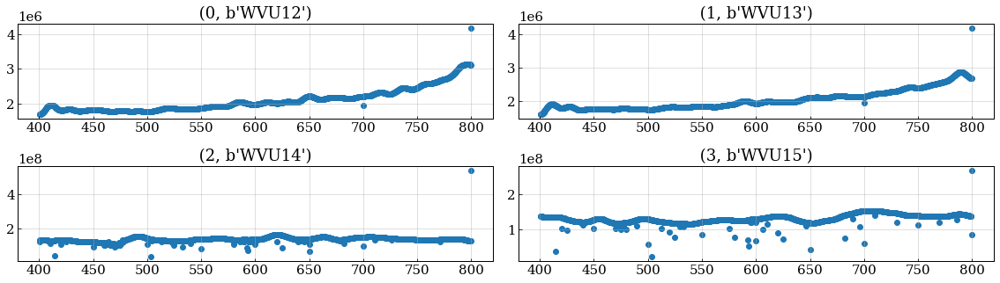

In [2]:
#Reading digital gains -- 
f = h5py.File("/Volumes/EXTRSSD/digital_gains_corr/20250313T174113Z_WVUc52_digitalgain/00000057.h5","r")

#Plotting digital gains -- 
print(list(f.attrs))
print(f.attrs['acquisition_name'])
print(f.attrs['archive_version'])
print(f.attrs['collection_server'])
print(f.attrs['git_version_tag'])
print(f.attrs['instrument_name'])
print(f.attrs['notes'])
print(f.attrs['system_user'])
print(f.attrs['type'])
print(f.attrs['version'])

print(list(f.items()))
print((f['compute_time']))
print((f['index_map']))
print((f['gain_coeff']))
print((f['gain_exp']))

inputs = (f['index_map']['input'][:])
frqs = f['index_map']['freq'][:]
gaincoeff = f['gain_coeff'][()]
gainexp = f['gain_exp'][()]
gain = gaincoeff.real*np.exp2(gainexp)

plt.figure(figsize=[16,18])
print(f"Calculating digital gains of the channels...")
i = 0
for i in np.arange(0,4,1):  
    plt.subplot(8,2,i+1)
    #Digital gain of every channel
    plt.scatter(frqs['centre'], gain[0][:,i]) # i referes to input channel (total 16 ch on iceboard); 
    #plt.title( " %s and gain_exp = %s and rms %s for rms i/p %s" %(inputs[i], gainexp[:,i], rms[i][2], rms[i][0][2]))
    plt.title( " %s " %(inputs[i]))
plt.tight_layout()

In [ ]:
"""Analysis of correlator data for correlation powers, waterfall and phase -- 
"""

In [49]:
#Reading correlation files -- 
file_path = '/Users/kalyanibhopi94/Downloads/20250412T194037Z_WVUc52/corr/*/*' 
corr_data = read_corr_mode_h5(file_path, f_start=33, f_stop=36) 
print("getting auto and cross-correlation magnitudes and phase")
pow_mag, pow_phase = get_mag_phase(corr_data.vis)
print("done getting pow_mag and pow_phase")
sat_data = corr_data.sat.real

corr_size=corr_data.vis[:,:,:].shape
print('corr data shape: {}'.format(corr_size)) # time bins - freq bins - corr indices

Reading File: /Users/kalyanibhopi94/Downloads/20250412T194037Z_WVUc52/corr/20250412T194134Z/0033
Appended vis data and time stream from /Users/kalyanibhopi94/Downloads/20250412T194037Z_WVUc52/corr/20250412T194134Z/0033
Reading File: /Users/kalyanibhopi94/Downloads/20250412T194037Z_WVUc52/corr/20250412T194134Z/0034
Appended vis data and time stream from /Users/kalyanibhopi94/Downloads/20250412T194037Z_WVUc52/corr/20250412T194134Z/0034
Reading File: /Users/kalyanibhopi94/Downloads/20250412T194037Z_WVUc52/corr/20250412T194134Z/0035
Appended vis data and time stream from /Users/kalyanibhopi94/Downloads/20250412T194037Z_WVUc52/corr/20250412T194134Z/0035
Done!!!!!!!
getting auto and cross-correlation magnitudes and phase
done getting pow_mag and pow_phase
corr data shape: (768, 1024, 10)


Each time bin is: 0.04194304 seconds
total time bins (considered for the plots) are 768
lowest time bin 0 and highest time bin 768
32.212254720000004 seconds of data (considered for the plots)


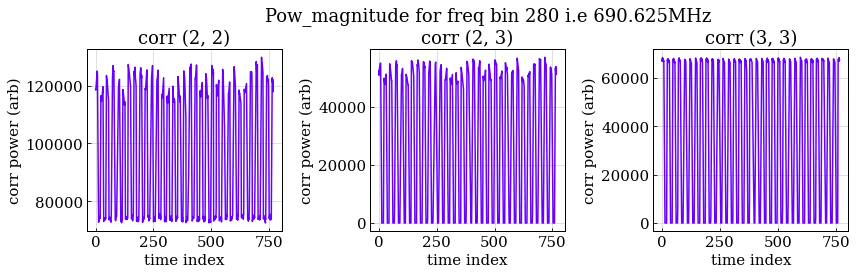

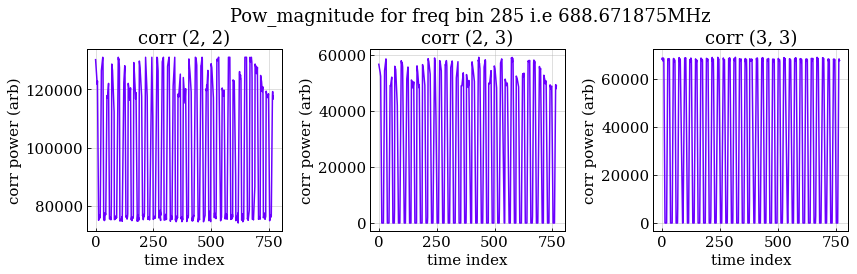

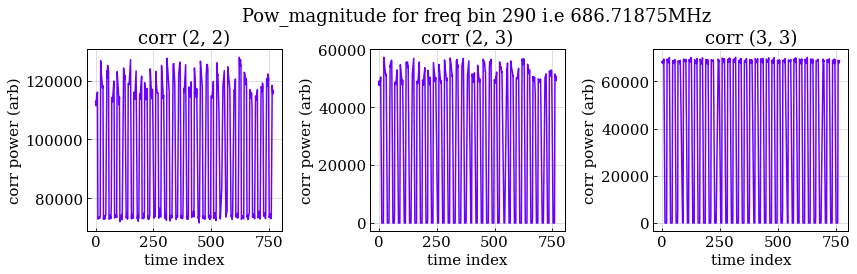

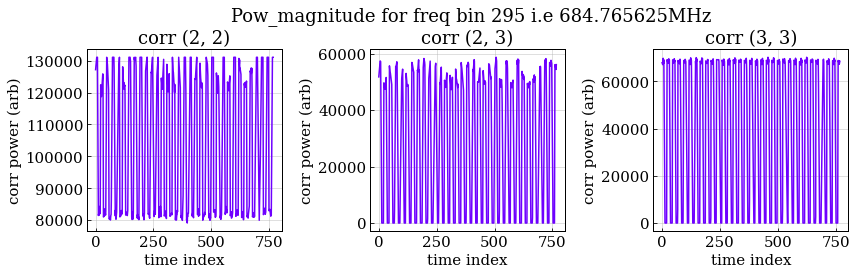

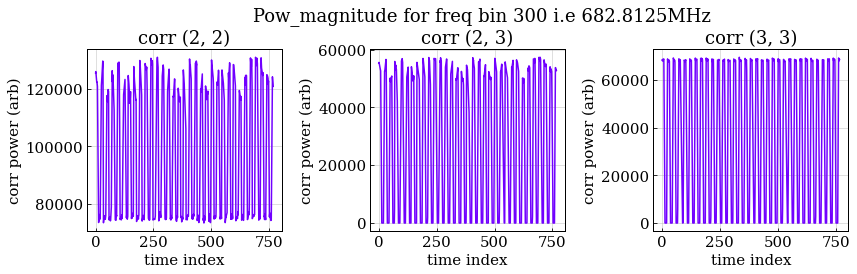

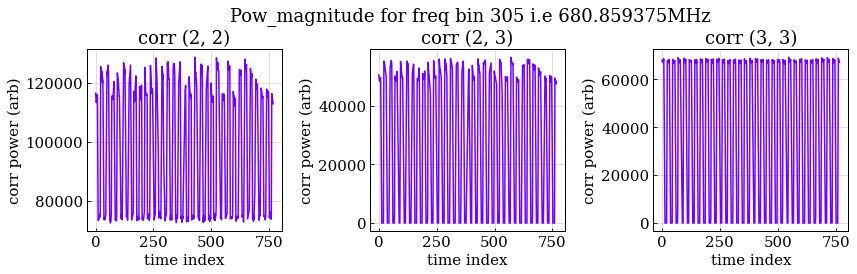

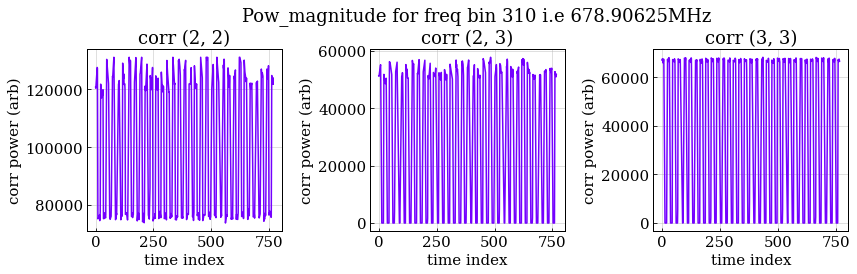

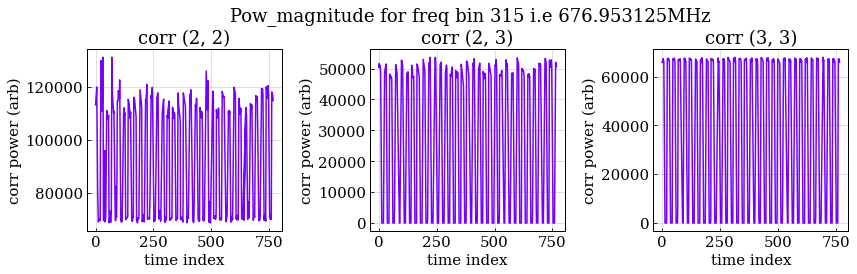

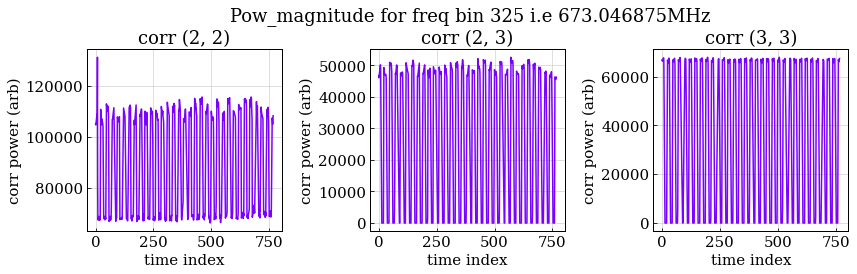

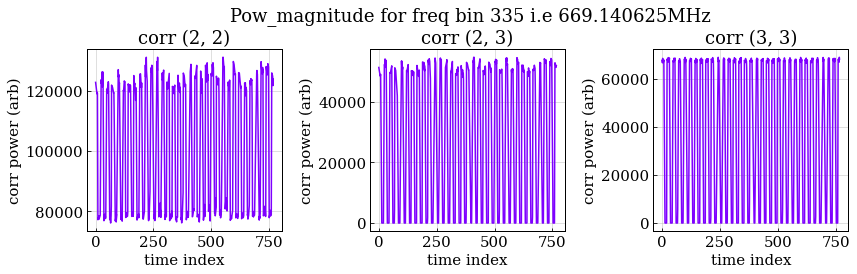

In [50]:
#Plotting correlation powers against time index for a given set of frequencies -- 
tmin,tmax=[0,corr_size[0]]
freq_arr=[280, 285, 290, 295, 300, 305, 310, 315, 325, 335]
corr_indices=[0,1,4]
dim1 = math.floor(math.sqrt(len(corr_indices)*len(freq_arr)))
dim2 = math.ceil(len(corr_indices)*len(freq_arr)/dim1)
for index,f_ind in enumerate(freq_arr):
    colorsarr=cm.gnuplot2(np.linspace(0,1,2048))
    fig = plt.figure(figsize=[20,20])
    freq=400+((1024-f_ind)*0.390625)
    for index, corr_index in enumerate(corr_indices): 
        ax=plt.subplot(dim2, dim1, index+1)
        ax.plot(pow_mag[tmin:tmax,f_ind,corr_index], c=colorsarr[f_ind+500])
        #plt.ylim(0,120000)
        plt.title(f"corr {corr_data.prod[corr_index]}")
        plt.xlabel("time index")
        plt.ylabel("corr power (arb)")
        plt.suptitle(f"Pow_magnitude for freq bin {f_ind} i.e {freq}MHz", ha='right')
    plt.tight_layout()

delta_time = np.diff(corr_data.time["irigb_time"])[1]*1e-9
print(f"Each time bin is: {delta_time} seconds")
print(f"total time bins (considered for the plots) are {len(corr_data.vis[tmin:tmax,0,0])}")
print(f"lowest time bin {tmin} and highest time bin {tmax}")
print(f"{delta_time*len(corr_data.vis[tmin:tmax,0,0])} seconds of data (considered for the plots)")

In [ ]:
#Plotting waterfall --
corr_indices=[0,1,4] 
plot_waterfall_corr_data(pow_mag[:,:,:],corr_indices)

In [ ]:
#Phase for a set of time index as a function of frequency:
t_ind_arr= [144,317,524,746,936]
corr_indices=[1]
plot_phase_corr_data(pow_phase[:,:,:], corr_indices, t_ind_arr)

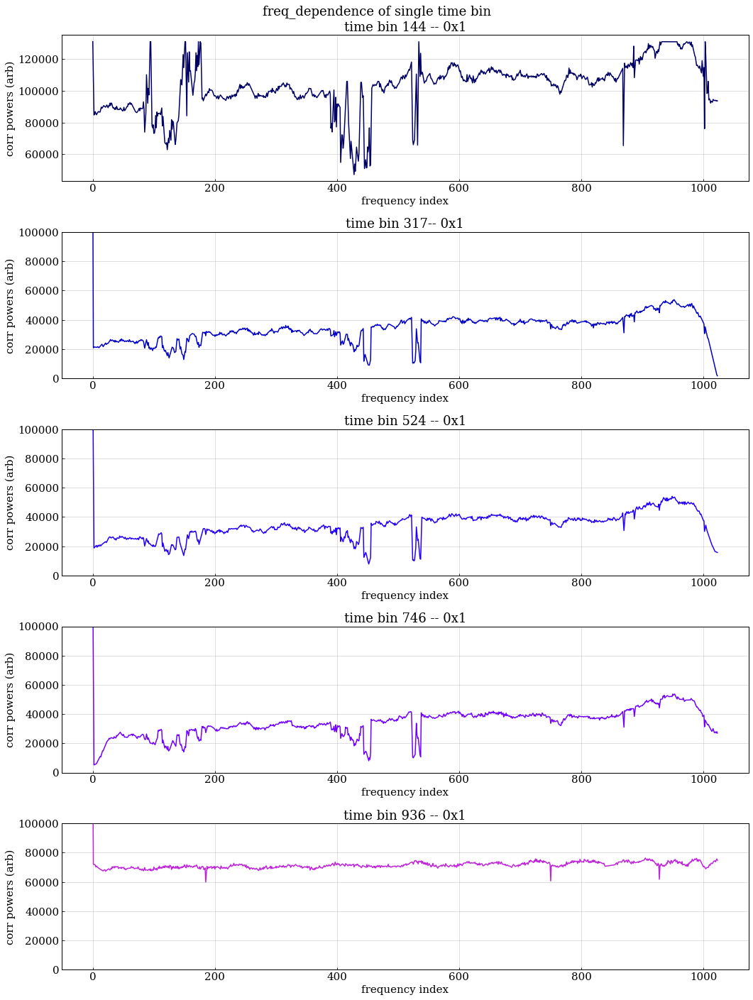

In [19]:
# plotting single time bin across the 400-800MHz band 

colorsarr=cm.gnuplot2(np.linspace(0,1,1024))
plt.figure(figsize=[15,20])
k=100
tb_1=144
tb_2=317
tb_3=524
tb_4=746
tb_5=936
plt.subplot(5,1,1)
plt.plot(pow_mag[tb_1,:,0], c=colorsarr[k]) 
#plt.ylim(0,100000)
plt.title("time bin {} -- 0x1".format(tb_1))
plt.xlabel('frequency index')
plt.ylabel('corr powers (arb)')
plt.subplot(5,1,2)
plt.plot(pow_mag[tb_2,:,1], c=colorsarr[k+100]) 
plt.ylim(0,100000)
plt.title("time bin {}-- 0x1".format(tb_2))
plt.xlabel('frequency index')
plt.ylabel('corr powers (arb)')
plt.subplot(5,1,3)
plt.plot(pow_mag[tb_3,:,1], c=colorsarr[k+200])
plt.ylim(0,100000)
plt.title("time bin {} -- 0x1".format(tb_3))
plt.xlabel('frequency index')
plt.ylabel('corr powers (arb)')
plt.subplot(5,1,4)
plt.plot(pow_mag[tb_4,:,1], c=colorsarr[k+300])
plt.ylim(0,100000)
plt.title("time bin {} -- 0x1".format(tb_4))
plt.xlabel('frequency index')
plt.ylabel('corr powers (arb)')
plt.subplot(5,1,5)
plt.plot(pow_mag[tb_5,:,4], c=colorsarr[k+400])
plt.ylim(0,100000)
plt.title("time bin {} -- 0x1".format(tb_5))
plt.xlabel('frequency index')
plt.ylabel('corr powers (arb)')

plt.suptitle(f"freq_dependence of single time bin")
plt.tight_layout()

### Saving Statistics  ###

In [4]:

## -- correlator data 
# reading the required only corr files for plotting beam pattern
file_path = '/Users/kalyanibhopi94/Downloads/Takeout-2/Drive/20250319T171034Z_WVUc52/corr/*/*' 

# reading files for 0 degrees angle between rx and tx
corr_data0 = read_corr_mode_h5(file_path, f_start=99, f_stop=100)
pow_mag0, pow_phase0 = get_mag_phase(corr_data0.vis)
# reading files for negative 5 degrees angle between rx and tx
corr_data5n = read_corr_mode_h5(file_path, f_start=98, f_stop=99)
pow_mag5n, pow_phase5n = get_mag_phase(corr_data5n.vis)
# reading files for negative 10 degrees angle between rx and tx
corr_data10n = read_corr_mode_h5(file_path, f_start=97, f_stop=98)
pow_mag10n, pow_phase10n = get_mag_phase(corr_data10n.vis)
# reading files for negative 15 degrees angle between rx and tx
corr_data15n = read_corr_mode_h5(file_path, f_start=96, f_stop=97)
pow_mag15n, pow_phase15n = get_mag_phase(corr_data15n.vis)
# reading files for negative 20 degrees angle between rx and tx
corr_data20n = read_corr_mode_h5(file_path, f_start=95, f_stop=96)
pow_mag20n, pow_phase20n = get_mag_phase(corr_data20n.vis)
# reading files for negative 25 degrees angle between rx and tx
corr_data25n = read_corr_mode_h5(file_path, f_start=94, f_stop=95)
pow_mag25n, pow_phase25n = get_mag_phase(corr_data25n.vis)
# reading files for negative 30 degrees angle between rx and tx
corr_data30n = read_corr_mode_h5(file_path, f_start=93, f_stop=94)
pow_mag30n, pow_phase30n = get_mag_phase(corr_data30n.vis)
# reading files for negative 35 degrees angle between rx and tx
corr_data35n = read_corr_mode_h5(file_path, f_start=92, f_stop=93)
pow_mag35n, pow_phase35n = get_mag_phase(corr_data35n.vis)
# reading files for negative 40 degrees angle between rx and tx
corr_data40n = read_corr_mode_h5(file_path, f_start=91, f_stop=92)
pow_mag40n, pow_phase40n = get_mag_phase(corr_data40n.vis)
# reading files for negative 45 degrees angle between rx and tx
corr_data45n = read_corr_mode_h5(file_path, f_start=90, f_stop=91)
pow_mag45n, pow_phase45n = get_mag_phase(corr_data45n.vis)
# reading files for negative 50 degrees angle between rx and tx
corr_data50n = read_corr_mode_h5(file_path, f_start=89, f_stop=90)
pow_mag50n, pow_phase50n = get_mag_phase(corr_data50n.vis)
# reading files for negative 55 degrees angle between rx and tx
corr_data55n = read_corr_mode_h5(file_path, f_start=88, f_stop=89)
pow_mag55n, pow_phase55n = get_mag_phase(corr_data55n.vis)
# reading files for negative 60 degrees angle between rx and tx
corr_data60n = read_corr_mode_h5(file_path, f_start=87, f_stop=88)
pow_mag60n, pow_phase60n = get_mag_phase(corr_data60n.vis)
# reading files for negative 65 degrees angle between rx and tx
corr_data65n = read_corr_mode_h5(file_path, f_start=86, f_stop=87)
pow_mag65n, pow_phase65n = get_mag_phase(corr_data65n.vis)
# reading files for negative 70 degrees angle between rx and tx
corr_data70n = read_corr_mode_h5(file_path, f_start=85, f_stop=86)
pow_mag70n, pow_phase70n = get_mag_phase(corr_data70n.vis)
# reading files for negative 75 degrees angle between rx and tx
corr_data75n = read_corr_mode_h5(file_path, f_start=84, f_stop=85)
pow_mag75n, pow_phase75n = get_mag_phase(corr_data75n.vis)
# reading files for negative 80 degrees angle between rx and tx 
corr_data80n = read_corr_mode_h5(file_path, f_start=83, f_stop=84)
pow_mag80n, pow_phase80n = get_mag_phase(corr_data80n.vis)
# reading files for negative 85 degrees angle between rx and tx 
corr_data85n = read_corr_mode_h5(file_path, f_start=82, f_stop=83)
pow_mag85n, pow_phase85n = get_mag_phase(corr_data85n.vis)
# reading files for negative 90 degrees angle between rx and tx 
corr_data90n = read_corr_mode_h5(file_path, f_start=81, f_stop=82)
pow_mag90n, pow_phase90n = get_mag_phase(corr_data90n.vis)
# reading files for negative 95 degrees angle between rx and tx 
corr_data95n = read_corr_mode_h5(file_path, f_start=80, f_stop=81)
pow_mag95n, pow_phase95n = get_mag_phase(corr_data95n.vis)
# reading files for negative 100 degrees angle between rx and tx 
corr_data100n = read_corr_mode_h5(file_path, f_start=79, f_stop=80)
pow_mag100n, pow_phase100n = get_mag_phase(corr_data100n.vis)
# reading files for negative 105 degrees angle between rx and tx 
corr_data105n = read_corr_mode_h5(file_path, f_start=78, f_stop=79)
pow_mag105n, pow_phase105n = get_mag_phase(corr_data105n.vis)
# reading files for negative 110 degrees angle between rx and tx 
corr_data110n = read_corr_mode_h5(file_path, f_start=77, f_stop=78)
pow_mag110n, pow_phase110n = get_mag_phase(corr_data110n.vis)
# reading files for negative 115 degrees angle between rx and tx 
corr_data115n = read_corr_mode_h5(file_path, f_start=76, f_stop=77)
pow_mag115n, pow_phase115n = get_mag_phase(corr_data115n.vis)
# reading files for negative 120 degrees angle between rx and tx 
corr_data120n = read_corr_mode_h5(file_path, f_start=75, f_stop=76)
pow_mag120n, pow_phase120n = get_mag_phase(corr_data120n.vis)
# reading files for negative 125 degrees angle between rx and tx 
corr_data125n = read_corr_mode_h5(file_path, f_start=74, f_stop=75)
pow_mag125n, pow_phase125n = get_mag_phase(corr_data125n.vis)
# reading files for negative 130 degrees angle between rx and tx 
corr_data130n = read_corr_mode_h5(file_path, f_start=73, f_stop=74)
pow_mag130n, pow_phase130n = get_mag_phase(corr_data130n.vis)
# reading files for negative 135 degrees angle between rx and tx 
corr_data135n = read_corr_mode_h5(file_path, f_start=72, f_stop=73)
pow_mag135n, pow_phase135n = get_mag_phase(corr_data135n.vis)

# reading files for positive 5 degrees angle between rx and tx
corr_data5p = read_corr_mode_h5(file_path, f_start=100, f_stop=101)
pow_mag5p, pow_phase5p = get_mag_phase(corr_data5p.vis)
# reading files for positive 10 degrees angle between rx and tx
corr_data10p = read_corr_mode_h5(file_path, f_start=101, f_stop=102)
pow_mag10p, pow_phase10p = get_mag_phase(corr_data10p.vis)
# reading files for positive 15 degrees angle between rx and tx
corr_data15p = read_corr_mode_h5(file_path, f_start=102, f_stop=103)
pow_mag15p, pow_phase15p = get_mag_phase(corr_data15p.vis)
# reading files for positive 20 degrees angle between rx and tx 
corr_data20p = read_corr_mode_h5(file_path, f_start=103, f_stop=104)
pow_mag20p, pow_phase20p = get_mag_phase(corr_data20p.vis)
# reading files for positive 25 degrees angle between rx and tx 
corr_data25p = read_corr_mode_h5(file_path, f_start=104, f_stop=105)
pow_mag25p, pow_phase25p = get_mag_phase(corr_data25p.vis)
# reading files for positive 30 degrees angle between rx and tx
corr_data30p = read_corr_mode_h5(file_path, f_start=105, f_stop=106)
pow_mag30p, pow_phase30p = get_mag_phase(corr_data30p.vis)
# reading files for positive 35 degrees angle between rx and tx
corr_data35p = read_corr_mode_h5(file_path, f_start=106, f_stop=107)
pow_mag35p, pow_phase35p = get_mag_phase(corr_data35p.vis)
# reading files for positive 40 degrees angle between rx and tx 
corr_data40p = read_corr_mode_h5(file_path, f_start=107, f_stop=108)
pow_mag40p, pow_phase40p = get_mag_phase(corr_data40p.vis)
# reading files for positive 45 degrees angle between rx and tx 
corr_data45p = read_corr_mode_h5(file_path, f_start=108, f_stop=109)
pow_mag45p, pow_phase45p = get_mag_phase(corr_data45p.vis)
# reading files for positive 50 degrees angle between rx and tx
corr_data50p = read_corr_mode_h5(file_path, f_start=109, f_stop=110)
pow_mag50p, pow_phase50p = get_mag_phase(corr_data50p.vis)
# reading files for positive 55 degrees angle between rx and tx
corr_data55p = read_corr_mode_h5(file_path, f_start=110, f_stop=111)
pow_mag55p, pow_phase55p = get_mag_phase(corr_data55p.vis)
# reading files for positive 60 degrees angle between rx and tx 
corr_data60p = read_corr_mode_h5(file_path, f_start=111, f_stop=112)
pow_mag60p, pow_phase60p = get_mag_phase(corr_data60p.vis)
# reading files for positive 65 degrees angle between rx and tx 
corr_data65p = read_corr_mode_h5(file_path, f_start=112, f_stop=113)
pow_mag65p, pow_phase65p = get_mag_phase(corr_data65p.vis)
# reading files for positive 70 degrees angle between rx and tx
corr_data70p = read_corr_mode_h5(file_path, f_start=113, f_stop=114)
pow_mag70p, pow_phase70p = get_mag_phase(corr_data70p.vis)
# reading files for positive 75 degrees angle between rx and tx
corr_data75p = read_corr_mode_h5(file_path, f_start=114, f_stop=115)
pow_mag75p, pow_phase75p = get_mag_phase(corr_data75p.vis)
# reading files for positive 80 degrees angle between rx and tx 
corr_data80p = read_corr_mode_h5(file_path, f_start=115, f_stop=116)
pow_mag80p, pow_phase80p = get_mag_phase(corr_data80p.vis)
# reading files for positive 85 degrees angle between rx and tx 
corr_data85p = read_corr_mode_h5(file_path, f_start=116, f_stop=117)
pow_mag85p, pow_phase85p = get_mag_phase(corr_data85p.vis)
# reading files for positive 90 degrees angle between rx and tx 
corr_data90p = read_corr_mode_h5(file_path, f_start=117, f_stop=118)
pow_mag90p, pow_phase90p = get_mag_phase(corr_data90p.vis)
# reading files for positive 95 degrees angle between rx and tx 
corr_data95p = read_corr_mode_h5(file_path, f_start=118, f_stop=119)
pow_mag95p, pow_phase95p = get_mag_phase(corr_data95p.vis)
# reading files for positive 100 degrees angle between rx and tx 
corr_data100p = read_corr_mode_h5(file_path, f_start=119, f_stop=120)
pow_mag100p, pow_phase100p = get_mag_phase(corr_data100p.vis)
# reading files for positive 105 degrees angle between rx and tx 
corr_data105p = read_corr_mode_h5(file_path, f_start=120, f_stop=121)
pow_mag105p, pow_phase105p = get_mag_phase(corr_data105p.vis)
# reading files for positive 110 degrees angle between rx and tx 
corr_data110p = read_corr_mode_h5(file_path, f_start=121, f_stop=122)
pow_mag110p, pow_phase110p = get_mag_phase(corr_data110p.vis)
# reading files for positive 115 degrees angle between rx and tx 
corr_data115p = read_corr_mode_h5(file_path, f_start=122, f_stop=123)
pow_mag115p, pow_phase115p = get_mag_phase(corr_data115p.vis)
# reading files for positive 120 degrees angle between rx and tx 
corr_data120p = read_corr_mode_h5(file_path, f_start=123, f_stop=124)
pow_mag120p, pow_phase120p = get_mag_phase(corr_data120p.vis)
# reading files for positive 125 degrees angle between rx and tx 
corr_data125p = read_corr_mode_h5(file_path, f_start=124, f_stop=125)
pow_mag125p, pow_phase125p = get_mag_phase(corr_data125p.vis)
# reading files for positive 130 degrees angle between rx and tx 
corr_data130p = read_corr_mode_h5(file_path, f_start=125, f_stop=126)
pow_mag130p, pow_phase130p = get_mag_phase(corr_data130p.vis)
# reading files for positive 135 degrees angle between rx and tx 
corr_data135p = read_corr_mode_h5(file_path, f_start=126, f_stop=127)
pow_mag135p, pow_phase135p = get_mag_phase(corr_data135p.vis)

print("getting autocorrelation magnitudes and phase")
print("done getting pow_mag and pow_phase")

Reading File: /Volumes/X10 Pro/yale_Apr25/corr_data/20250412T191307Z_WVUc52/corr/20250412T191403Z/0099
Appended vis data and time stream from /Volumes/X10 Pro/yale_Apr25/corr_data/20250412T191307Z_WVUc52/corr/20250412T191403Z/0099
Done!!!!!!!
Reading File: /Volumes/X10 Pro/yale_Apr25/corr_data/20250412T191307Z_WVUc52/corr/20250412T191403Z/0098
Appended vis data and time stream from /Volumes/X10 Pro/yale_Apr25/corr_data/20250412T191307Z_WVUc52/corr/20250412T191403Z/0098
Done!!!!!!!
Reading File: /Volumes/X10 Pro/yale_Apr25/corr_data/20250412T191307Z_WVUc52/corr/20250412T191403Z/0097
Appended vis data and time stream from /Volumes/X10 Pro/yale_Apr25/corr_data/20250412T191307Z_WVUc52/corr/20250412T191403Z/0097
Done!!!!!!!
Reading File: /Volumes/X10 Pro/yale_Apr25/corr_data/20250412T191307Z_WVUc52/corr/20250412T191403Z/0096
Appended vis data and time stream from /Volumes/X10 Pro/yale_Apr25/corr_data/20250412T191307Z_WVUc52/corr/20250412T191403Z/0096
Done!!!!!!!
Reading File: /Volumes/X10 P

Appended vis data and time stream from /Volumes/X10 Pro/yale_Apr25/corr_data/20250412T191307Z_WVUc52/corr/20250412T191403Z/0106
Done!!!!!!!
Reading File: /Volumes/X10 Pro/yale_Apr25/corr_data/20250412T191307Z_WVUc52/corr/20250412T191403Z/0107
Appended vis data and time stream from /Volumes/X10 Pro/yale_Apr25/corr_data/20250412T191307Z_WVUc52/corr/20250412T191403Z/0107
Done!!!!!!!
Reading File: /Volumes/X10 Pro/yale_Apr25/corr_data/20250412T191307Z_WVUc52/corr/20250412T191403Z/0108
Appended vis data and time stream from /Volumes/X10 Pro/yale_Apr25/corr_data/20250412T191307Z_WVUc52/corr/20250412T191403Z/0108
Done!!!!!!!
Reading File: /Volumes/X10 Pro/yale_Apr25/corr_data/20250412T191307Z_WVUc52/corr/20250412T191403Z/0109
Appended vis data and time stream from /Volumes/X10 Pro/yale_Apr25/corr_data/20250412T191307Z_WVUc52/corr/20250412T191403Z/0109
Done!!!!!!!
Reading File: /Volumes/X10 Pro/yale_Apr25/corr_data/20250412T191307Z_WVUc52/corr/20250412T191403Z/0110
Appended vis data and time s

In [49]:
"""
    WTyndall's function for identifying pulse sections and computing stats - 41.9ms time bin
"""

def Extract_Source_Pulses(self,f_ind):
    ## If we don't have any variables, then we haven't loaded a yaml yet... and must run the function:
        pow_mag, pow_phase = get_mag_phase(self.vis)
        Period=0.9998e6
        Dutycycle=0.5e6
        t_bounds=[0,-1]
        minmaxpercents=[0.0001,100]
        ## Create Switch Signal
        self.pulse_period=Period
        self.pulse_dutycycle=Dutycycle
        delta_time = np.diff(self.time["irigb_time"])[1]*1e-9
        concat_duration=int(np.ceil(delta_time*len((self.vis)))) #actual full time in seconds
        time_s,time_dt,switch=tu.Pulsed_Data_Waveform(total_duration=concat_duration,period=self.pulse_period,duty_cycle_on=self.pulse_dutycycle)
        ## Create t_offset range (1 period) and Pearson_r vars:
        t_offset_dist=np.arange(-1.0*self.pulse_period*1e-6,0.0,0.001)
        n_channels = 3
        Pr_arr=np.NaN*np.ones((n_channels,t_offset_dist.shape[0]))
        Pr_max_ind_per_channel=np.NaN*np.ones(n_channels) 
        Pr_max_t_0_per_channel=np.NaN*np.ones(n_channels)
        # Given parameters
        num_bins = len(pow_mag[:,f_ind,1])
        time_bin_width = np.diff(self.time["irigb_time"])[1]*1e-9 # seconds
        # Create the array of time values
        t_full = np.arange(num_bins) * time_bin_width
        #t_full=np.array([(m-self.t_arr_datetime[0]).total_seconds() for m in self.t_arr_datetime[:]])

    
        ## Loop over channels to find/plot a time offset solution with some clever fitting:
        fig1,ax1=plt.subplots(nrows=1,ncols=1,figsize=(16,4))
        
        for i in range(n_channels):
            ## If we use a mean subtracted data cut we can find where power exceeds zero to find signal
            minsubdata=self.vis[:,f_ind,i]-np.percentile(self.vis[:,f_ind,i],minmaxpercents[0])
            normminsubdata=minsubdata/np.percentile(minsubdata,minmaxpercents[1])
            clipnormminsubdata=normminsubdata.clip(0,1)
            stepped_func=interpolate.interp1d(t_full,clipnormminsubdata,kind='previous',fill_value='extrapolate')
            sniparr=np.where(time_s[np.where(time_s<=t_full[t_bounds[1]])[0]]>=t_full[t_bounds[0]])[0]
            t_restrict=np.intersect1d(np.arange(len(time_s))[~np.isnan(stepped_func(time_s))],sniparr)
            
            #plt.plot(stepped_func(time_s[t_restrict]))
            #shiftedswitch=np.interp(time_s,time_s+t_offset_dist[265],switch)
            #plt.plot(shiftedswitch[t_restrict]+0.5)
            #print(pearsonr(stepped_func(time_s[t_restrict]).real,(shiftedswitch[t_restrict]+0.5))[0])
            
            
            ## Loop over all time offsets in t_offset_dist to find maximum correlation between squarewave and data:
            for j,t_offset in enumerate(t_offset_dist):
                shiftedswitch=np.interp(time_s,time_s+t_offset,switch)
                try:
                    Pr_arr[i,j]=pearsonr(stepped_func(time_s[t_restrict]).real,(shiftedswitch[t_restrict]))[0]
                except ValueError:
                    Pr_arr[i,j]=np.NAN
                    print(str(j)+" failed: " +str(t_offset))
            
            
            ax1.plot(t_offset_dist,Pr_arr[i,:],'.',label=str(i))
           
            
            try:
                maxPrind=np.where(Pr_arr[i,:]==np.nanmax(Pr_arr[i,:]))[0][0]
                
                ax1.plot(t_offset_dist[maxPrind],Pr_arr[i,maxPrind],'ro')

                
                Pr_max_ind_per_channel[i]=maxPrind
                Pr_max_t_0_per_channel[i]=t_offset_dist[maxPrind]
            except IndexError:
                Pr_max_ind_per_channel[i]=np.NAN
                Pr_max_t_0_per_channel[i]=np.NAN
        self.t_delta_pulse=Pr_max_t_0_per_channel[0]   
        ax1.axvline(self.t_delta_pulse,label="selected t_offset")
        ax1.legend(loc=1)
        plt.tight_layout()
        print("Maximum Pearson_R Correlations between data and square wave function:")
        print("  --> t_indices = {}".format(Pr_max_ind_per_channel))
        print("  --> t_deltas = {}".format(np.around(Pr_max_t_0_per_channel,decimals=3)))
        print("Selecting square wave function time offset:")
        print("  --> t_delta_pulse = {:.10f}".format(self.t_delta_pulse))
    
        #if self.save_traceback==True:
            #savefig(self.Output_Directory+self.Output_Prefix+"_t_delta_pulse_Pearson_R.png")
        #if self.save_traceback==False:
            #pass
    #elif self.traceback==False:
        #pass
        
        
        t_arr_datetime = t_full 
    ## Interpolate the switching function with the concat timestamps using either input or found t_delta_pulse:
        num_bins = len(pow_mag[:,f_ind,1])
        time_bin_width = np.diff(self.time["irigb_time"])[1]*1e-9 # seconds
        # Create the array of time values
        t_for_interp_out=np.arange(num_bins) * time_bin_width #defining same as t_full
        t_for_interp_in=np.array([m.total_seconds() for m in time_dt])
        switch_interp_f=np.interp(t_for_interp_out,t_for_interp_in+self.t_delta_pulse,switch)
        self.switch_signal=switch
        self.switch_time=t_for_interp_in
        self.switch_signal_interp=switch_interp_f
        #print(switch_interp_f)
        
        ## Once we have our time offset, we must extract indices where the source is on/off/rising:
        self.inds_span=np.union1d(list(set(np.where(np.diff(np.sign(switch_interp_f)))[0])),\
                                  np.intersect1d(np.where(1>switch_interp_f),np.where(switch_interp_f>0))).tolist()
    
        self.inds_on=list(set(np.where(switch_interp_f==1)[0])-set(self.inds_span))
        self.inds_off=list(set(np.where(switch_interp_f==0)[0])-set(self.inds_span))
        
        # Add this code snippet after interpolating switch_interp_f in Extract_Source_Pulses function


        #print("Inds span: " + str(self.inds_span))
        #print("Inds on: " + str(self.inds_on))
        #print("Inds off: " + str(self.inds_off))



    ## Each of these lists of indices should also have no overlap. Let's print to see:
        print("Finding relevant pulsing indices and checking for overlaps:")
        print("  --> on/off ind intersection:",np.intersect1d(self.inds_on,self.inds_off))
        print("  --> on/span ind intersection:",np.intersect1d(self.inds_on,self.inds_span))
        print("  --> off/span ind intersection:",np.intersect1d(self.inds_off,self.inds_span))

    
        channel_indices = [0,1,4] 
        on_avgs = []
        on_stds=[]
        off_avgs = []
        on_var = []
        off_var = []
        fig3=plt.figure(figsize=(16,int(4*n_channels/2)))
        
        for i in range(n_channels):
            all_data = pow_mag[:,f_ind,channel_indices[i]]
            
            
            # Assume self.inds_on and all_data are already defined

            # Calculate z-scores
            #z_scores = np.abs((all_data[self.inds_on] - np.mean(all_data[self.inds_on])) / np.mean(all_data[self.inds_on]))
            #print(z_scores)
            # Identify outliers
            #outlier_indices = np.where(z_scores > .3)[0]
            #Print outliers if any
            #print("Outlier indices:", outlier_indices)  # Check the values of outlier_indices
            #print("Outlier Z values:", z_scores[outlier_indices])
            # Remove outliers
            #inds_on_clean = np.delete(self.inds_on, outlier_indices)
            # Calculate mean and std with cleaned indices
            on_avgs.append(np.nanmean(all_data[self.inds_on]))
            on_stds.append(np.nanstd(all_data[self.inds_on]))
            off_avgs.append(np.nanmean(all_data[self.inds_off]))
            on_var.append(np.nanvar(all_data[self.inds_on]))
            off_var.append(np.nanvar(all_data[self.inds_off]))

            
            ax=fig3.add_subplot(n_channels,1,i+1)
            ax.plot(t_arr_datetime[:],all_data[:],label='data')
            ax.scatter(t_arr_datetime[self.inds_on],all_data[self.inds_on],label='on',color='red',s=10)
            ax.scatter(t_arr_datetime[self.inds_off],all_data[self.inds_off],label='off',color='green',s=10)
            ax.scatter(t_arr_datetime[self.inds_span],all_data[self.inds_span],label='span',color='blue',s=10)
            #ax.semilogy(t_arr_datetime[:],self.vis[:,f_ind,i],'k.',label='all')
            #plt.plot(t_arr_datetime[:],self.vis[:,f_ind,i],'k.',label='all')
            #ax.semilogy(t_arr_datetime[self.inds_on],self.vis[self.inds_on,f_ind,i],'.',label='on')
            #ax.semilogy(t_arr_datetime[self.inds_off],self.vis[self.inds_off,f_ind,i],'.',label='off')
            #ax.semilogy(t_arr_datetime[self.inds_span],self.vis[self.inds_span,f_ind,i],'x',label='span')
            #ax.semilogy(t_arr_datetime[:],(np.nanmax(self.vis[self.inds_on,f_ind,i])*switch_interp_f)+np.nanmin(self.vis[self.inds_on,f_ind,i]),'--',alpha=0.5,label='switch, t_offset={:.2f}'.format(self.t_delta_pulse))
            ax.set_ylabel("Log Power Received [$ADU^2$]")
            ax.set_xlabel("Datetime")
            #ax.set_title("Channel {}".format(self.chmap[i]))
            ax.legend(loc=3)
            #ax.set_xlim(t_arr_datetime[t_bounds[0]],t_arr_datetime[t_bounds[1]])
            
        # Visualize alignment of switch_interp_f with actual data
        fig_align, ax_align = plt.subplots(figsize=(12, 6))
        ax_align.plot(t_arr_datetime, all_data, label='Actual Data')
        ax_align.plot(t_arr_datetime, switch_interp_f * np.nanmax(all_data), label='Interpolated Switch')
        ax_align.set_xlabel('Datetime')
        ax_align.set_ylabel('Data / Interpolated Switch')
        ax_align.set_title('Alignment of Interpolated Switch with Actual Data')
        ax_align.legend()
        plt.tight_layout()
        plt.show()
        
        print("Frequency bin: "+str(f_ind))

        return on_avgs, on_stds, off_avgs, on_var, off_var, self.inds_on, self.inds_off, self.inds_span

Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [923. 905. 918.]
  --> t_deltas = [-0.077 -0.095 -0.082]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.0768000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[0.00982727 0.00763022 0.00393642 0.0005431  0.01347346 0.00161538
 0.00732315 0.00798244 0.0118388  0.01911144 0.00181406 0.02182741
 0.01568613 0.0131664  0.0228931  0.04042284 0.01561388 0.02795965
 0.0408744  0.04070281 0.01699812 0.0338776  0.03108693 0.03180943
 0.04411005 0.04217736 0.03758946 0.03921509 0.03808618 0.0440378
 0.04239411 0.05216596 0.0471536  0.05493857 0.04585309 0.06435821
 0.06367183 0.06251582 0.07393138 0.0567087  0.06180235 0.07807674
 0.03905253 0.04684653 0.03176428 0.03068052 0.03059021 0.01721487
 0.00829195 0.02261558 0.01197672 0.00763267 0.00842742 0.0672548
 0.061230

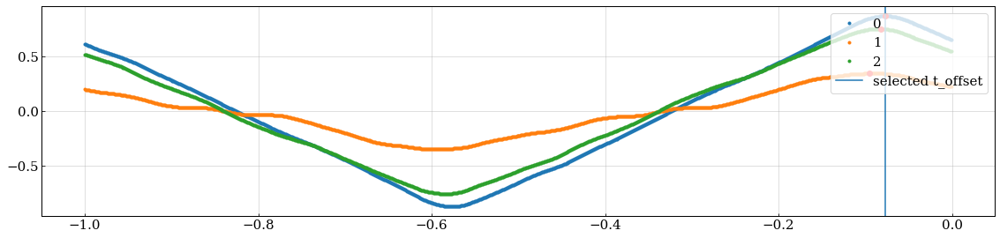

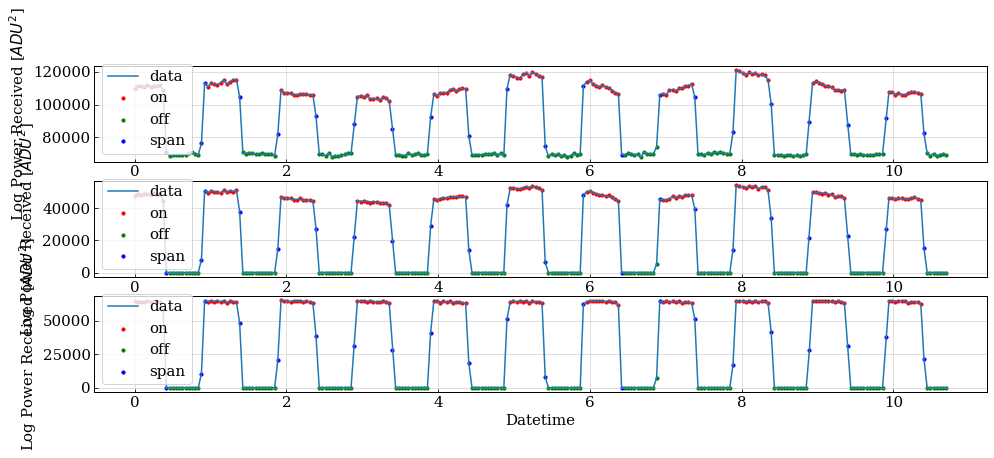

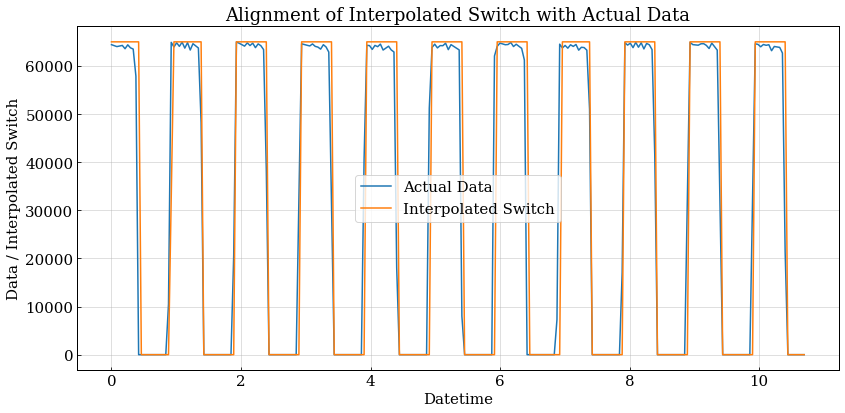

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [657. 657. 652.]
  --> t_deltas = [-0.343 -0.343 -0.348]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.3428000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[0.08381656 0.07498913 0.07524652 0.06638097 0.06403589 0.06161454
 0.04846874 0.05135719 0.03583771 0.05432191 0.04629525 0.03109035
 0.00625726 0.01957466 0.02129268 0.02394282 0.01730795 0.0183661
 0.02333271 0.02777502 0.02865204 0.02081604 0.03660244 0.01485801
 0.01632607 0.02572546 0.03396184 0.04292273 0.01942424 0.03689796
 0.05209333 0.04211243 0.04791794 0.04678353 0.034734   0.01212208
 0.05112098 0.05164529 0.05154042 0.04120681 0.05717434 0.04998657
 0.05856614 0.03753666 0.04184551 0.04948133 0.02608771 0.04088269
 0.02770829 0.02334225 0.02170259 0.01304676 0.03811817 

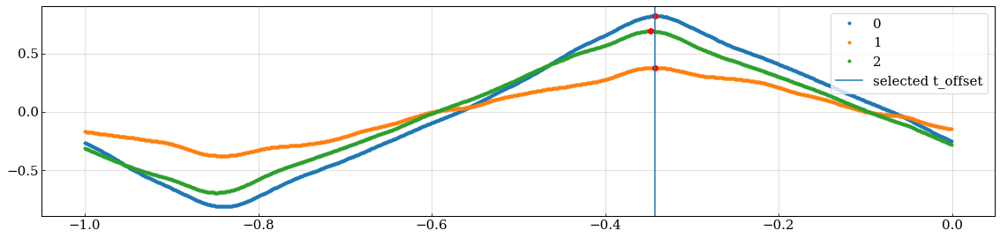

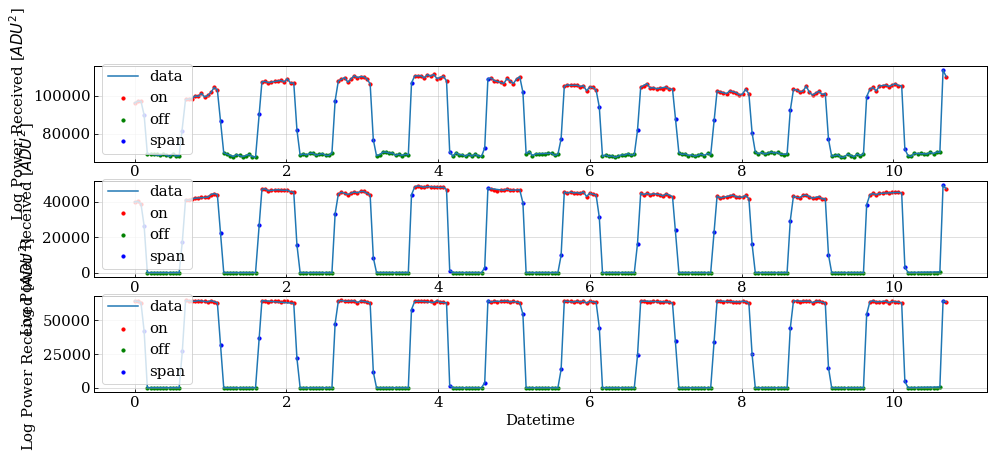

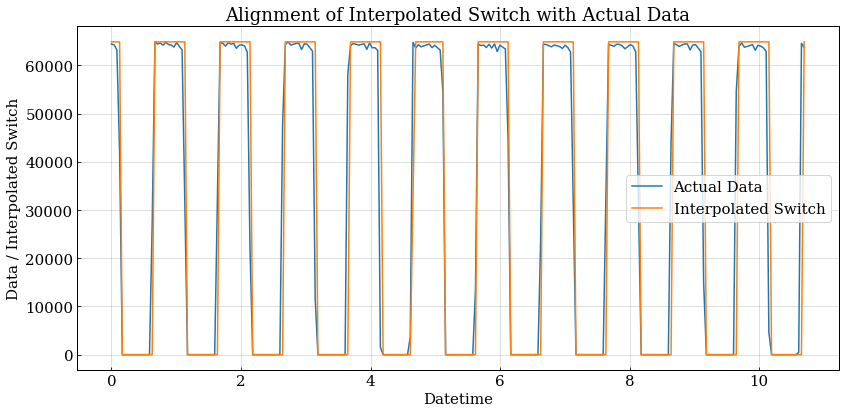

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [392. 400. 397.]
  --> t_deltas = [-0.608 -0.6   -0.603]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.6078000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[0.00871528 0.00195385 0.00442243 0.00336605 0.01622284 0.03263428
 0.02035244 0.02979919 0.03313711 0.04832892 0.04722698 0.06708333
 0.06503992 0.07742874 0.07924748 0.07271072 0.0644729  0.06416265
 0.05811802 0.05989396 0.05331441 0.06178759 0.00127708 0.00273207
 0.00489316 0.00745286 0.01212809 0.00406938 0.00237902 0.00277763
 0.00089471 0.00170779 0.0565909  0.05848453 0.05112399 0.02826137
 0.05744678 0.06168337 0.03353572 0.03895984 0.0419982  0.03219841
 0.0113792  0.02981265 0.04492958 0.03165279 0.02937401 0.04363506
 0.04819261 0.04735813 0.03974082 0.03564331 0.04194471

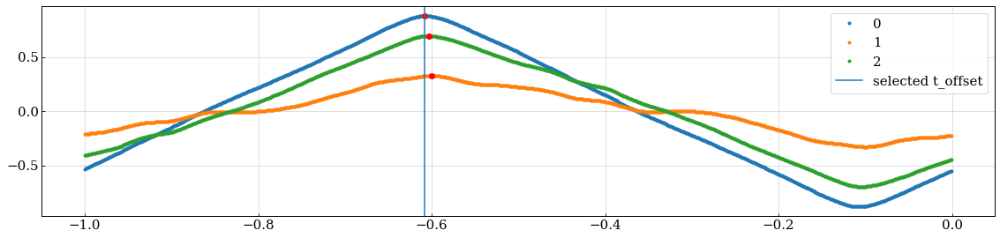

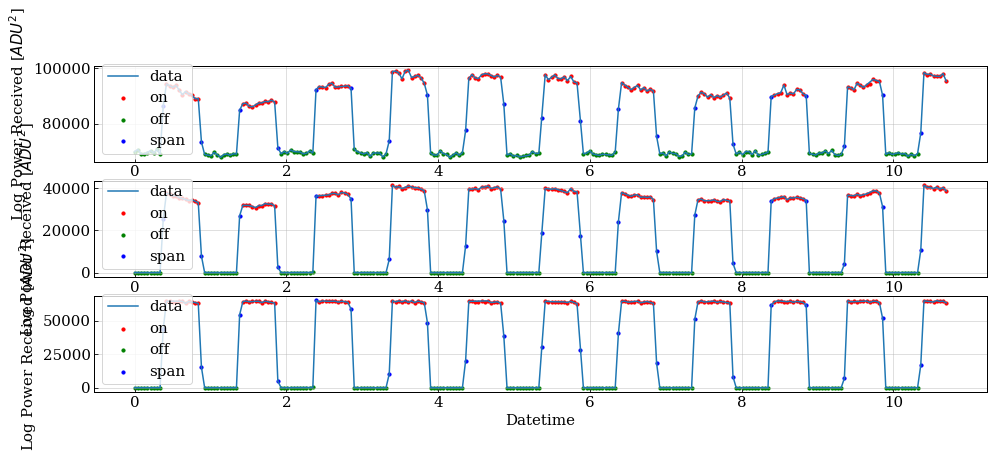

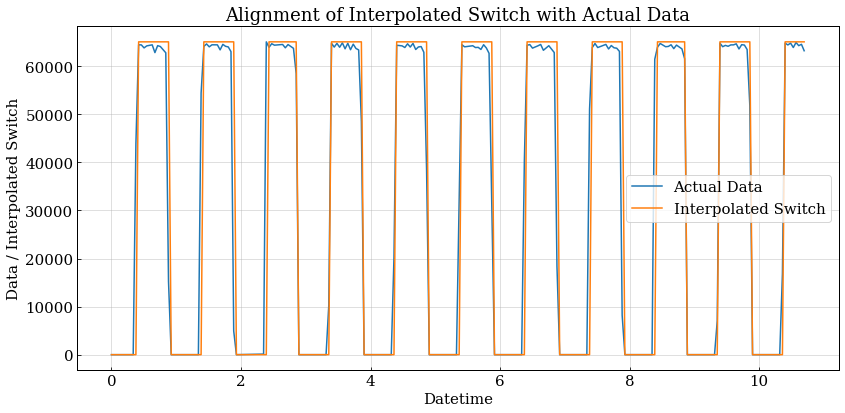

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [129. 148. 135.]
  --> t_deltas = [-0.871 -0.852 -0.865]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.8708000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[3.53626701e-02 2.85429579e-02 4.37517239e-02 6.28723045e-02
 3.64704407e-02 1.94730869e-02 2.89468326e-02 4.42587076e-03
 1.06916977e-02 3.22586049e-02 2.99276711e-02 4.58630392e-03
 1.25841390e-02 1.23995106e-02 9.67624141e-03 1.02762838e-02
 1.62420895e-02 1.05416871e-02 1.18802432e-02 2.74001974e-03
 4.03241867e-03 6.27215494e-03 2.38684344e-02 3.83625097e-03
 1.13829376e-02 1.99566198e-02 1.09444451e-02 2.39953664e-02
 3.77617229e-02 2.67301749e-02 3.03996647e-02 2.90264908e-02
 3.28113734e-02 2.19298360e-02 1.76949216e-02 2.18144432e-02
 1.50531719e-03 1.08982880e-02 1.36100179e

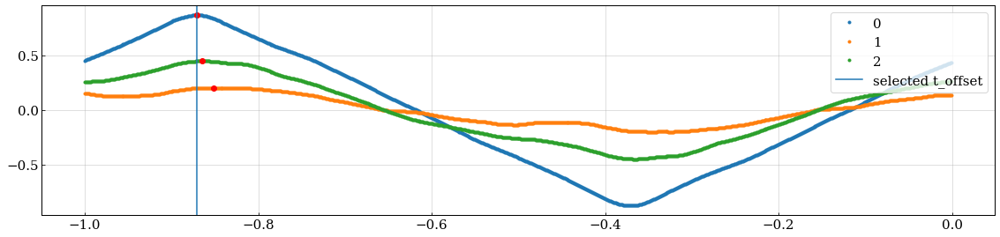

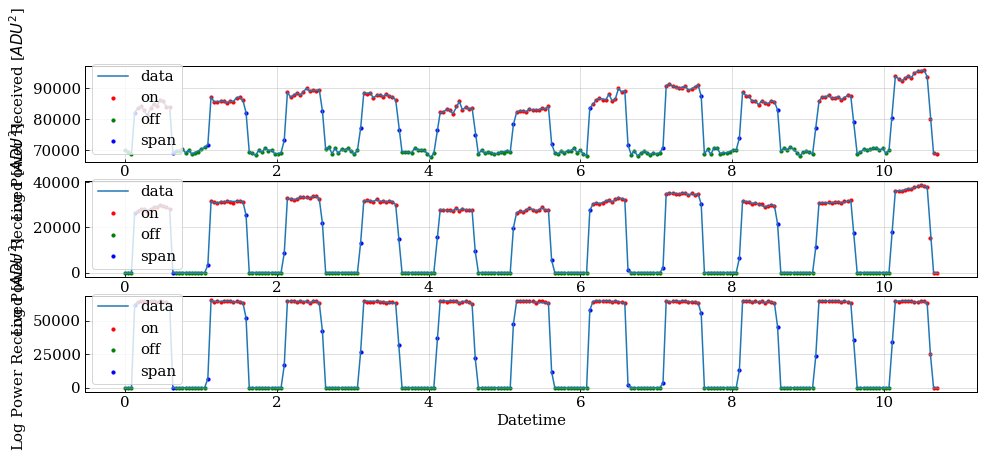

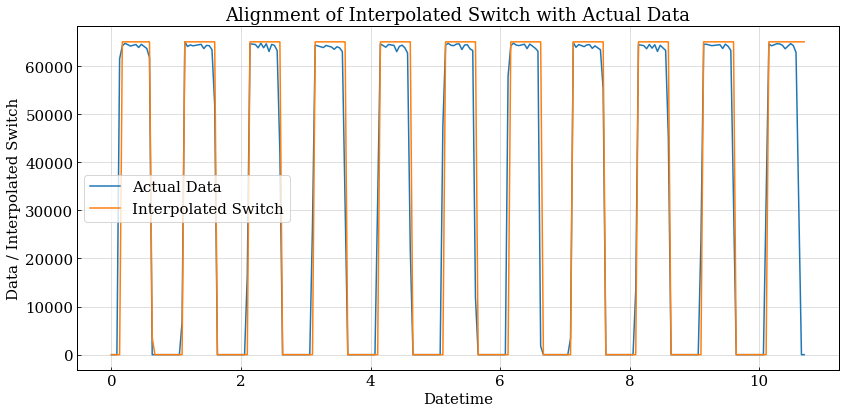

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [863. 220. 861.]
  --> t_deltas = [-0.137 -0.78  -0.139]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.1368000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[0.01884112 0.03902471 0.02125647 0.03162449 0.04551276 0.04899446
 0.05243762 0.05589362 0.05261748 0.05147405 0.03833094 0.05534117
 0.03849796 0.03852366 0.04372694 0.02857961 0.0401553  0.04323873
 0.04628361 0.00986043 0.02654947 0.01146638 0.02295214 0.01769747
 0.01462689 0.02349174 0.03258785 0.02485359 0.00919235 0.00678985
 0.03962833 0.04048912 0.03923006 0.03466916 0.03208679 0.05898968
 0.01976593 0.02220698 0.02101215 0.04444619 0.02924747 0.00696972
 0.02570153 0.01146638 0.00628879 0.01907216 0.01447272 0.00601921
 0.0059933  0.01947066 0.00718834 0.0101176  0.00055898

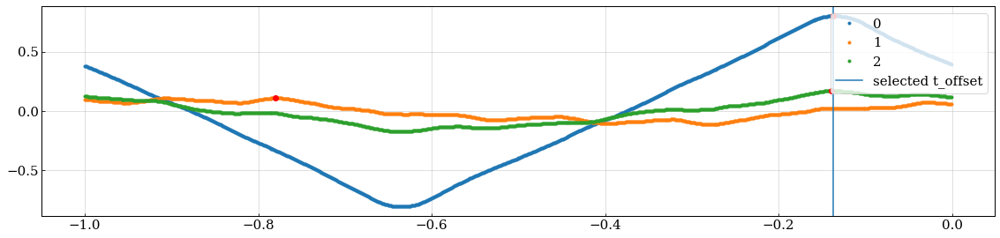

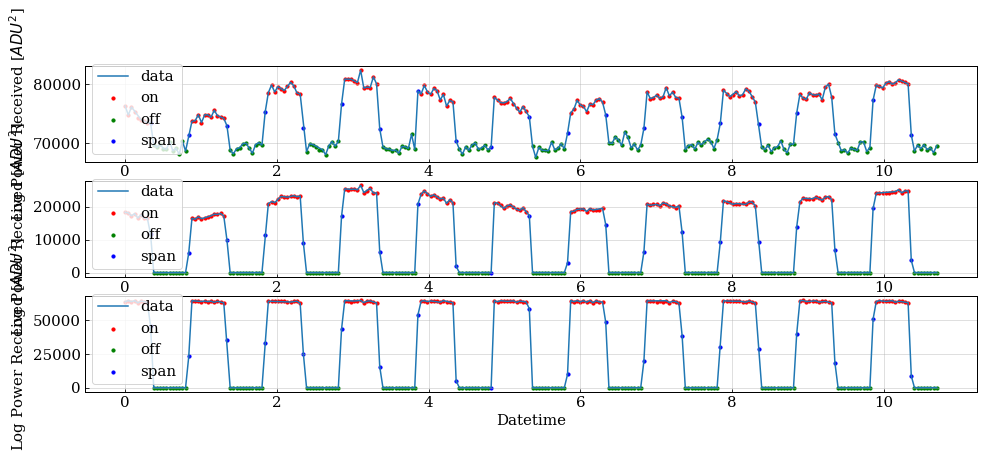

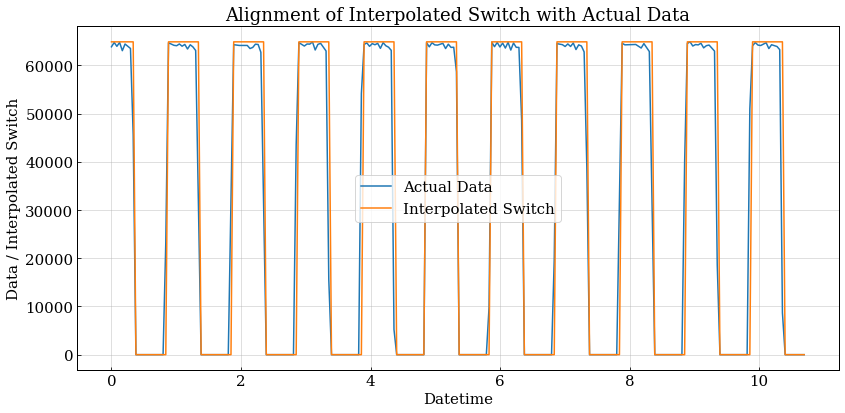

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [601. 925.  16.]
  --> t_deltas = [-0.399 -0.075 -0.984]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.3988000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[0.00410113 0.01017622 0.00732419 0.02252052 0.03180347 0.03537281
 0.01959047 0.03221634 0.02571694 0.0251043  0.05008967 0.05022285
 0.03541276 0.03131068 0.02303994 0.01743288 0.00095798 0.01819203
 0.00214332 0.01856683 0.02176326 0.01106856 0.00219848 0.0275035
 0.01184103 0.00029206 0.00418104 0.01255834 0.00744594 0.00680477
 0.00070493 0.0096568  0.02856709 0.01056246 0.0147026  0.03678456
 0.01415655 0.0304583  0.0345737  0.03755703 0.05044927 0.03750375
 0.03711752 0.04271126 0.03156373 0.01534377 0.01438485 0.0169553
 0.01754131 0.02531928 0.02794301 0.02978095 0.01787427 0

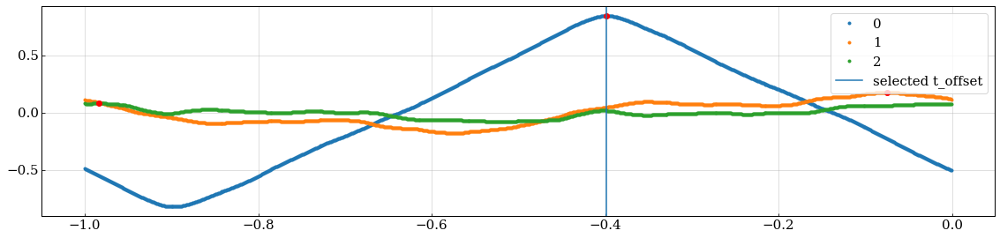

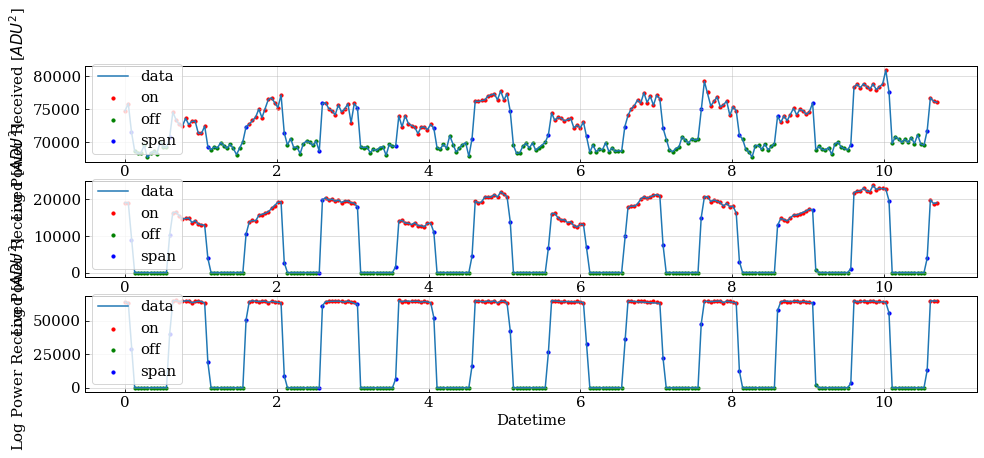

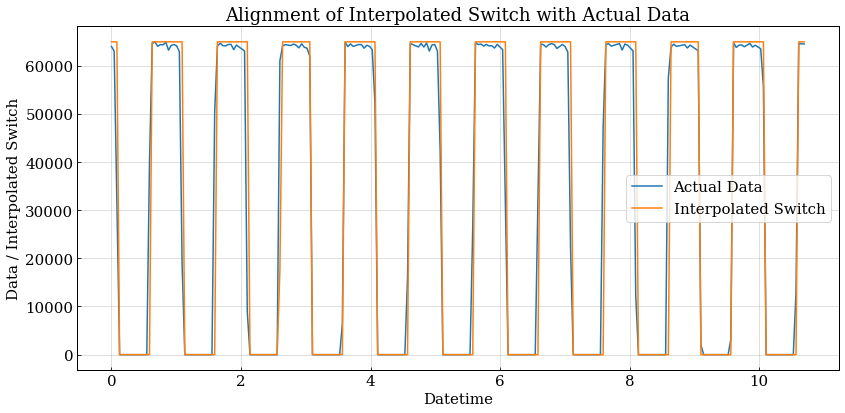

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [343. 514. 607.]
  --> t_deltas = [-0.657 -0.486 -0.393]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.6568000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[0.02271687 0.03313295 0.03000258 0.01322881 0.03476738 0.03059818
 0.03619405 0.04577906 0.02079155 0.03536298 0.03836869 0.02527933
 0.02034832 0.03109682 0.02127634 0.03367314 0.02671985 0.02400502
 0.00922583 0.02374185 0.01466934 0.01543115 0.03764843 0.04521117
 0.0307644  0.0242959  0.01543115 0.01291024 0.02363104 0.02052838
 0.03122148 0.02159492 0.03149851 0.01092952 0.00976602 0.00027608
 0.00939204 0.01520953 0.02207971 0.00210443 0.00480541 0.01583094
 0.0076745  0.0331726  0.05163621 0.00868374 0.04242519 0.00516743
 0.00494392 0.00624593 0.00080242 0.03857456 0.01085837

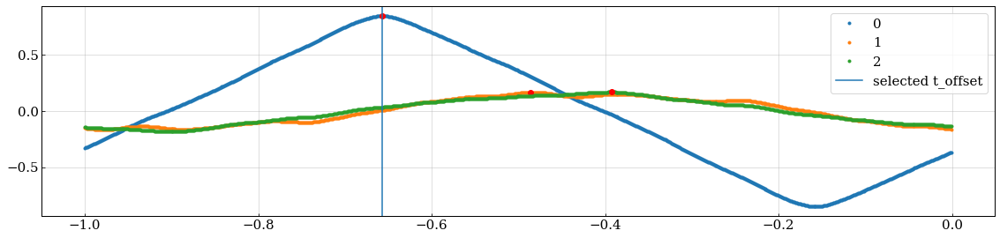

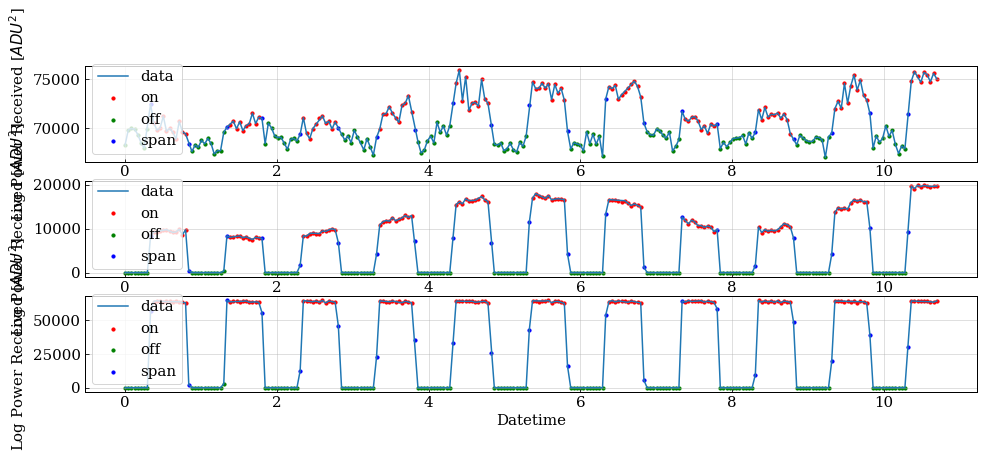

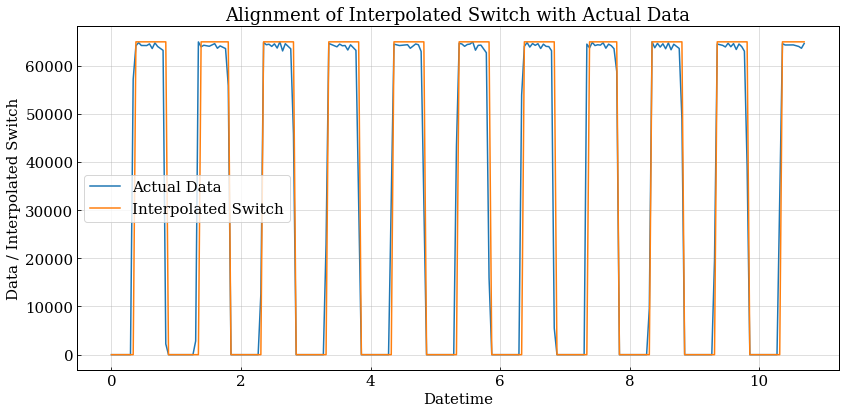

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [ 77. 169. 112.]
  --> t_deltas = [-0.923 -0.831 -0.888]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.9228000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[1.68537515e-02 2.49584064e-02 3.10579304e-02 2.82114859e-02
 2.18455459e-02 2.72159314e-02 2.63465740e-02 2.27850128e-02
 3.32313241e-02 3.59375496e-02 3.24040323e-02 9.82097999e-04
 5.55221782e-05 2.10334068e-02 8.70816175e-03 9.31110320e-03
 1.37560437e-02 1.43028976e-02 2.75535877e-02 1.42888757e-02
 1.03627453e-02 2.17485234e-02 2.74694563e-02 1.67847729e-02
 1.38822407e-02 2.41883330e-02 2.22392897e-02 1.92105606e-02
 2.31086472e-02 3.33165862e-02 1.41677672e-03 3.36468923e-03
 6.38052730e-03 2.73370399e-03 2.17614145e-02 2.39067644e-02
 1.20161980e-02 1.78493060e-02 2.03592251e

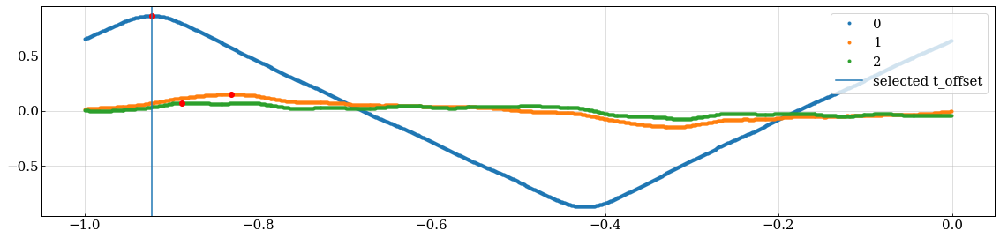

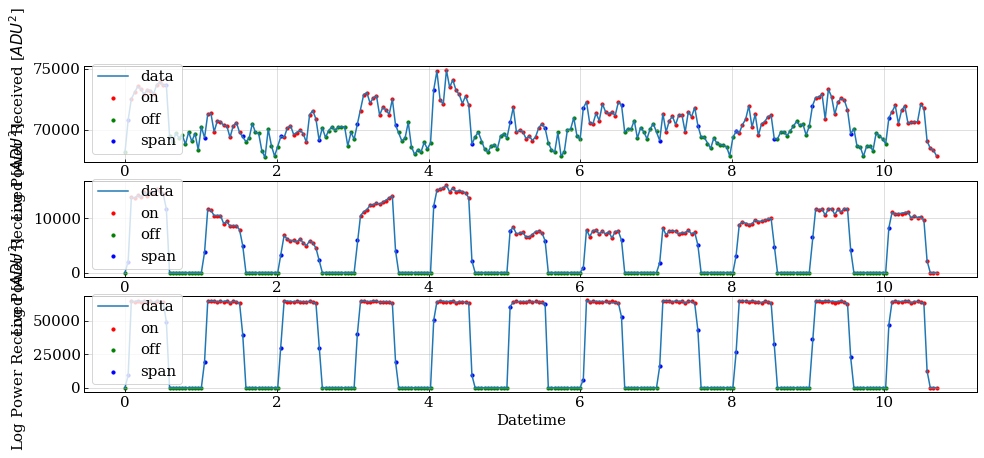

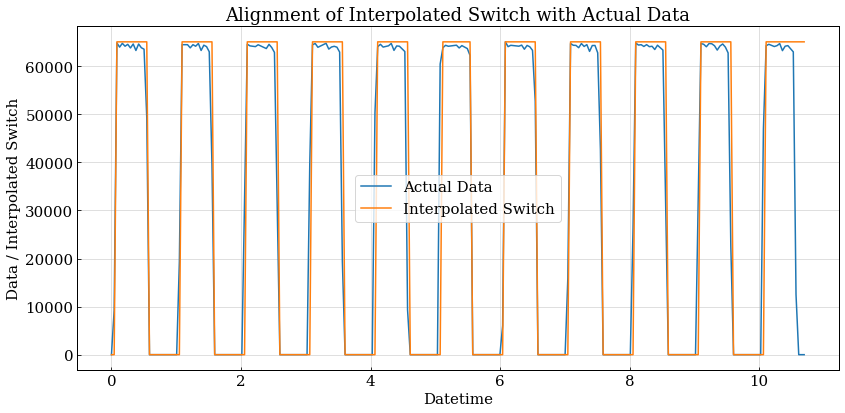

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [814. 163. 174.]
  --> t_deltas = [-0.186 -0.837 -0.826]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.1858000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[0.04508807 0.0188755  0.00752558 0.00555971 0.00551031 0.00442612
 0.00551031 0.01838568 0.01695819 0.011934   0.0252852  0.0241516
 0.01427116 0.01252179 0.04125345 0.02191241 0.00472659 0.02097475
 0.00784747 0.02312997 0.03418599 0.01235385 0.03580941 0.03996591
 0.01373935 0.01746201 0.00357242 0.00178765 0.00457265 0.00881312
 0.00017165 0.01252179 0.00089197 0.00264134 0.03928016 0.02991753
 0.01569864 0.02828012 0.02265414 0.01040855 0.00875714 0.00215152
 0.01551671 0.00068946 0.01592998 0.0061335  0.00072403 0.01407523
 0.00487396 0.0003116  0.00567167 0.03280791 0.02371118 

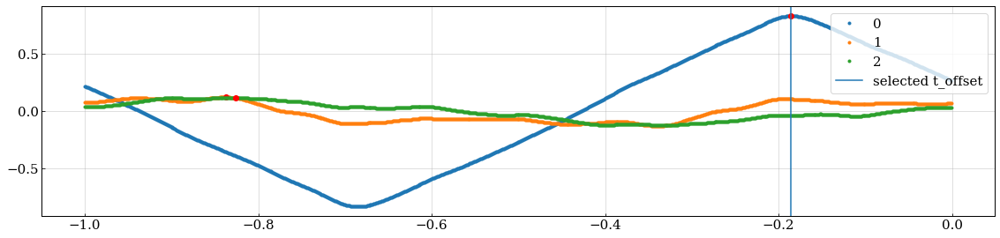

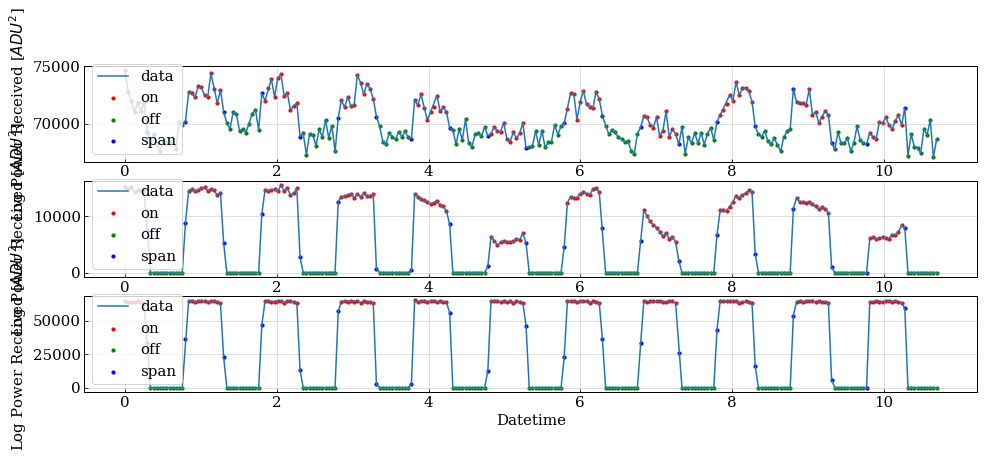

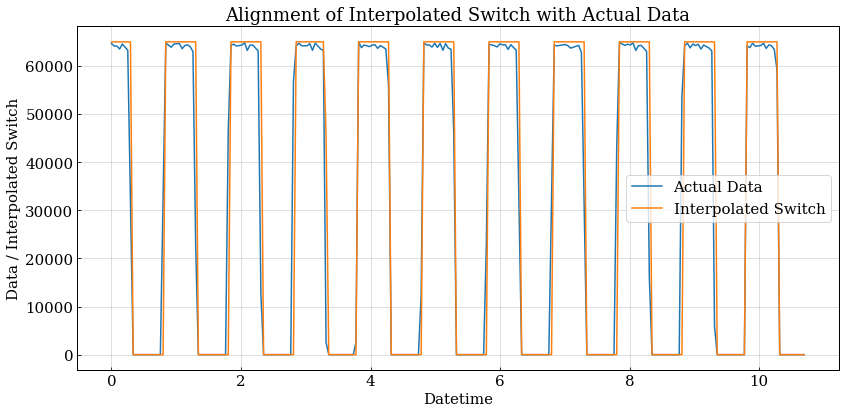

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [555. 939.   4.]
  --> t_deltas = [-0.445 -0.061 -0.996]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.4448000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[0.01623394 0.00824463 0.00203335 0.00231935 0.01495621 0.00502925
 0.00719156 0.00536623 0.00846411 0.01297644 0.01482984 0.00128918
 0.02641364 0.01655688 0.01662709 0.01224631 0.0180031  0.01958973
 0.01860686 0.02207498 0.01056139 0.02333867 0.03996317 0.02234176
 0.01692195 0.03261974 0.02753692 0.0133415  0.02363353 0.01953357
 0.01613565 0.00644739 0.0101542  0.00680728 0.00030631 0.00355495
 0.0059227  0.00284773 0.02108694 0.01753975 0.00454669 0.00012896
 0.00010087 0.01676232 0.01510549 0.00875897 0.0158637  0.00373231
 0.00037652 0.00089604 0.00452378 0.01389797 0.01684657

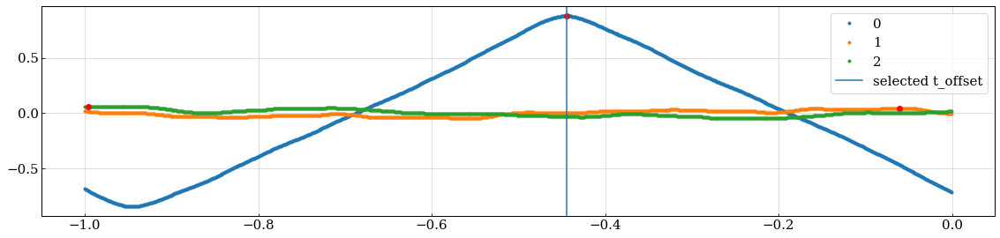

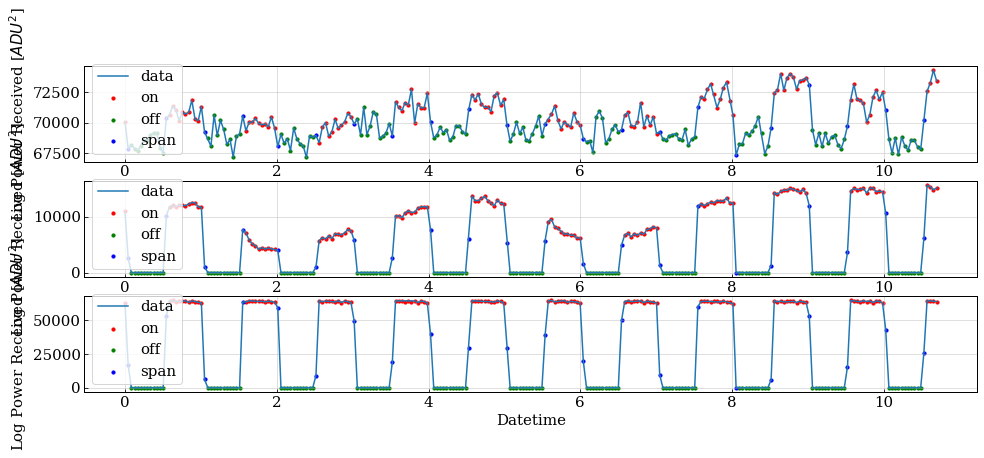

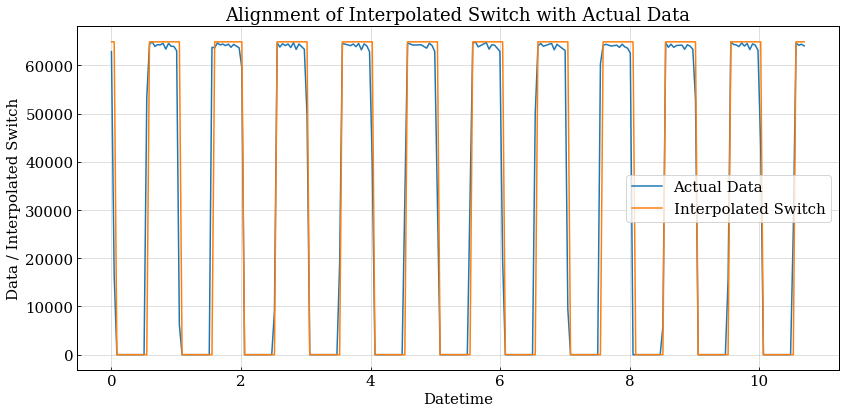

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [294. 398. 136.]
  --> t_deltas = [-0.706 -0.602 -0.864]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.7058000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[0.01626256 0.01106927 0.01401752 0.00675372 0.00568551 0.00985863
 0.02955635 0.00336394 0.0085483  0.01400327 0.00226725 0.00403335
 0.0025468  0.02498443 0.0049164  0.00116525 0.00602203 0.00545763
 0.00928892 0.02092525 0.00926937 0.00033917 0.00635492 0.0021818
 0.0001825  0.01104078 0.0142454  0.00897558 0.0288727  0.01356175
 0.0250414  0.01470117 0.01908793 0.01299204 0.01015773 0.02078282
 0.00886164 0.01642454 0.01027167 0.00393365 0.00545232 0.00430396
 0.01653848 0.01259324 0.00213907 0.01160518 0.0028512  0.00099434
 0.00166375 0.00424168 0.01757289 0.02533519 0.00428972 

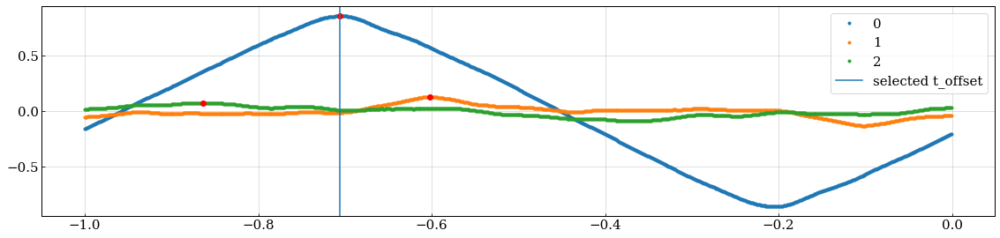

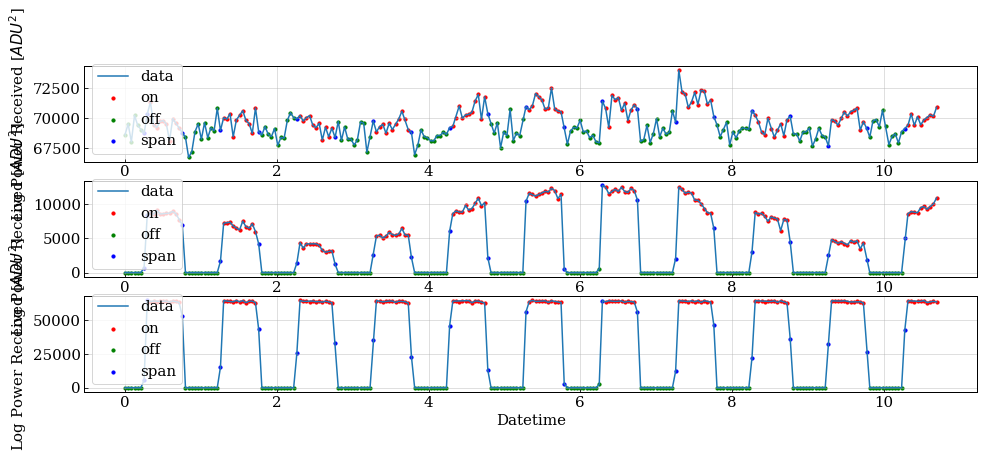

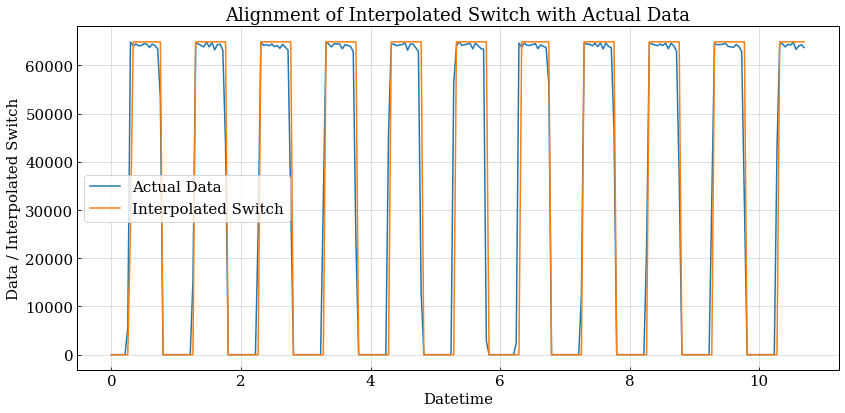

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [ 24.  46. 301.]
  --> t_deltas = [-0.976 -0.954 -0.699]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.9758000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[4.21910816e-03 1.36717058e-03 1.18370670e-03 9.88572950e-05
 7.25271426e-03 5.35916505e-03 3.71416171e-04 1.45081216e-02
 3.85666882e-04 2.27921609e-03 8.89334139e-03 5.74213888e-03
 7.11020714e-03 1.85107760e-02 9.40457163e-03 2.52513623e-02
 2.00845258e-03 3.74703933e-03 4.01780284e-03 6.96770003e-03
 7.60898203e-03 1.04119959e-03 4.06055497e-03 1.72424627e-02
 6.11265737e-03 2.16601832e-02 2.52656131e-02 2.40400519e-02
 1.54611238e-02 2.12184111e-02 9.76083941e-03 4.61633271e-03
 1.13569190e-02 8.80604176e-03 5.74393425e-03 1.87387874e-02
 2.65054249e-02 9.94609865e-03 4.11755782e

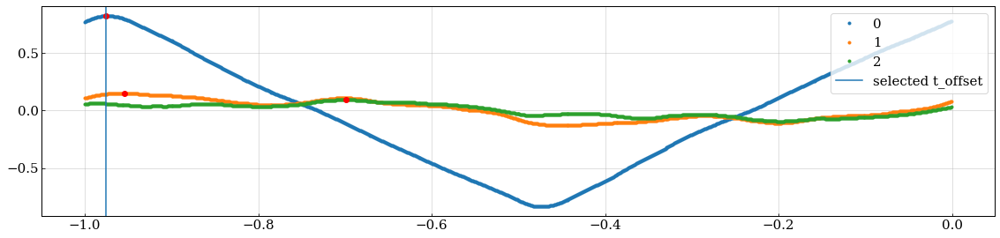

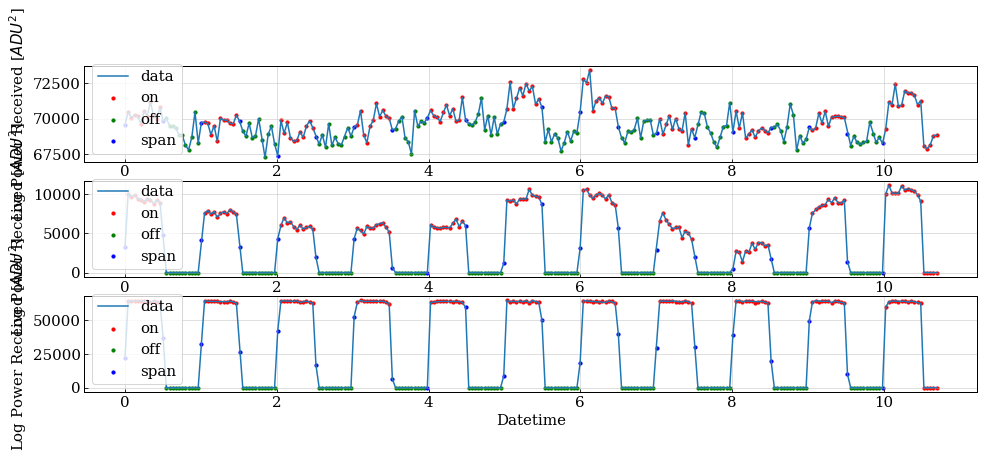

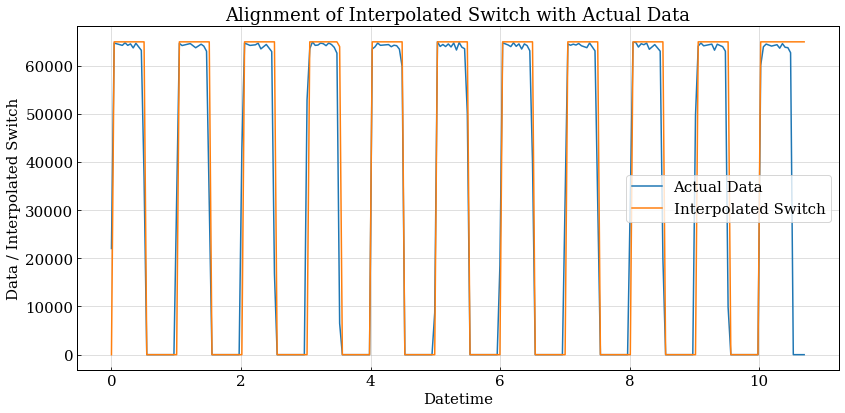

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [767. 853.   0.]
  --> t_deltas = [-0.233 -0.147 -1.   ]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.2328000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[0.03496049 0.01127608 0.01387281 0.0274842  0.0106483  0.01949429
 0.00664416 0.00882204 0.00569741 0.00871298 0.01014893 0.00560262
 0.00751449 0.0130789  0.01223711 0.0231091  0.00559753 0.0298292
 0.04107215 0.00864164 0.01126182 0.0028724  0.01695972 0.00756648
 0.00485561 0.00350018 0.00266347 0.01157571 0.01208016 0.01680277
 0.00276335 0.00628747 0.01135251 0.01003988 0.00463242 0.00341457
 0.0089698  0.00395675 0.00504109 0.01867184 0.00540287 0.00637308
 0.00164538 0.01129544 0.00259213 0.01160933 0.00262067 0.01411536
 0.00806585 0.0092358  0.0069815  0.00382834 0.01228909 

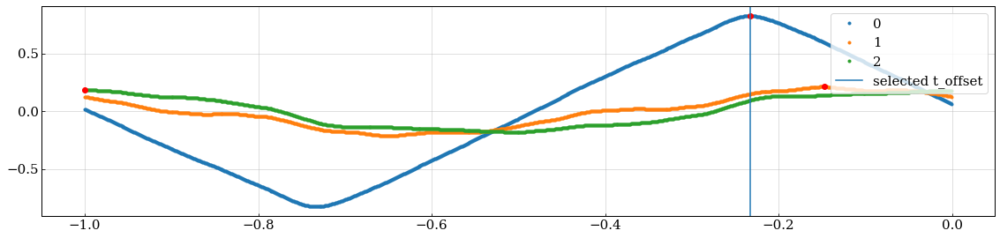

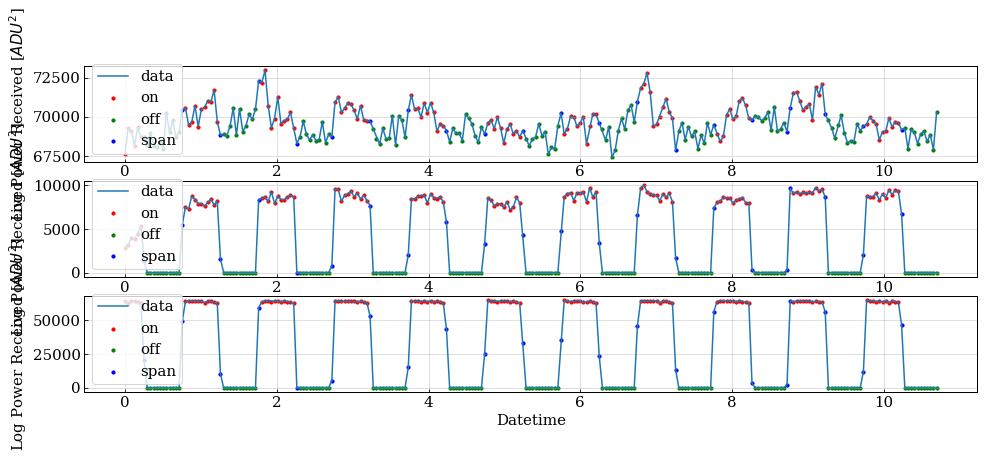

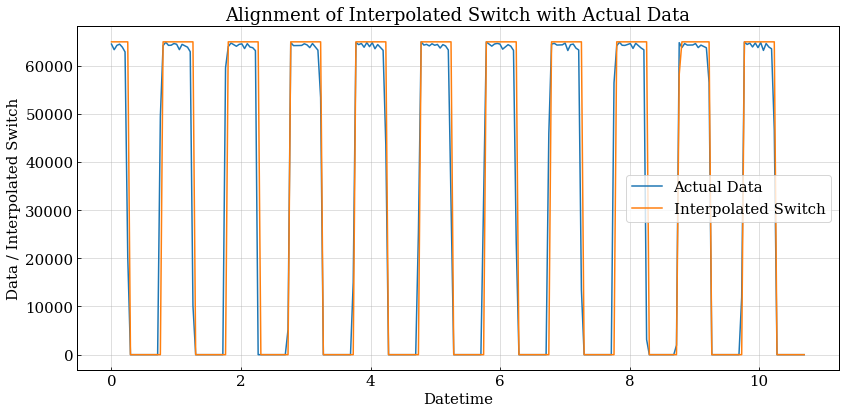

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [504. 905. 814.]
  --> t_deltas = [-0.496 -0.095 -0.186]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.4958000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[1.20648759e-02 1.07031360e-02 1.73773740e-02 5.29372419e-03
 1.51125855e-02 1.66176664e-02 4.43976676e-06 3.41595655e-03
 1.33119430e-02 1.26382401e-02 4.84936696e-03 1.65603300e-02
 1.40088595e-02 7.09094177e-03 1.41091982e-02 7.09982131e-03
 2.67518781e-02 1.00007649e-02 7.50663079e-03 4.39067563e-03
 2.92173440e-02 1.66463346e-02 3.08944341e-02 3.75109551e-03
 7.40083749e-03 5.24184234e-03 1.13283820e-02 1.61876433e-02
 7.28616466e-03 2.44669204e-03 2.19451329e-04 3.43029065e-03
 3.38728834e-03 1.83432135e-02 7.54963310e-03 8.19466779e-03
 8.07149597e-04 1.40918197e-03 5.36539471e

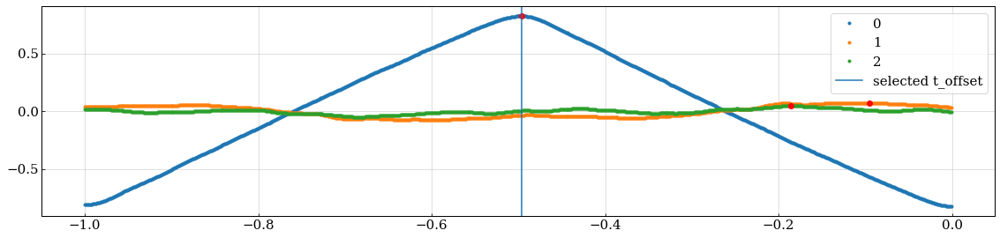

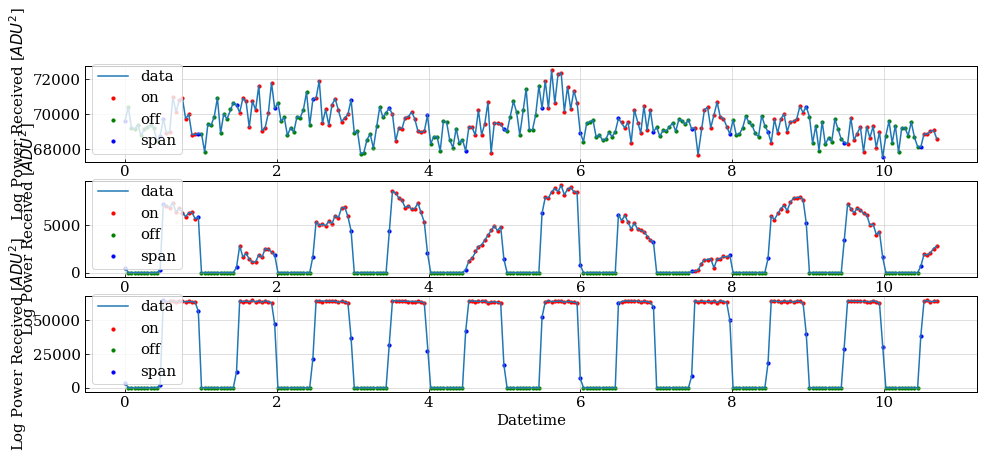

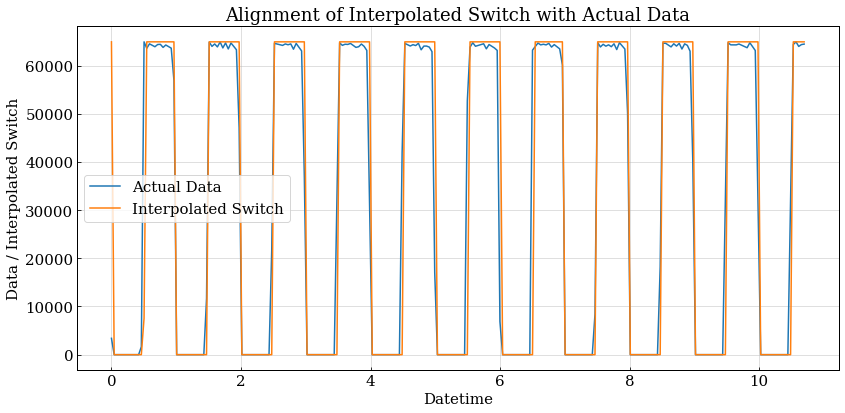

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [238. 561. 569.]
  --> t_deltas = [-0.762 -0.439 -0.431]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.7618000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[1.63267567e-02 1.93751183e-03 2.12622677e-02 9.73432418e-04
 1.95190107e-03 2.49890822e-02 1.82549155e-02 2.53732750e-02
 1.55785160e-02 1.85671622e-02 2.35479993e-03 3.89444913e-03
 7.05576624e-03 6.25428530e-03 4.10597103e-03 3.63544272e-03
 1.01638431e-02 3.13181915e-03 8.34072581e-03 6.81330746e-04
 1.09984193e-02 3.38147255e-05 2.80352853e-02 5.95211115e-03
 1.03077356e-02 1.70296713e-03 1.13581505e-02 2.12025524e-03
 2.92605295e-03 1.37179866e-02 2.65265730e-03 1.90707857e-02
 1.22812205e-03 1.56339146e-03 9.34797295e-03 5.37438297e-04
 1.20366034e-03 2.03082608e-02 8.16373810e

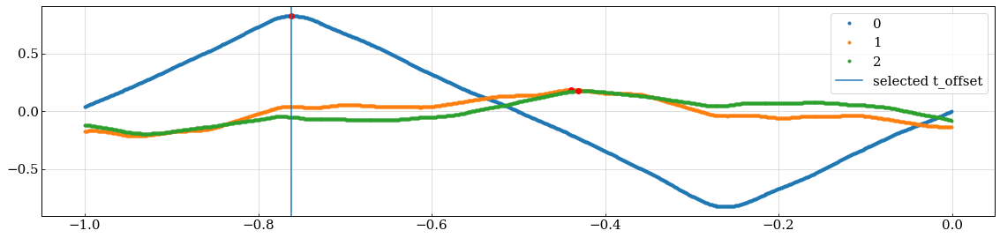

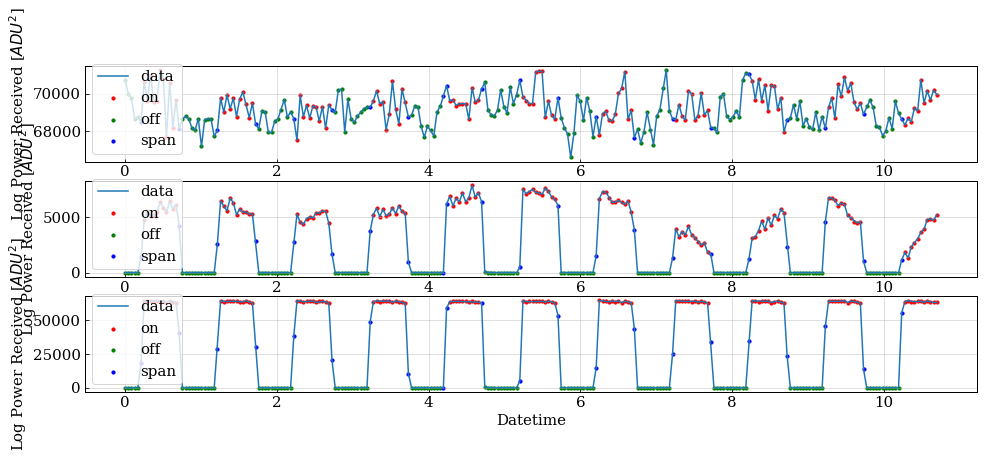

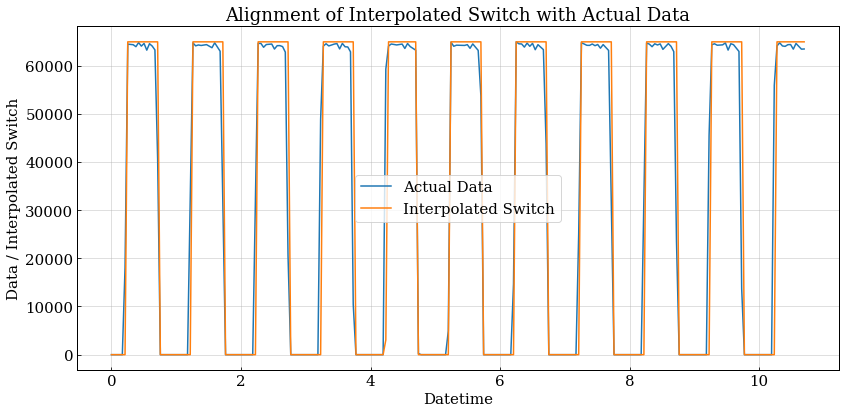

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [978. 170. 164.]
  --> t_deltas = [-0.022 -0.83  -0.836]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.0218000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[3.04978405e-02 2.42380630e-02 2.36034312e-02 2.72092938e-02
 2.10216336e-02 1.37810615e-02 1.19492833e-02 1.61320839e-02
 1.87138815e-02 1.38243318e-02 1.74446179e-02 7.72430314e-03
 1.11727198e-03 3.74343082e-03 5.04154136e-03 1.36234944e-02
 1.79626501e-03 1.21667259e-02 1.35513771e-02 1.44023607e-02
 5.79046993e-03 2.24339197e-03 8.97914333e-03 1.02916773e-02
 1.11271466e-02 6.29638154e-03 1.75299465e-03 4.11844053e-03
 8.48874601e-03 4.91063945e-03 8.73394467e-03 1.28590515e-02
 8.87587627e-04 7.56685724e-04 3.32405990e-03 4.10292623e-03
 1.11415700e-02 2.19591579e-02 1.30166186e

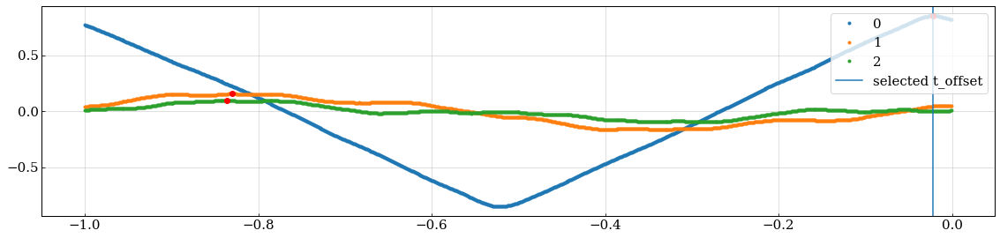

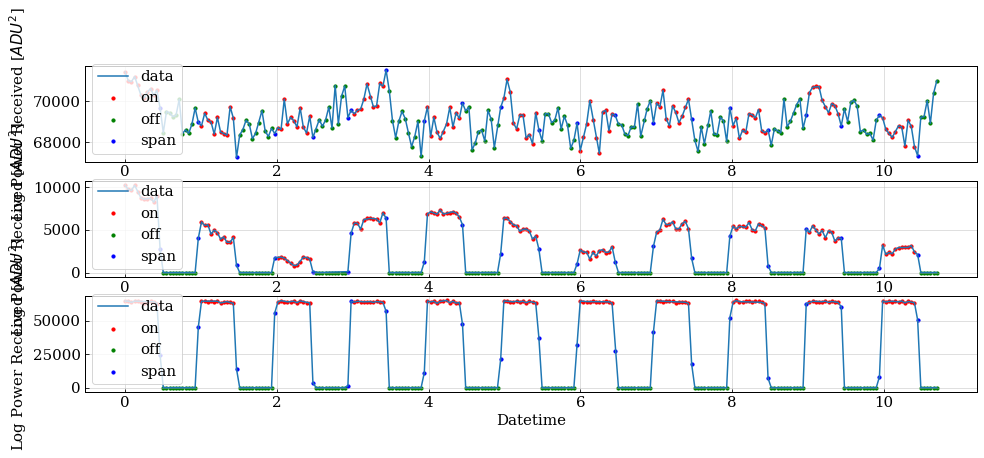

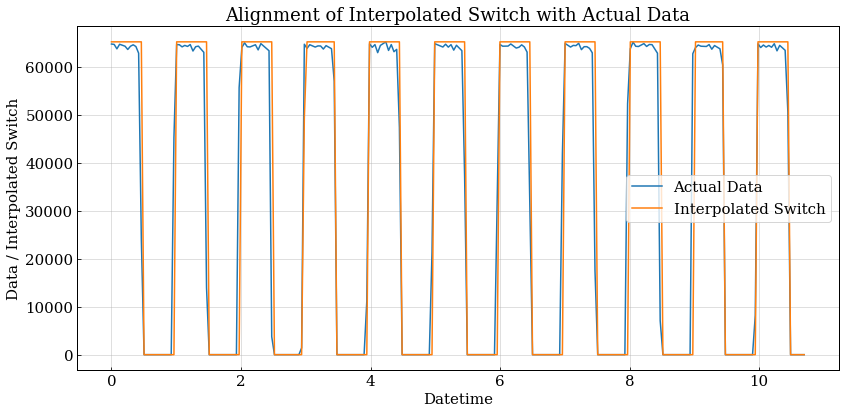

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [717. 675. 672.]
  --> t_deltas = [-0.283 -0.325 -0.328]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.2828000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[1.70191720e-01 2.02607808e-01 1.91377801e-01 1.79206190e-01
 1.53118231e-01 2.87358875e-02 2.35016793e-02 1.22439774e-02
 8.39448037e-03 2.48586962e-02 3.35269882e-02 3.27238557e-02
 2.28370179e-02 3.51471003e-02 4.28460944e-02 4.09490401e-02
 4.10187573e-03 8.13848942e-04 2.85563567e-03 3.43721437e-03
 1.48548203e-02 3.57778061e-02 4.39199078e-02 3.10005526e-02
 4.14551219e-02 4.38783665e-02 4.46399576e-02 5.57725538e-03
 2.27405698e-03 1.17039401e-02 8.60977286e-03 4.86346688e-03
 1.75335741e-02 6.12355405e-03 5.43168010e-04 7.31440566e-03
 1.77350195e-02 1.79842675e-02 3.61516781e

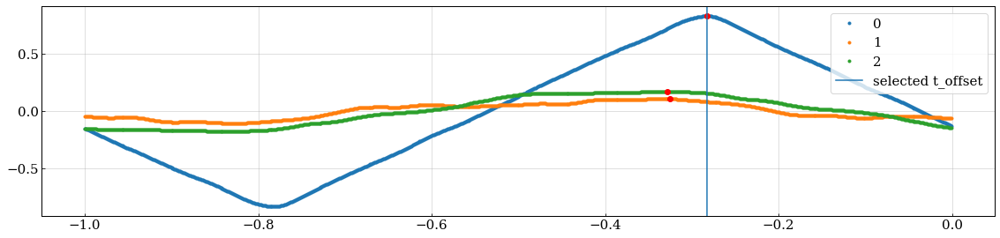

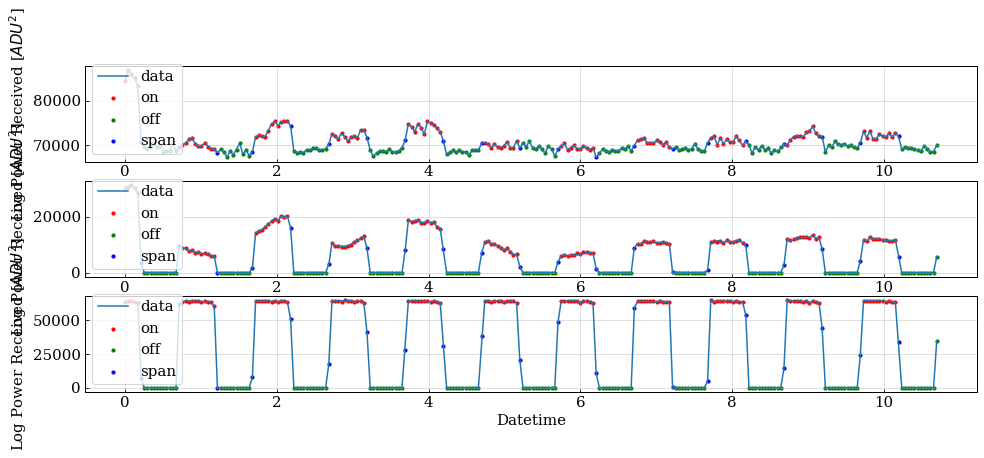

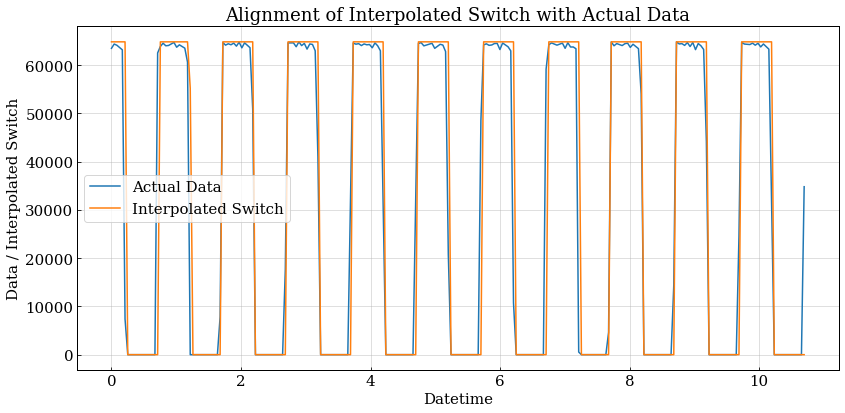

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [451. 473. 471.]
  --> t_deltas = [-0.549 -0.527 -0.529]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.5488000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[0.04433975 0.02762864 0.0445464  0.05968696 0.03366283 0.02543815
 0.03443432 0.01484389 0.01839827 0.01824673 0.03630795 0.04151553
 0.04126755 0.02043722 0.01451325 0.02346809 0.03645949 0.03363527
 0.02452889 0.01007716 0.03145856 0.03801625 0.03156877 0.02390894
 0.01859115 0.02149802 0.01934886 0.03008089 0.03356639 0.03123813
 0.04359581 0.04447751 0.04878961 0.03185808 0.04665423 0.04433975
 0.04194261 0.04259011 0.04414687 0.02074031 0.05504422 0.05679386
 0.04308607 0.04261766 0.03384192 0.04774259 0.05053925 0.04439485
 0.04518012 0.04432597 0.03750652 0.0569454  0.05745514

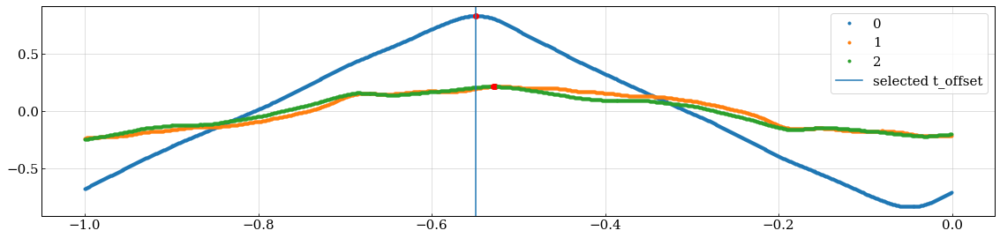

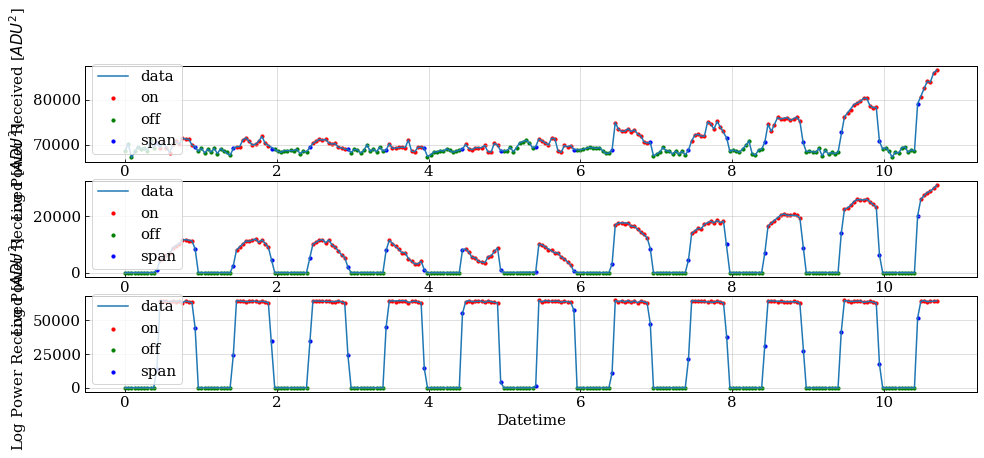

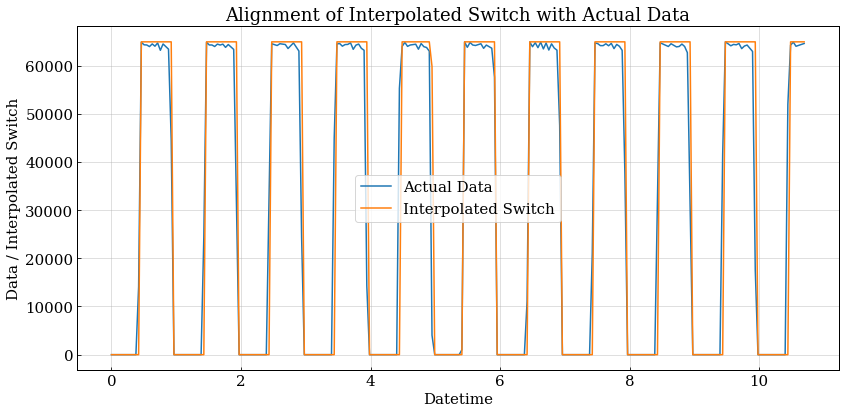

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [185. 296.  93.]
  --> t_deltas = [-0.815 -0.704 -0.907]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.8148000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[0.00668053 0.01246499 0.00237054 0.00422204 0.00418527 0.00364652
 0.03402912 0.01070697 0.02994597 0.0148043  0.02909532 0.01091963
 0.01384022 0.01505949 0.01663321 0.0377153  0.02199234 0.01754057
 0.01646308 0.03612741 0.01858972 0.00170419 0.00953023 0.00784309
 0.01616535 0.01213891 0.02757831 0.00571645 0.01110394 0.00086195
 0.01025329 0.0068449  0.00983637 0.00937428 0.00819753 0.00233642
 0.00807835 0.015499   0.0084102  0.00408603 0.0112599  0.00573905
 0.00809829 0.00678819 0.01124572 0.01284779 0.01228068 0.00211534
 0.01175035 0.01339495 0.02167467 0.00429293 0.01744974

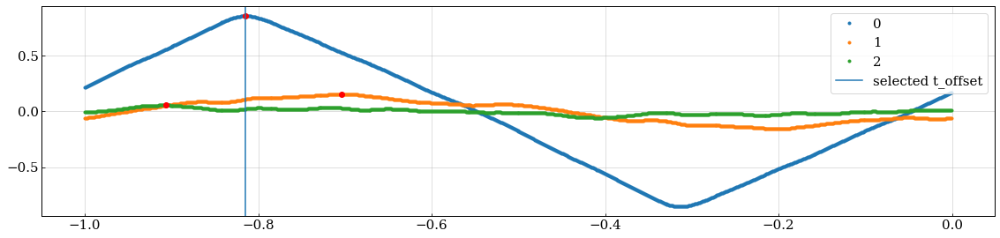

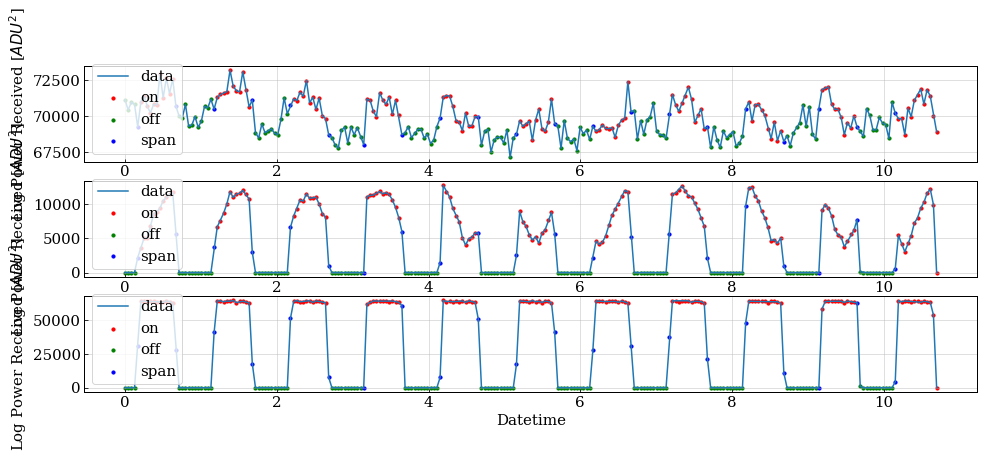

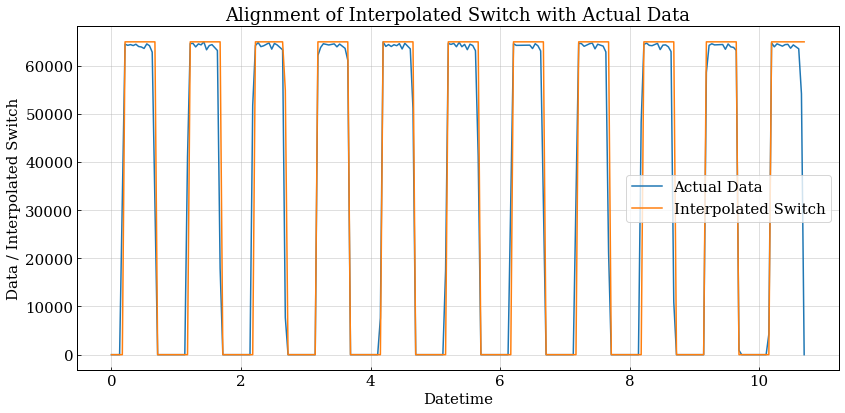

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [932. 999. 174.]
  --> t_deltas = [-0.068 -0.001 -0.826]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.0678000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[0.01941541 0.00658076 0.01623308 0.00238637 0.0184395  0.00952895
 0.00767612 0.01684126 0.00548384 0.01089459 0.00735866 0.00856088
 0.00675048 0.01836878 0.01546932 0.01327704 0.00903392 0.00993912
 0.01005227 0.01674225 0.00302284 0.00498251 0.0272306  0.02594352
 0.00331355 0.00928221 0.02259145 0.01191294 0.0223793  0.0179806
 0.02728717 0.00382903 0.01027857 0.02709546 0.03583628 0.01651595
 0.01026442 0.01299416 0.00725181 0.00020823 0.00517268 0.00777513
 0.01228068 0.00107885 0.01078144 0.01567517 0.00329941 0.012804
 0.00377245 0.00064669 0.01505915 0.00793071 0.01566733 0.

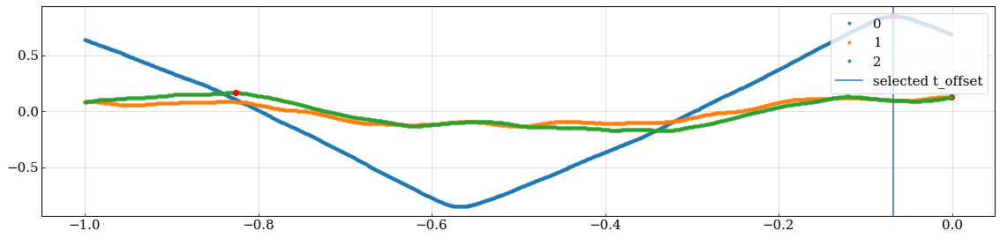

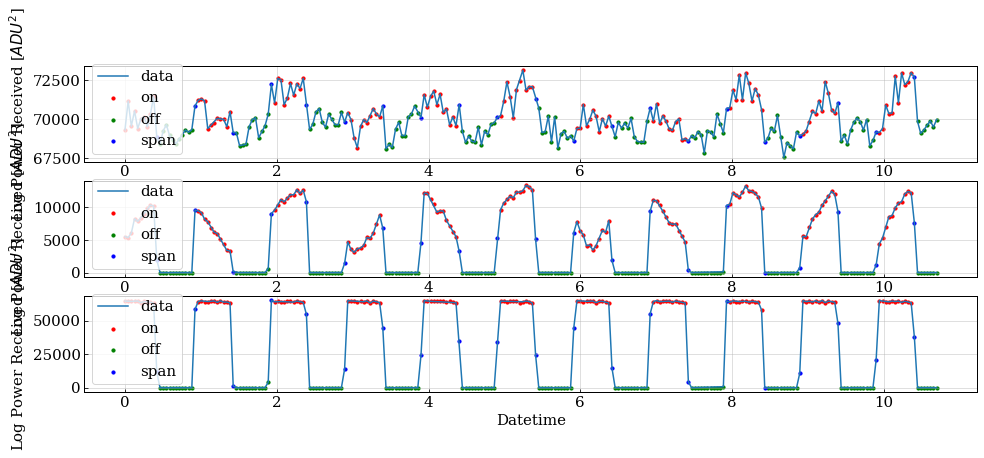

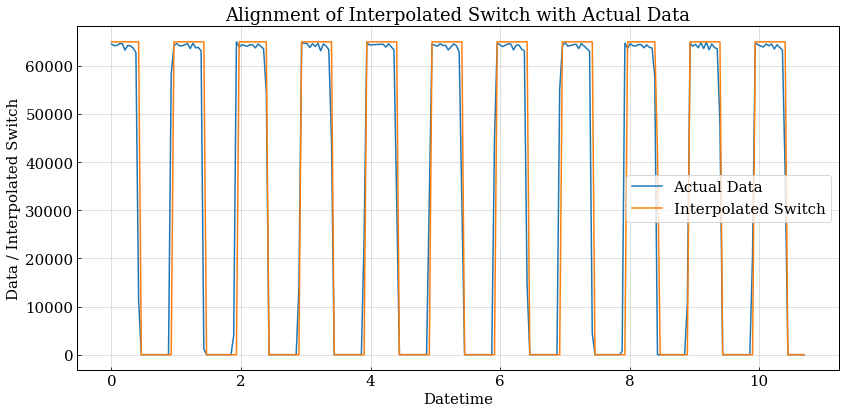

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [664. 643. 783.]
  --> t_deltas = [-0.336 -0.357 -0.217]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.3358000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[1.49130407e-02 2.43837851e-02 2.13180274e-02 2.67154882e-02
 1.41358064e-02 7.69872145e-03 1.14841406e-02 1.19336424e-02
 7.26692459e-03 1.33585720e-02 2.37648763e-02 1.63235771e-02
 1.04079601e-02 3.68632238e-03 2.31315742e-02 1.57046683e-02
 1.01057023e-02 1.06094653e-02 6.17303922e-03 1.17858889e-03
 1.29704643e-03 1.20056085e-02 4.73320686e-04 2.57190437e-02
 3.13899757e-02 2.18611489e-03 8.67746099e-03 2.31747539e-02
 1.50137933e-02 2.60351852e-03 4.05723461e-03 7.91793159e-03
 1.43229183e-02 1.48698610e-02 9.29968154e-03 8.43608782e-03
 1.64248392e-03 6.46039429e-04 8.33151401e

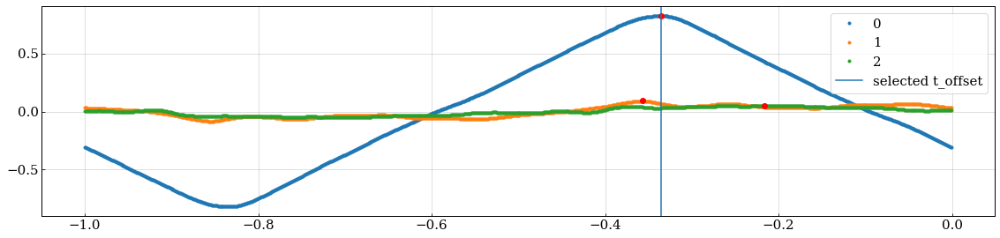

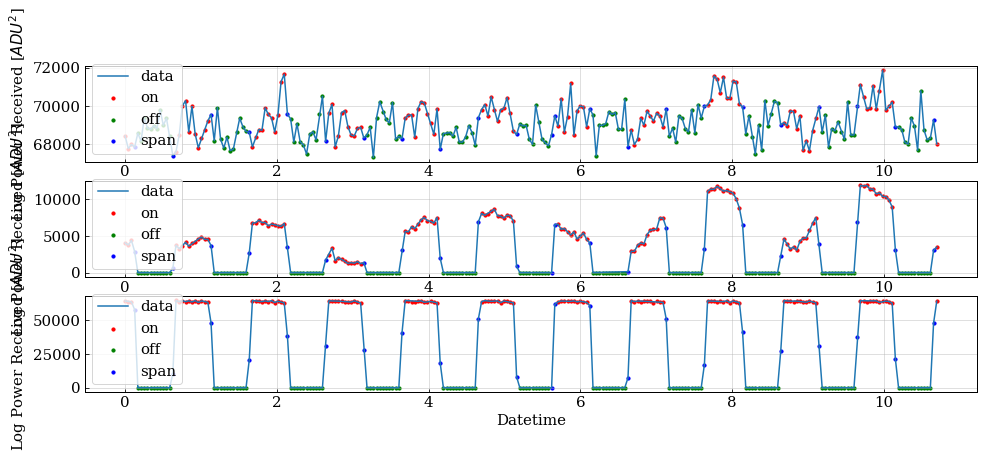

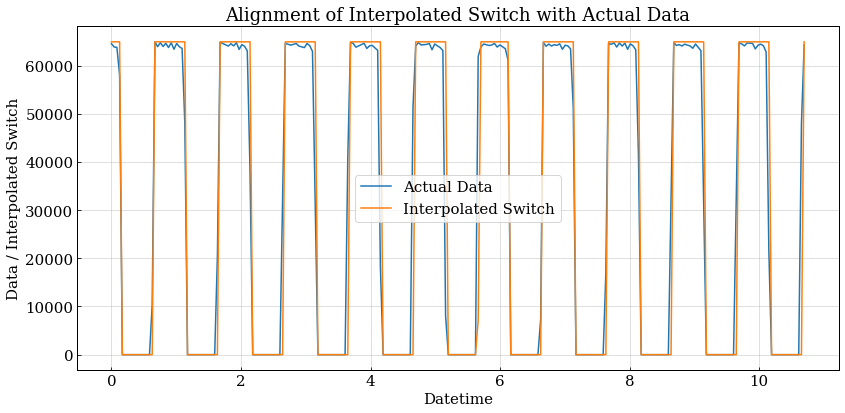

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [400. 217. 214.]
  --> t_deltas = [-0.6   -0.783 -0.786]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.5998000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[0.01196366 0.00413123 0.00069757 0.01085816 0.00257912 0.00508085
 0.01403425 0.01077193 0.00351437 0.00653236 0.01205099 0.00411797
 0.01223782 0.00692039 0.00398862 0.00127132 0.01193602 0.00380069
 0.00520909 0.00288202 0.00381506 0.0049504  0.02663798 0.02109061
 0.00291077 0.00408922 0.0218523  0.01314322 0.00782579 0.00522456
 0.01358873 0.00361497 0.02080319 0.00973609 0.01062822 0.00321257
 0.01087143 0.01174808 0.01505351 0.02371948 0.02688119 0.01539843
 0.02938182 0.01567259 0.01634804 0.01466659 0.01887742 0.00250726
 0.00614434 0.01588816 0.01463785 0.00187602 0.0191361 

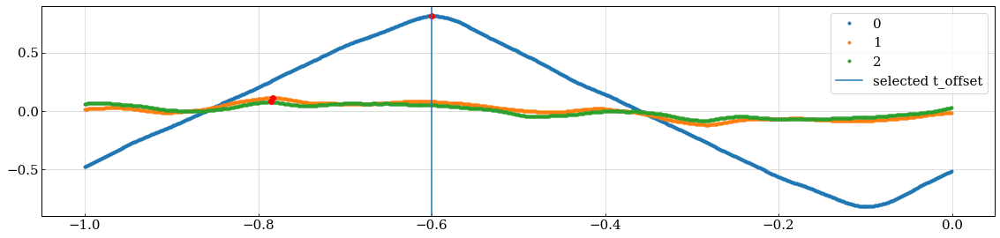

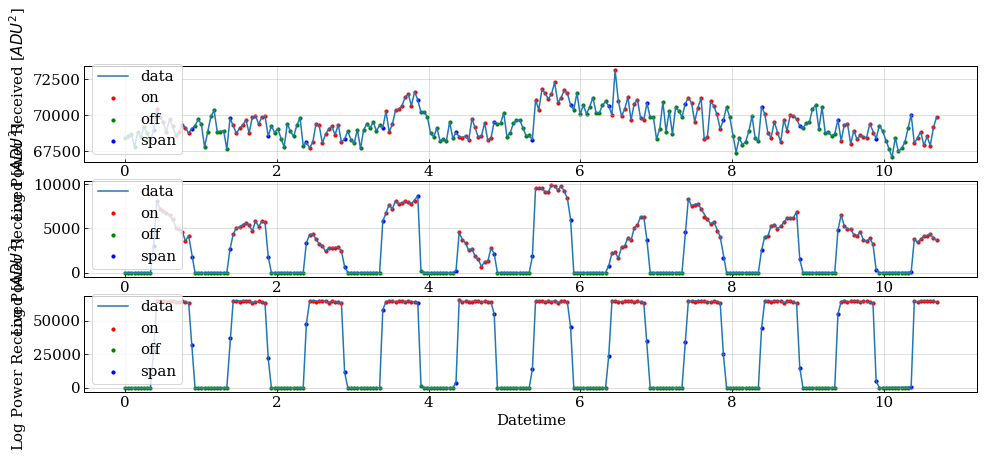

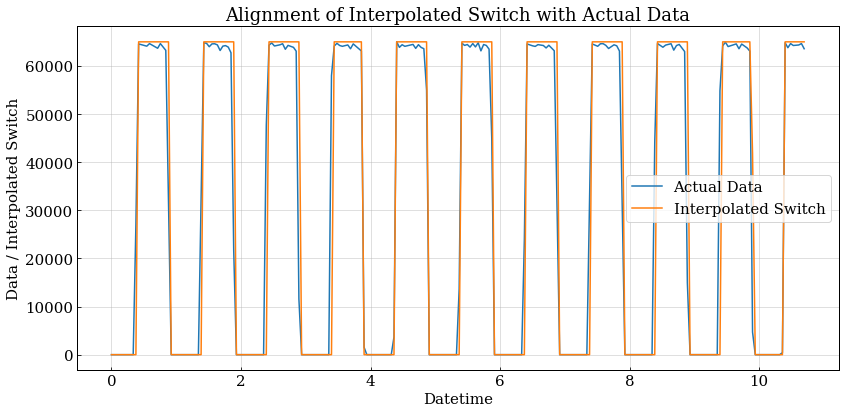

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [138. 122.  65.]
  --> t_deltas = [-0.862 -0.878 -0.935]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.8618000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[0.00863144 0.00224651 0.02857714 0.00172881 0.00502194 0.00349761
 0.01899975 0.00096033 0.00109607 0.00149873 0.00129109 0.00501563
 0.00551087 0.01049458 0.01731092 0.00572658 0.00674759 0.0062092
 0.02238723 0.01058087 0.02120803 0.01183828 0.00140613 0.00432536
 0.00772547 0.00661186 0.00569782 0.00121112 0.00877524 0.00281541
 0.00302305 0.00129109 0.00295115 0.0024766  0.00301674 0.00113921
 0.00483499 0.01140687 0.01142931 0.0103364  0.01681392 0.00169374
 0.00516574 0.00851639 0.00299429 0.00607171 0.00412404 0.00123356
 0.00462735 0.00999758 0.02337948 0.00484937 0.0092291  

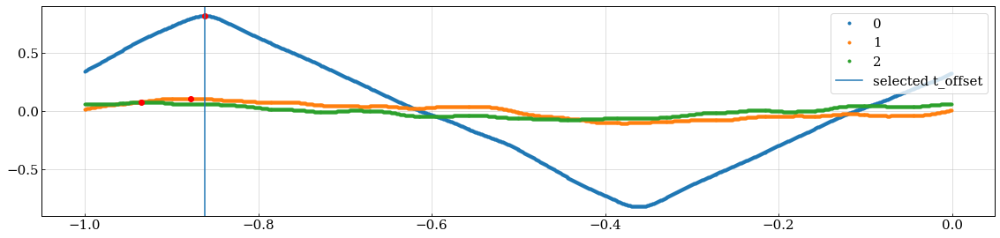

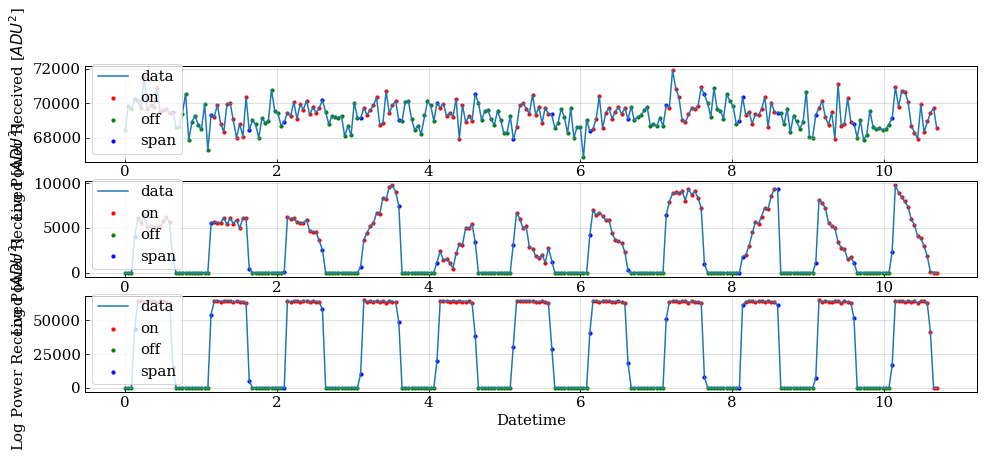

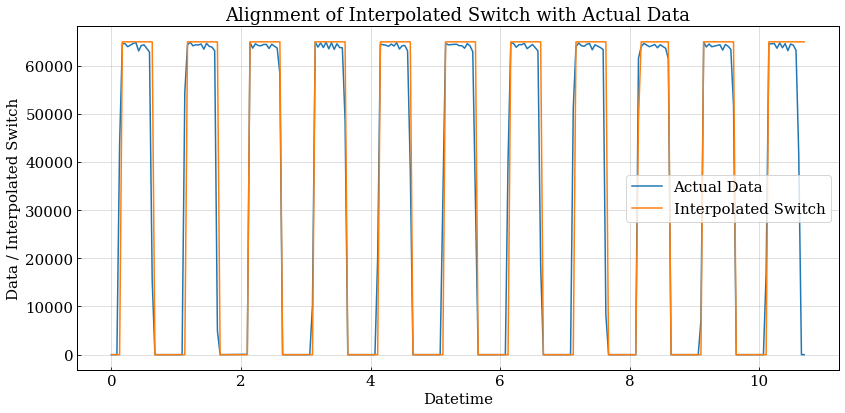

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [880.  62. 160.]
  --> t_deltas = [-0.12  -0.938 -0.84 ]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.1198000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[2.97490726e-03 1.66336013e-03 1.47290259e-02 1.11671939e-03
 3.24859385e-03 8.83756201e-03 7.65565589e-03 6.79211490e-03
 4.90438548e-03 2.17440452e-02 2.32596976e-03 1.11855048e-02
 8.01576982e-03 4.89071336e-03 7.59877009e-03 1.06662083e-02
 1.83726464e-02 9.24015717e-03 5.10995560e-04 8.60708909e-03
 8.95206603e-03 1.12279861e-02 1.92225153e-02 6.48888676e-03
 4.93392703e-03 1.21362056e-02 5.78306346e-03 7.79970146e-03
 7.18030550e-03 2.09549684e-03 3.03179305e-03 8.14223694e-04
 9.25456173e-03 1.53052082e-02 7.56996098e-03 2.08109229e-03
 4.21296674e-03 1.72097836e-03 5.63975033e

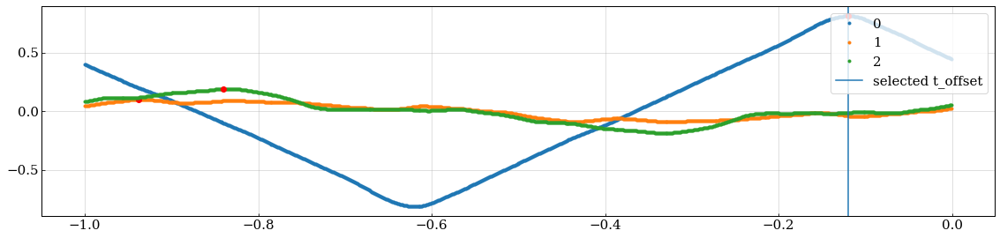

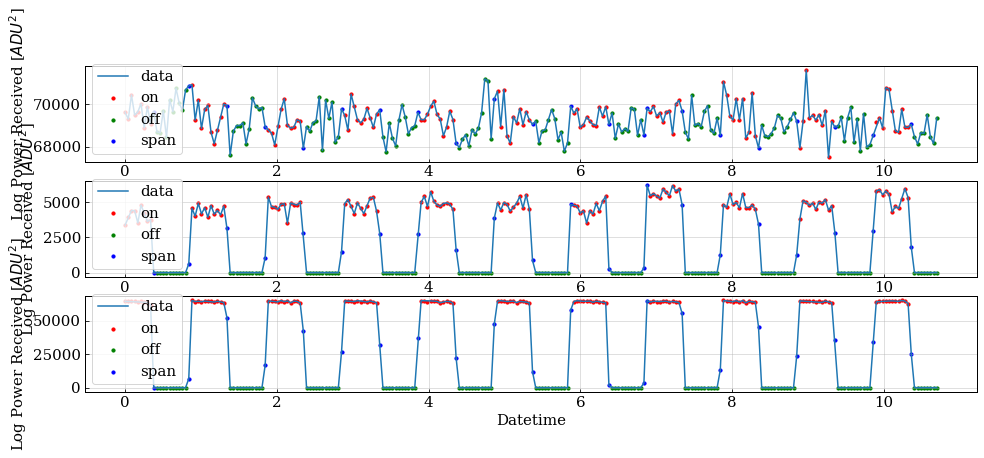

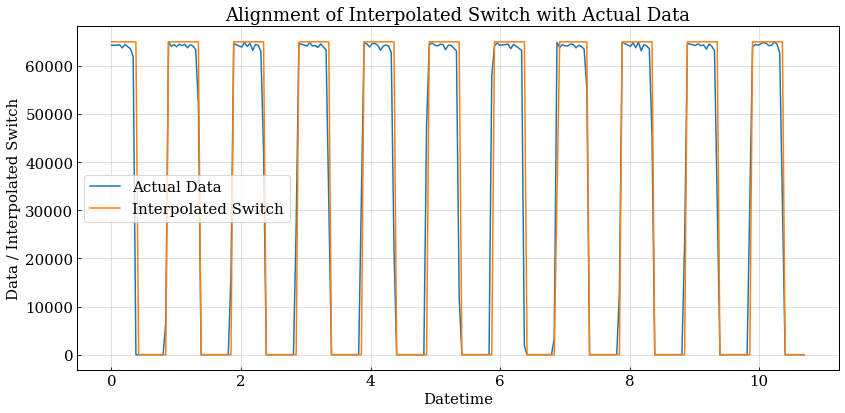

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [610. 482. 244.]
  --> t_deltas = [-0.39  -0.518 -0.756]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.3898000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[1.18062333e-02 2.91791413e-02 5.13653473e-03 5.48024243e-03
 1.57840181e-03 1.62430954e-02 2.39950941e-03 9.31207788e-03
 9.19683470e-03 9.96234252e-03 6.35897161e-03 2.87488749e-03
 4.90604838e-03 5.16332371e-03 1.51174526e-02 1.80273427e-02
 1.89532053e-03 3.72278407e-03 3.76802207e-03 5.60989100e-03
 2.88727108e-03 6.95161467e-03 2.15442812e-02 1.38662050e-02
 5.66953439e-03 1.37653672e-02 9.60018580e-03 8.60621345e-03
 1.06517797e-02 1.57945063e-02 9.46459817e-05 6.47421478e-03
 6.17170146e-03 3.13216281e-03 7.94558703e-03 9.57137501e-03
 1.66281238e-03 2.47114466e-02 1.61402358e

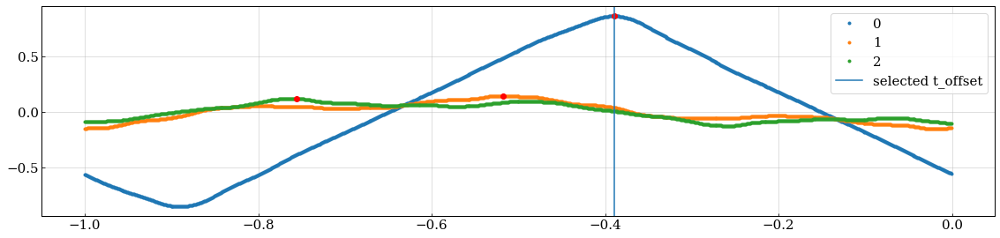

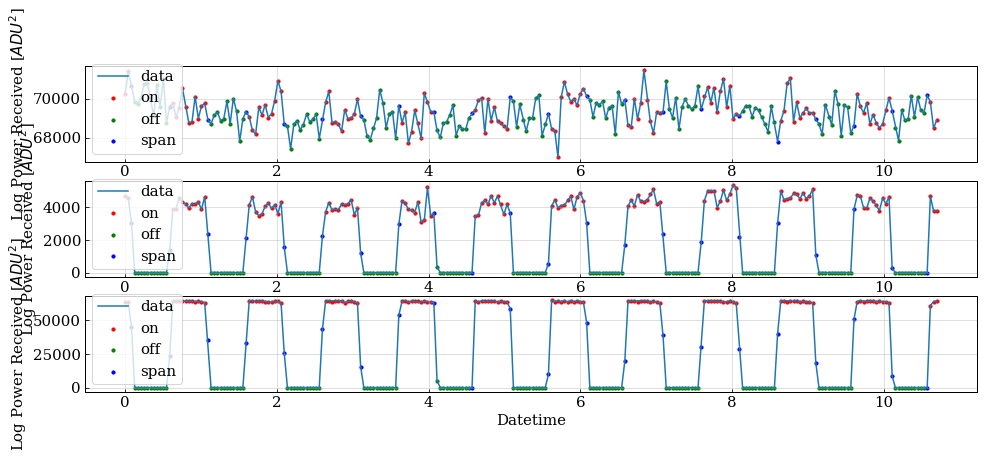

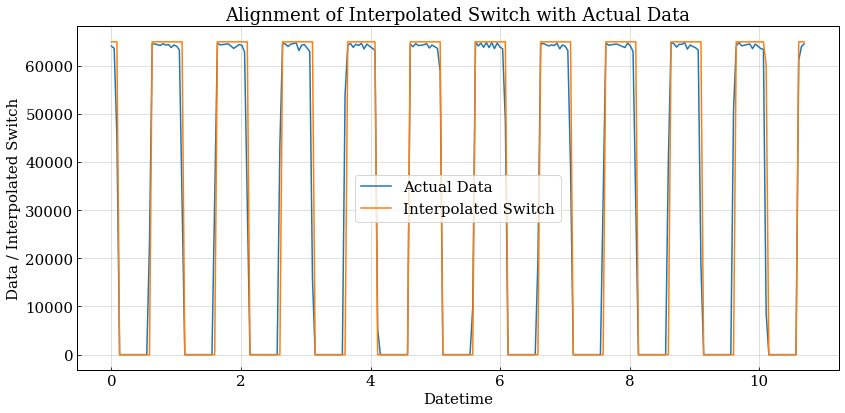

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [355. 588. 603.]
  --> t_deltas = [-0.645 -0.412 -0.397]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.6448000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[0.00308112 0.00212543 0.00146565 0.00565384 0.00131692 0.01389584
 0.00441503 0.00157509 0.01296353 0.00897614 0.00754183 0.00255042
 0.02425157 0.01048217 0.00689639 0.00892408 0.0035401  0.00429125
 0.00800612 0.01005188 0.0066722  0.00166645 0.00880403 0.00291431
 0.00615585 0.00764223 0.00432897 0.00402777 0.00293769 0.00644271
 0.00419988 0.00660049 0.01900729 0.00095834 0.0072029  0.01864341
 0.02040761 0.00305243 0.01610468 0.00553379 0.0095929  0.00164681
 0.00443468 0.00645706 0.00477361 0.01656366 0.00960724 0.00617924
 0.00180989 0.00826429 0.01461299 0.00269916 0.0047072 

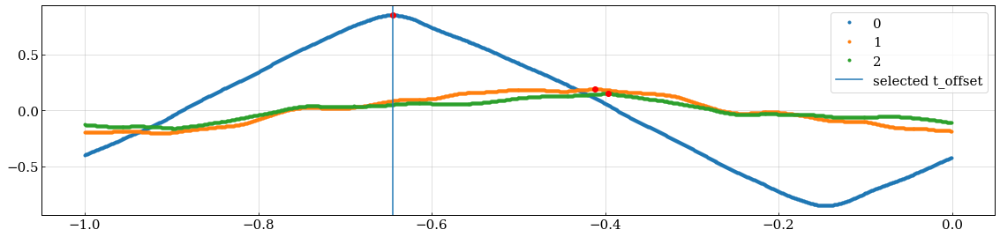

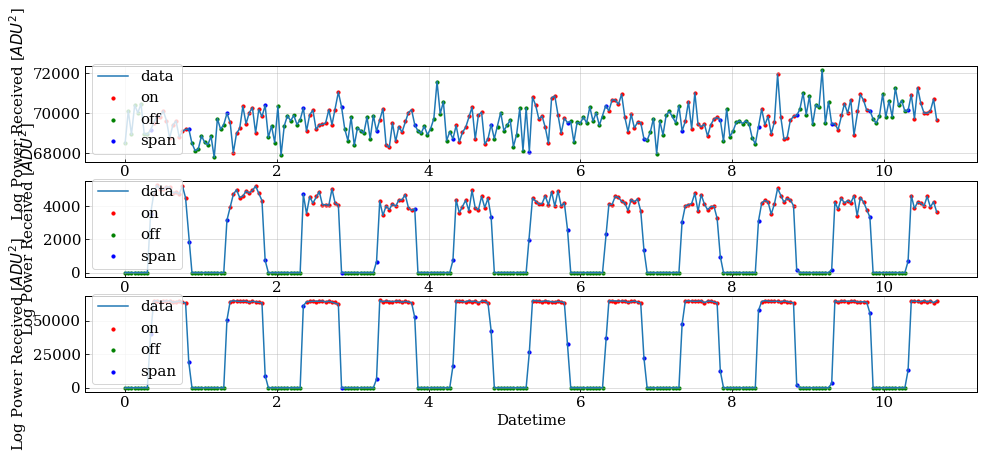

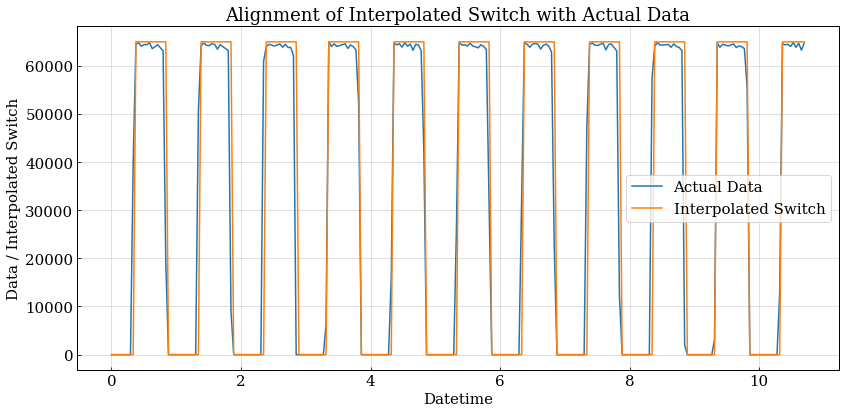

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [ 91. 297. 319.]
  --> t_deltas = [-0.909 -0.703 -0.681]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.9088000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[5.16130121e-04 1.44122656e-02 9.11314219e-03 3.51446641e-03
 8.08967163e-03 3.16428548e-05 2.70722202e-03 1.08084960e-02
 2.27828555e-04 1.29563427e-02 7.75601531e-04 1.18664221e-02
 8.17616210e-03 4.86069409e-03 8.94016125e-03 1.00212921e-02
 1.54557766e-02 2.78492281e-03 1.23364943e-02 1.03816691e-02
 8.76155492e-03 2.18827921e-03 2.47658077e-03 1.04537445e-02
 6.65906301e-04 1.97205303e-03 8.71830968e-03 9.62997549e-04
 1.39942283e-02 8.29148273e-03 8.76507079e-04 2.28039507e-03
 1.05258199e-02 4.64095204e-04 5.11454010e-03 1.00300818e-02
 7.36891772e-03 1.75547527e-02 9.65528977e

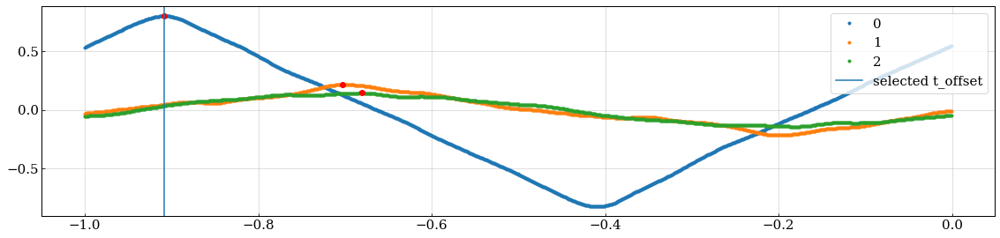

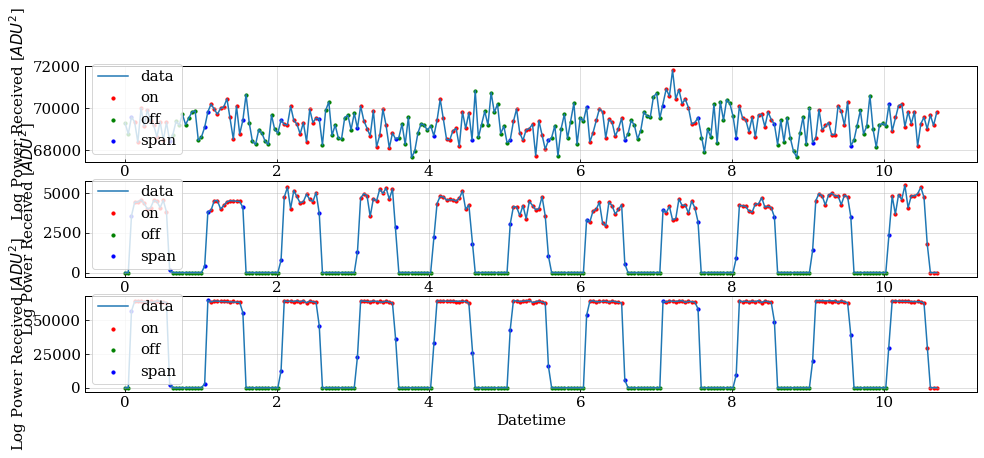

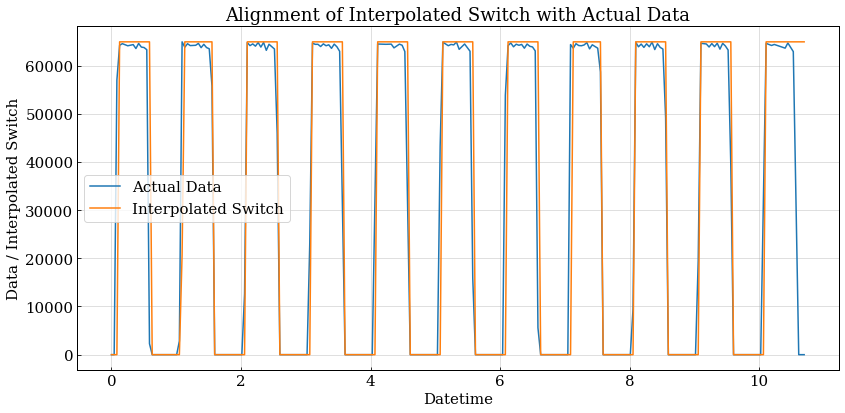

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [176. 177. 180.]
  --> t_deltas = [-0.824 -0.823 -0.82 ]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.8238000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[0.01150387 0.00962386 0.00102362 0.00793986 0.00243141 0.02101772
 0.01723987 0.0170884  0.03800023 0.01636669 0.00911393 0.03964859
 0.05837746 0.05137418 0.07537779 0.06194147 0.06654795 0.06674398
 0.08655987 0.07029908 0.08118713 0.07823791 0.08666679 0.08278202
 0.0690784  0.07036145 0.06933679 0.08502735 0.05741518 0.06083663
 0.06415116 0.04396995 0.00922085 0.00227103 0.02076139 0.00818934
 0.0236126  0.01724193 0.01387394 0.02656182 0.00149585 0.0232562
 0.01551339 0.02116234 0.04986154 0.04240385 0.03415316 0.0492913
 0.057738   0.04541543 0.04581639 0.04578966 0.04703706 0

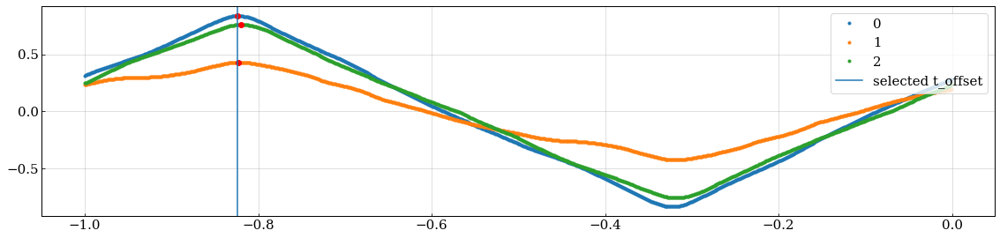

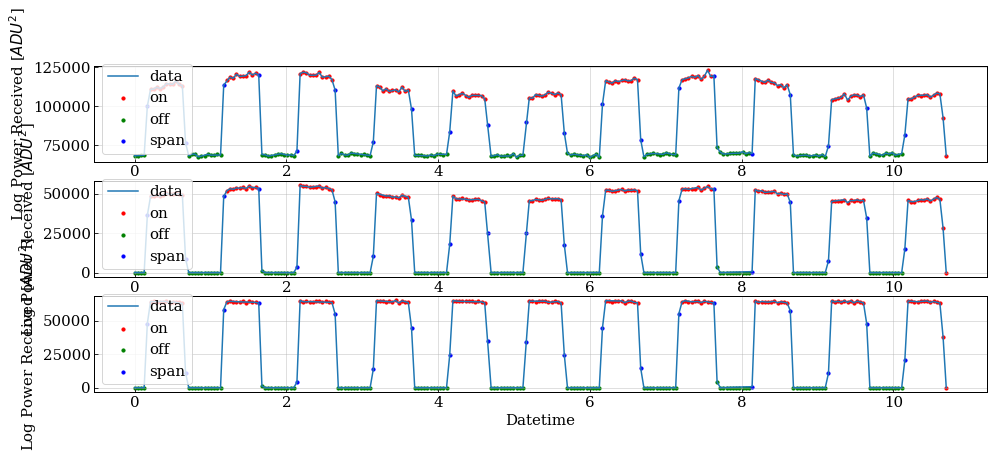

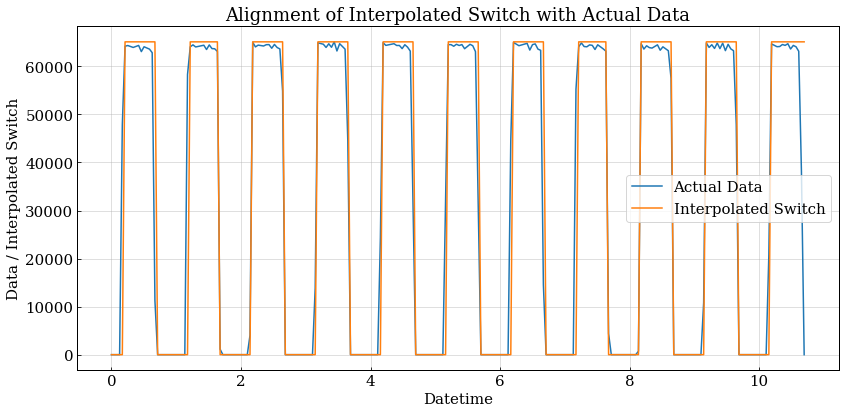

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [442. 450. 442.]
  --> t_deltas = [-0.558 -0.55  -0.558]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.5578000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[0.05599296 0.04962893 0.03858545 0.04857717 0.04781063 0.03001986
 0.03021595 0.03053682 0.03819327 0.02827287 0.02974355 0.03053682
 0.0265437  0.0288344  0.01819202 0.00915402 0.007719   0.010081
 0.00612353 0.00211228 0.00088225 0.00999156 0.05281955 0.05776638
 0.06043143 0.05229367 0.06183972 0.04276544 0.04703487 0.05092995
 0.0596025  0.07181361 0.05938859 0.02622252 0.01458186 0.01228225
 0.00342252 0.01420751 0.00034746 0.00659562 0.00270086 0.00992056
 0.01348585 0.05523534 0.04227552 0.03057248 0.02919093 0.06590445
 0.06735731 0.06558358 0.05944237 0.06927365 0.06640359 0

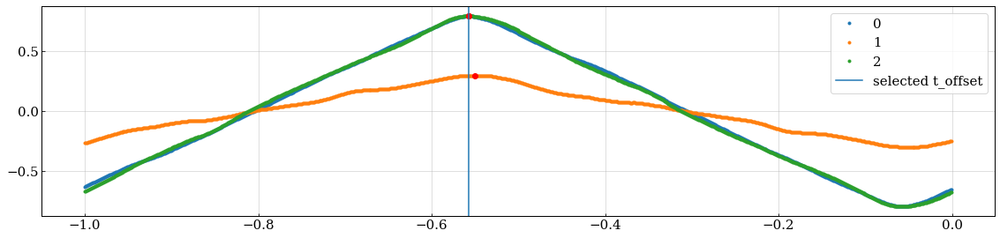

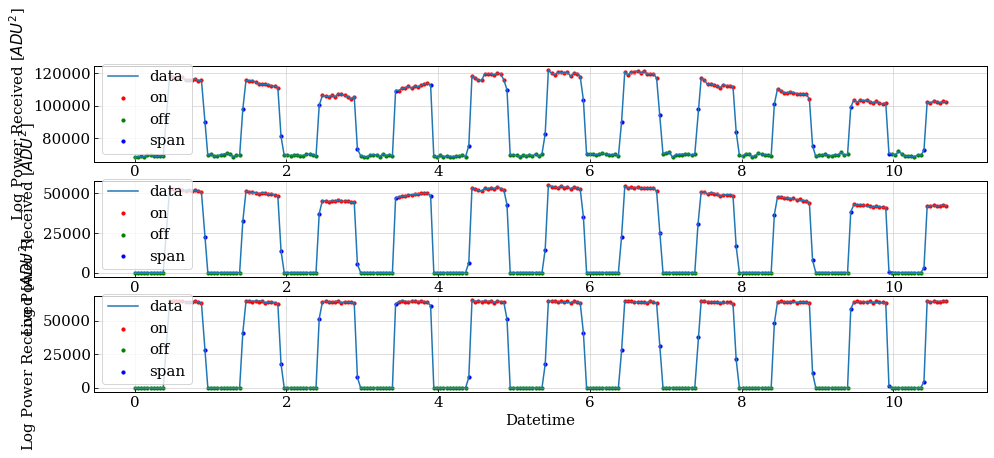

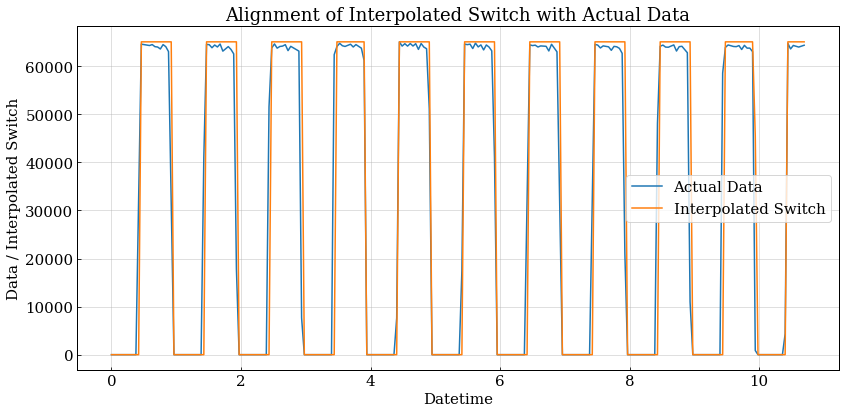

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [706. 680. 699.]
  --> t_deltas = [-0.294 -0.32  -0.301]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.2938000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[0.04037166 0.04832378 0.04991796 0.0435225  0.01849394 0.02285448
 0.02356717 0.032307   0.01416153 0.03401371 0.02868729 0.03591734
 0.02272319 0.02812463 0.04066236 0.01674034 0.02401729 0.02990636
 0.02662423 0.02695245 0.03202568 0.03101291 0.03441694 0.02575213
 0.01777187 0.01976928 0.02384849 0.02664299 0.03373238 0.01448036
 0.02017251 0.0353078  0.02185108 0.02551769 0.00293665 0.00153642
 0.02363281 0.00653762 0.00192388 0.00101128 0.00713479 0.00123932
 0.00655637 0.00894763 0.00528742 0.01170163 0.00714417 0.00155816
 0.00420901 0.01072936 0.00394942 0.00655637 0.0137583 

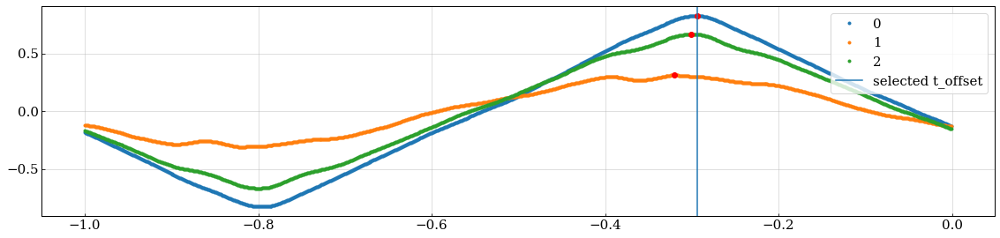

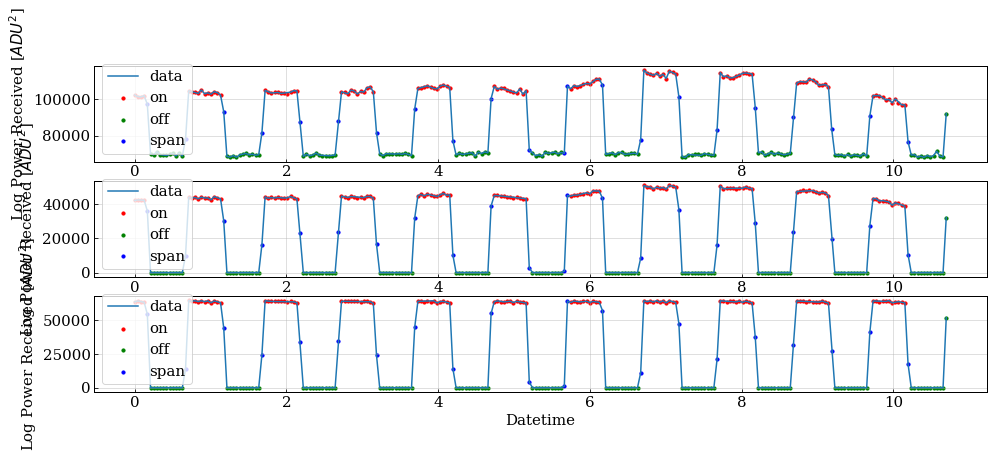

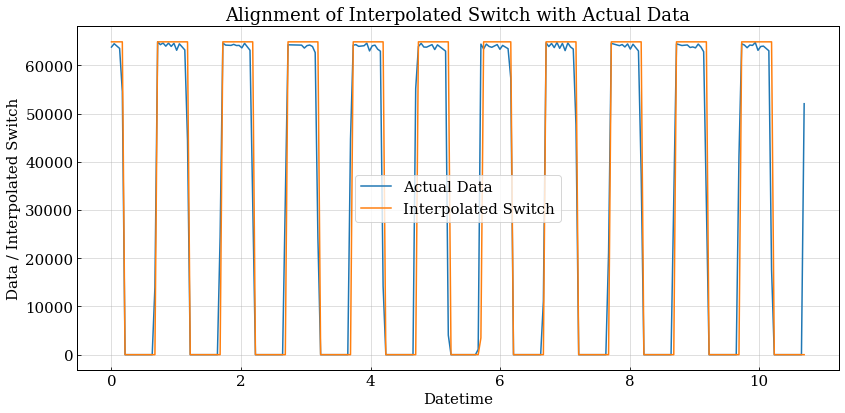

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [967.   0. 972.]
  --> t_deltas = [-0.033 -1.    -0.028]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.0328000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[0.02504926 0.00143775 0.00780944 0.03172666 0.00944843 0.02643533
 0.02337992 0.03099822 0.03620861 0.00774873 0.03434704 0.00986543
 0.00165814 0.00018101 0.00914711 0.00054524 0.01159549 0.0100779
 0.02318988 0.00889418 0.01950719 0.0761032  0.07552652 0.06728094
 0.0606946  0.07353342 0.07724645 0.07257227 0.08129336 0.10980383
 0.0967829  0.11631935 0.0896907  0.06057319 0.06365896 0.06404342
 0.04739039 0.06716965 0.07134808 0.04473966 0.05681969 0.05112366
 0.03865919 0.01464871 0.02211526 0.04359422 0.03215159 0.03572298
 0.03495407 0.06362642 0.03578369 0.02159928 0.02461422 

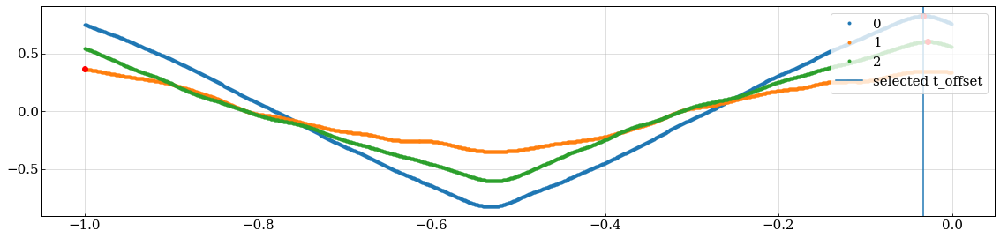

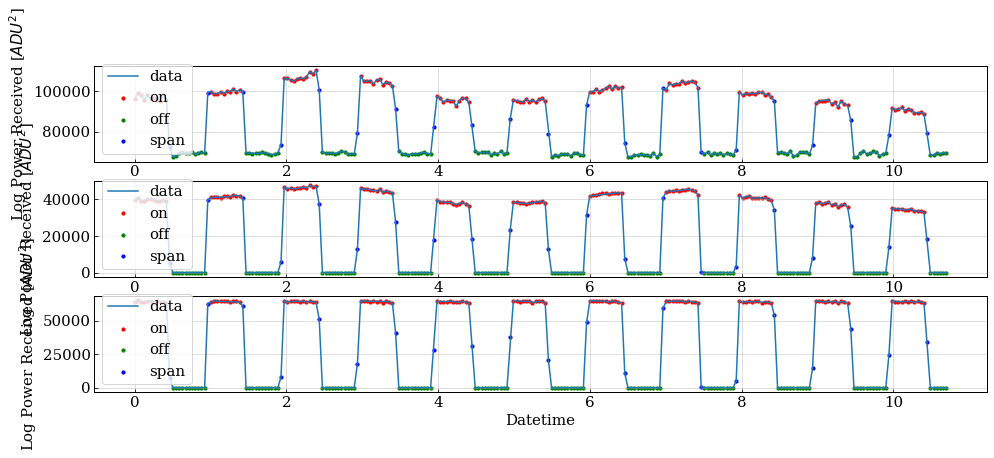

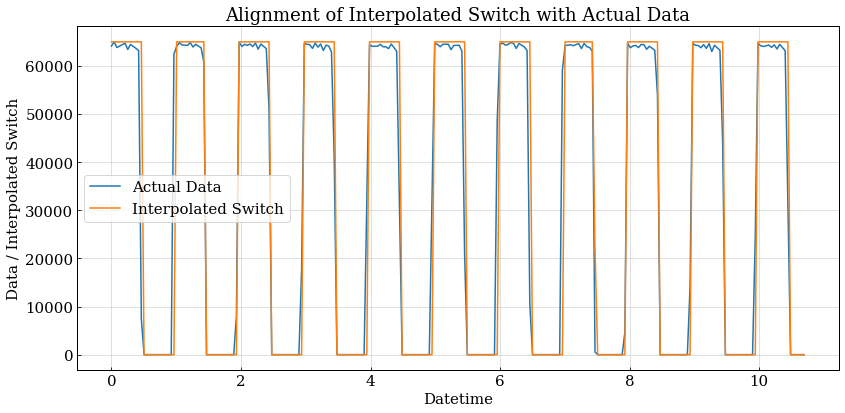

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [230. 293. 238.]
  --> t_deltas = [-0.77  -0.707 -0.762]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.7698000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[3.09641231e-02 3.71266318e-02 3.90424377e-02 4.21290137e-02
 3.29970059e-02 3.53704765e-02 3.56897775e-02 5.17931898e-02
 3.26457749e-02 2.63661891e-02 5.05053426e-02 8.90042590e-03
 1.65317191e-02 1.31684156e-02 5.83513657e-03 1.94373580e-02
 4.37699546e-03 9.75189516e-03 1.28916881e-02 4.63243624e-03
 3.22751197e-03 1.29823341e-02 5.54067899e-02 5.31716831e-02
 6.57095679e-02 4.78925737e-02 5.74396727e-02 5.77909038e-02
 4.96167989e-02 5.68436443e-02 4.09105257e-02 3.98036157e-02
 4.62322086e-02 3.63870953e-02 2.91921801e-02 3.99632662e-02
 3.57165633e-02 1.54728816e-02 4.24751005e

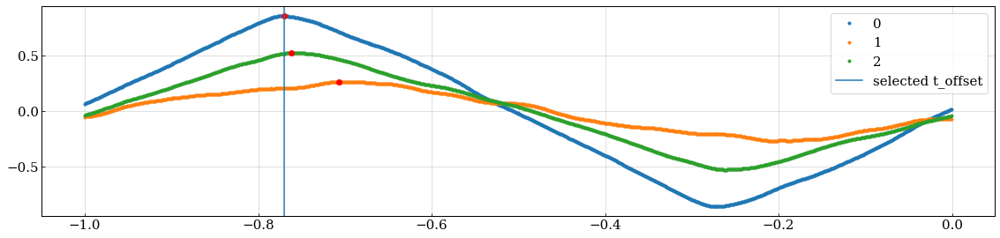

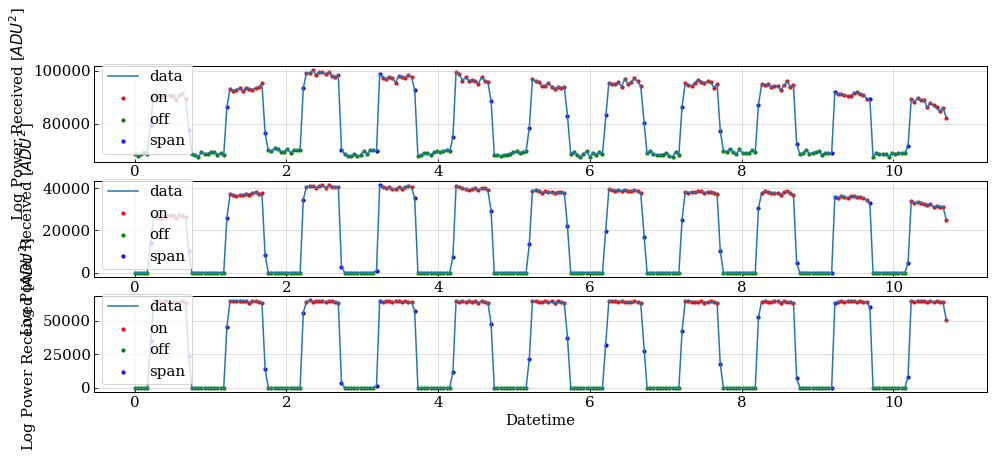

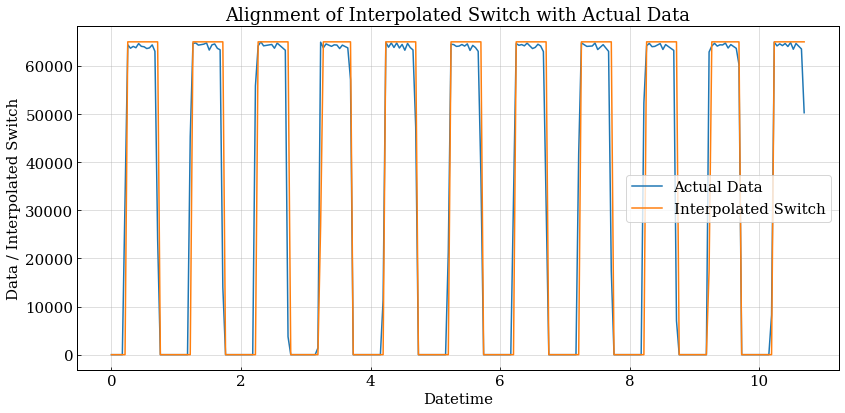

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [488. 577. 507.]
  --> t_deltas = [-0.512 -0.423 -0.493]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.5118000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[0.05190868 0.0477892  0.06464059 0.05636768 0.0450278  0.0515239
 0.0554623  0.05609607 0.04525414 0.02525656 0.03389162 0.01069126
 0.00936714 0.03137919 0.02161241 0.01397326 0.00160351 0.00511894
 0.00113527 0.01667385 0.01953712 0.00940818 0.03585659 0.03265381
 0.02375845 0.04093804 0.06787309 0.05537885 0.04717384 0.03974973
 0.05046716 0.03680724 0.03249537 0.04483117 0.04261299 0.03077515
 0.0207707  0.01052859 0.00237308 0.01029515 0.00411594 0.01332818
 0.0055985  0.02728235 0.05196527 0.04498253 0.03371055 0.04514097
 0.04409978 0.0460124  0.03055303 0.03938049 0.03737733 

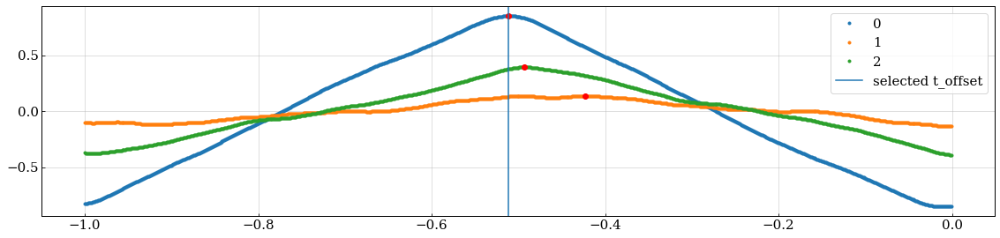

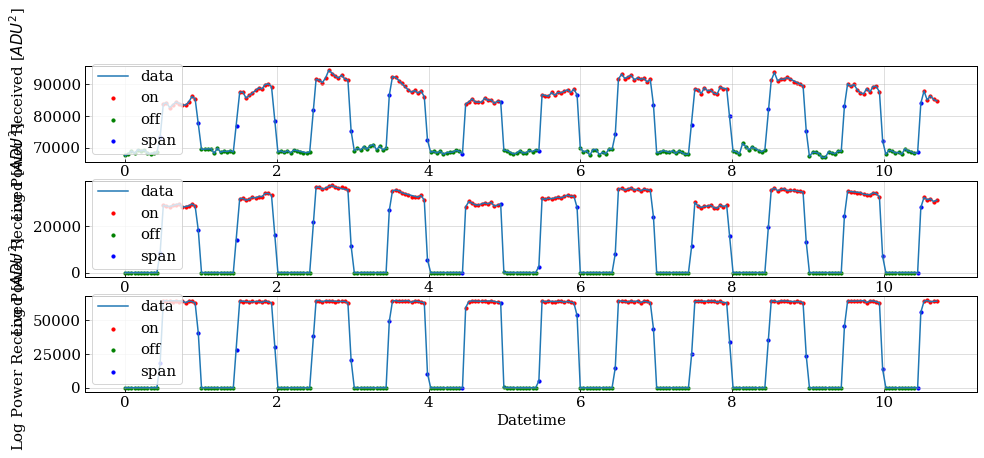

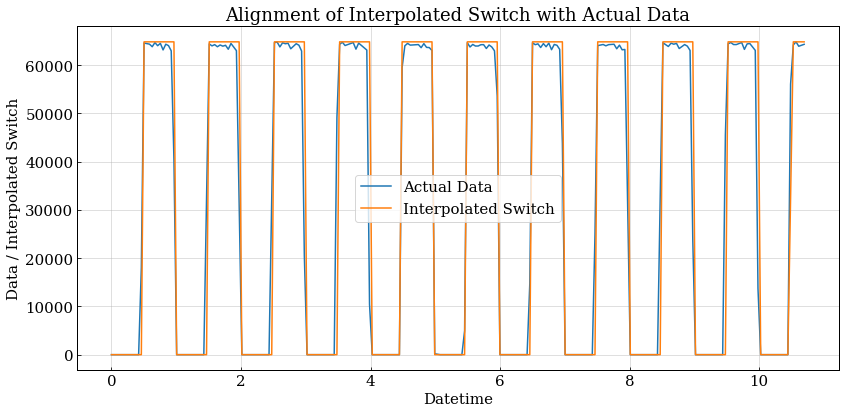

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [753. 733. 735.]
  --> t_deltas = [-0.247 -0.267 -0.265]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.2468000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[0.0384072  0.0315211  0.03920735 0.04518419 0.04454165 0.04526906
 0.04227457 0.04495385 0.02555638 0.03971653 0.03392154 0.0200281
 0.0259322  0.01514236 0.0153727  0.02435616 0.03247885 0.02518055
 0.01768828 0.00858359 0.03371544 0.01152958 0.03010266 0.01939768
 0.02672022 0.03776466 0.02519267 0.02770222 0.02276799 0.02646563
 0.00898366 0.01948254 0.020804   0.02564124 0.02636865 0.0088988
 0.01854904 0.02367725 0.01280254 0.01968864 0.03822535 0.01785801
 0.03051485 0.02596857 0.01496051 0.02696269 0.00975956 0.01875514
 0.01862178 0.01595463 0.00478854 0.01592996 0.0189002  0

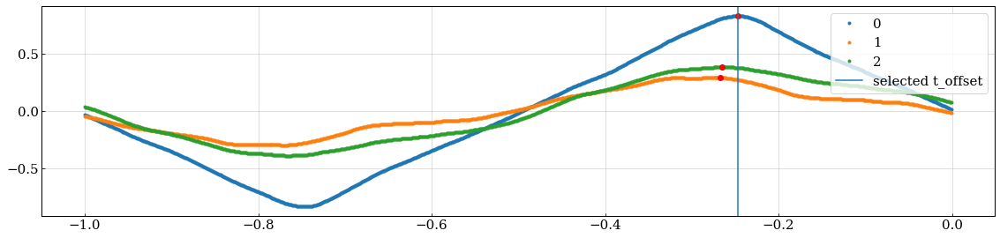

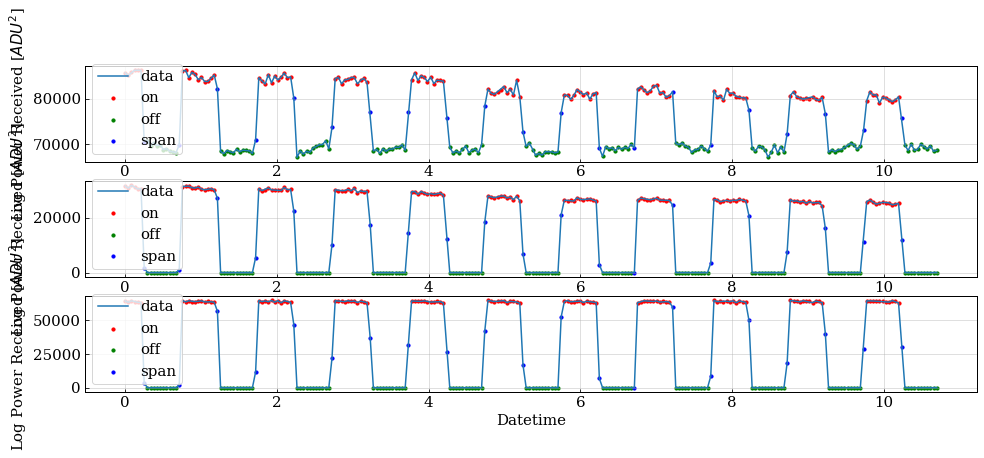

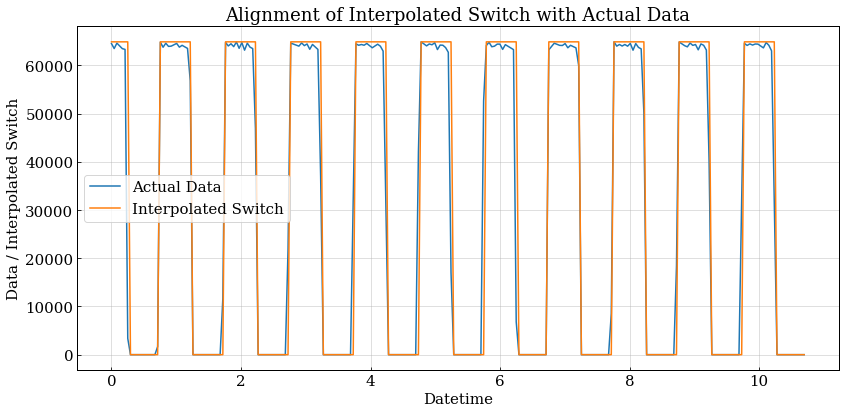

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [ 14. 996. 168.]
  --> t_deltas = [-0.986 -0.004 -0.832]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.9858000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[0.03660232 0.06408589 0.0434798  0.05911882 0.04019916 0.03147715
 0.03523209 0.02365105 0.04919786 0.05311091 0.02801206 0.0224521
 0.03553512 0.01636514 0.02395408 0.02437569 0.00427026 0.02134538
 0.00502125 0.01965895 0.00086809 0.01161909 0.01227786 0.00700776
 0.02579566 0.03870741 0.00387205 0.03638856 0.01943202 0.03899726
 0.04260728 0.03495246 0.02574296 0.03250187 0.03001174 0.0252423
 0.03574298 0.02096035 0.01903676 0.01574295 0.00566388 0.01922121
 0.02267313 0.00540333 0.00868397 0.01429662 0.01172745 0.01748503
 0.00479727 0.03188558 0.01234668 0.01488951 0.02869717 0

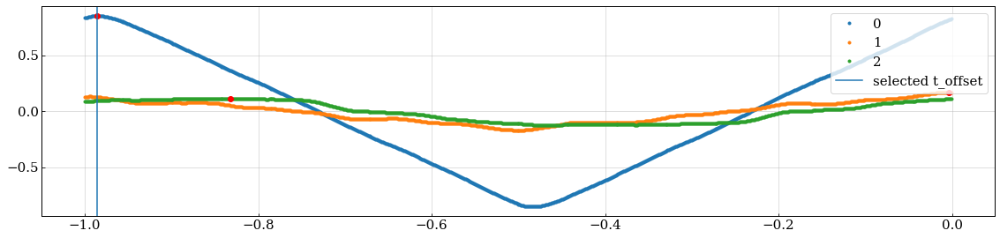

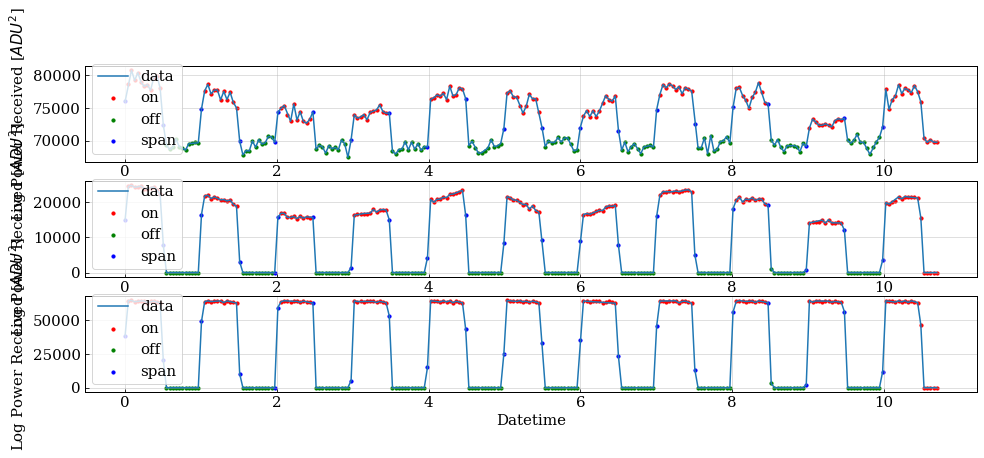

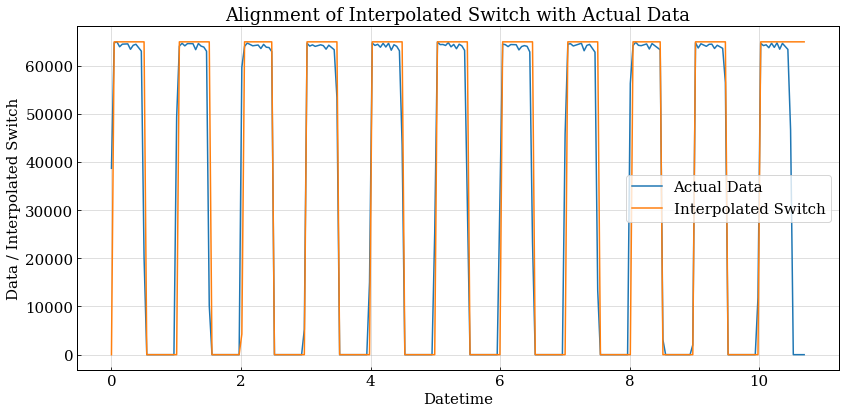

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [280. 154. 258.]
  --> t_deltas = [-0.72  -0.846 -0.742]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.7198000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[1.91462888e-02 4.22117957e-02 3.96534032e-02 5.52302822e-02
 5.09662948e-02 4.37175162e-02 3.29242981e-02 3.41102196e-02
 1.09914129e-02 3.27777235e-02 3.29909229e-02 5.22506418e-03
 1.50855350e-02 7.71683182e-03 1.58583828e-02 7.17050844e-03
 1.15277706e-02 1.51255099e-02 1.90430484e-02 1.14877957e-02
 1.34332399e-02 6.50426040e-03 2.78341631e-02 2.41831239e-02
 3.65886623e-02 3.29376231e-02 2.13049324e-02 1.36430801e-02
 2.21444049e-02 1.43626279e-02 4.09459244e-02 3.67752117e-02
 2.78208382e-02 4.49167627e-02 3.38703703e-02 2.88335352e-02
 3.69884111e-02 2.77275635e-02 2.77009135e

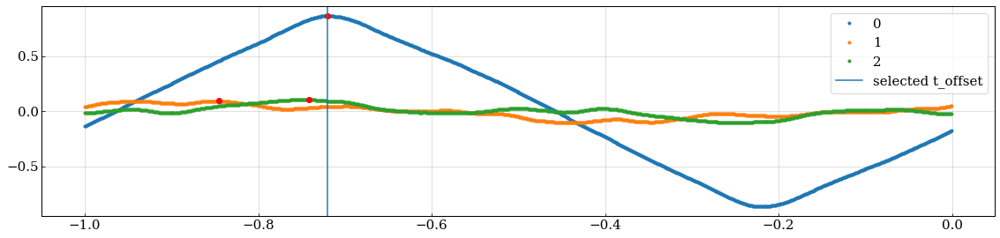

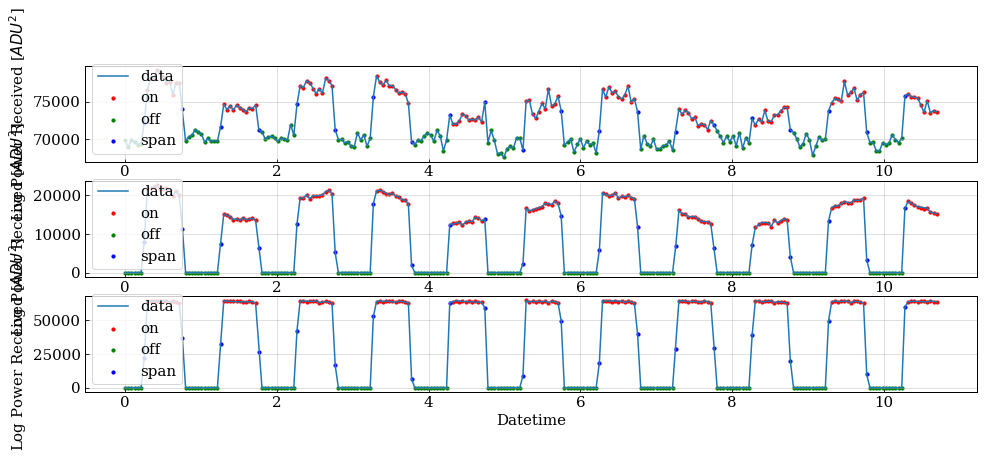

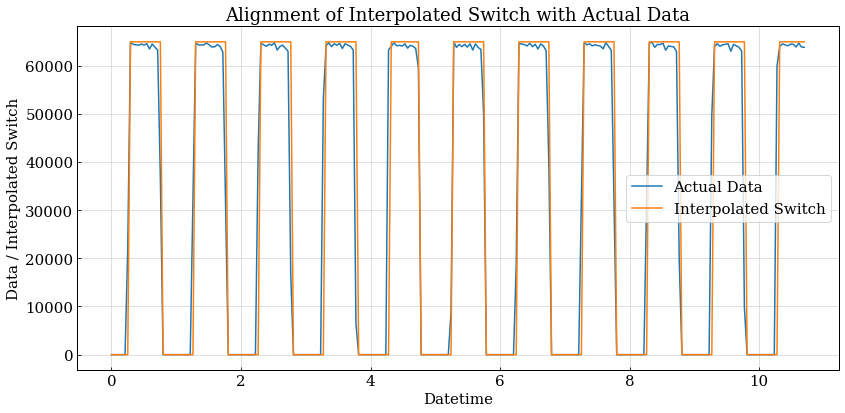

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [546. 482. 457.]
  --> t_deltas = [-0.454 -0.518 -0.543]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.4538000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[0.02284681 0.0201511  0.01443088 0.00519052 0.01300082 0.01960107
 0.01602594 0.03106901 0.01532466 0.0214849  0.00611241 0.02754888
 0.00435174 0.01091074 0.03244468 0.01036072 0.01282206 0.00457235
 0.01034758 0.02475813 0.03964995 0.00725371 0.01298768 0.01051258
 0.00656618 0.01895541 0.00871126 0.01319394 0.01483025 0.01837789
 0.01855664 0.00629117 0.01869415 0.01747035 0.02435937 0.02144425
 0.0188454  0.00931629 0.01280892 0.0031423  0.00530113 0.01469274
 0.00124473 0.03001083 0.00296293 0.00985256 0.00981131 0.01311082
 0.02263994 0.00635932 0.00520488 0.01379896 0.01005882

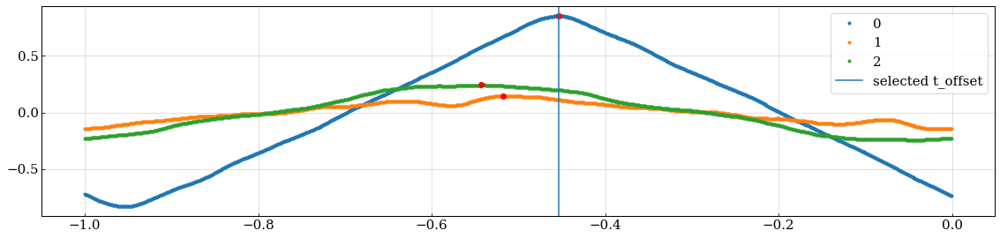

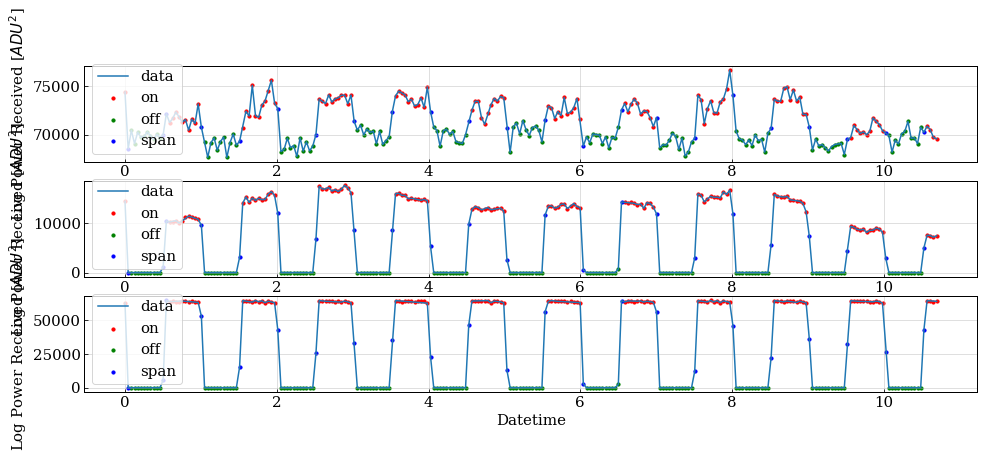

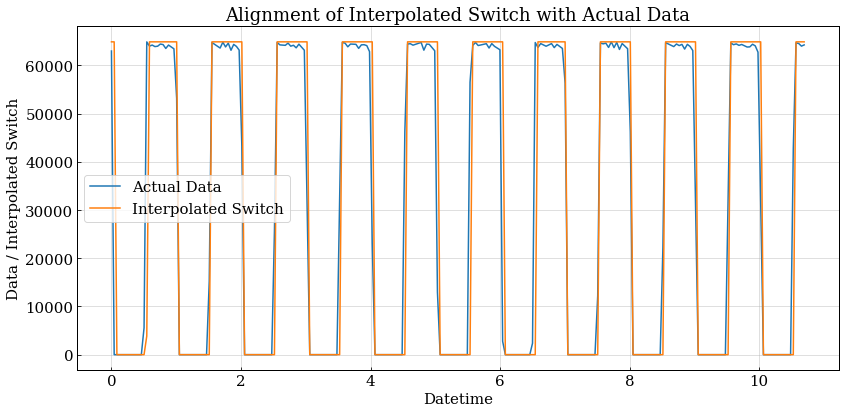

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [803. 652. 877.]
  --> t_deltas = [-0.197 -0.348 -0.123]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.1968000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[2.05398689e-02 2.40971288e-02 3.09465979e-02 2.34693771e-02
 2.20325231e-02 2.14662236e-04 8.29173476e-03 1.51514259e-03
 9.21556406e-03 1.50327303e-02 2.57534554e-03 6.76035721e-03
 1.45165788e-02 8.90866320e-03 4.61205122e-03 1.66648848e-02
 1.65393345e-02 1.58697326e-02 3.44790845e-02 2.05290456e-02
 3.28608800e-02 2.32214031e-02 3.50231360e-02 3.83990454e-02
 4.04218011e-02 3.01824725e-02 3.24284288e-02 4.70341195e-02
 3.62646895e-02 1.59534328e-02 1.22845726e-02 7.69500982e-03
 6.48135643e-03 1.53117311e-02 3.25539791e-02 6.43950632e-03
 1.23822229e-02 2.67299582e-03 1.30099746e

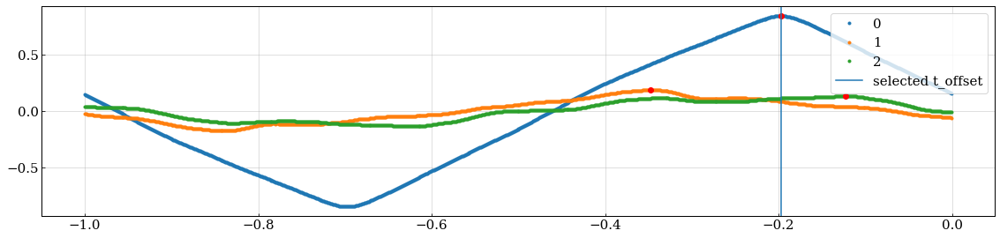

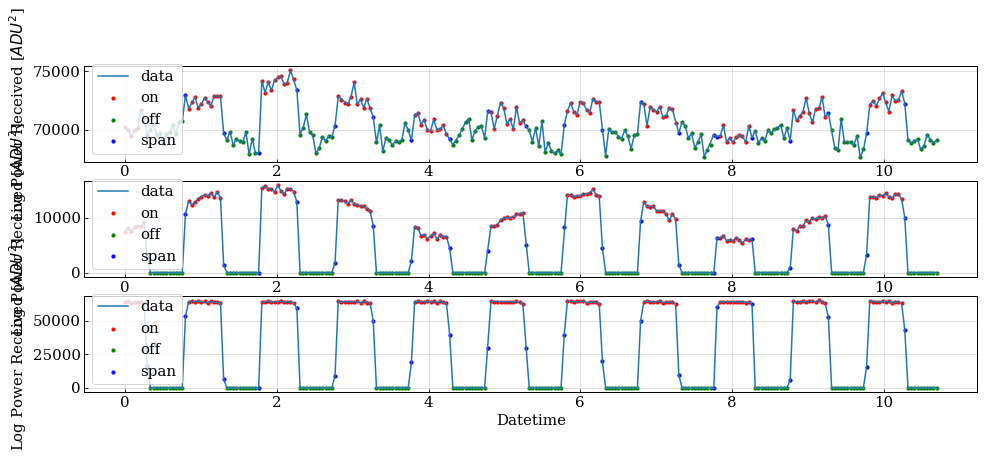

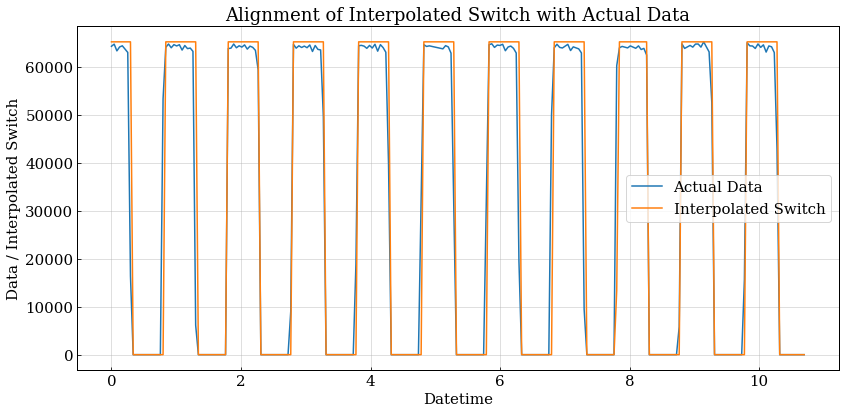

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [62. 16. 14.]
  --> t_deltas = [-0.938 -0.984 -0.986]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.9378000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[0.02572506 0.02757127 0.02974411 0.01253177 0.01733191 0.02633573
 0.01372471 0.02062668 0.02416288 0.01687746 0.00879675 0.02153559
 0.03211578 0.01907871 0.02173441 0.03309569 0.0172325  0.03826508
 0.02406347 0.01767275 0.02514279 0.02626472 0.02322558 0.0207829
 0.01839932 0.02656525 0.00463797 0.02183611 0.02047276 0.026125
 0.02041595 0.00364386 0.02310005 0.02328468 0.00391369 0.02342669
 0.00942391 0.01777445 0.00970794 0.01398262 0.00163914 0.00774812
 0.00401081 0.012037   0.01219322 0.02226216 0.0022237  0.0057883
 0.00440845 0.00294569 0.00713745 0.00199647 0.00157042 0.0026

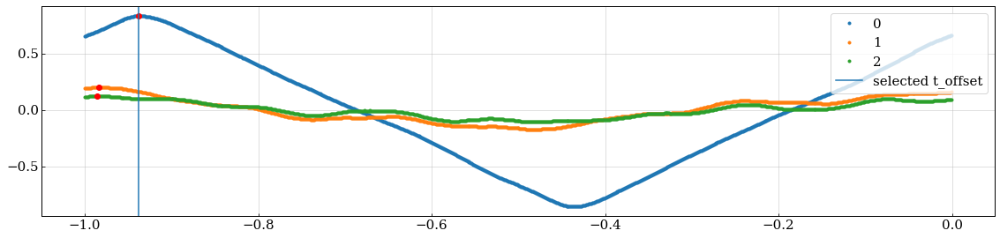

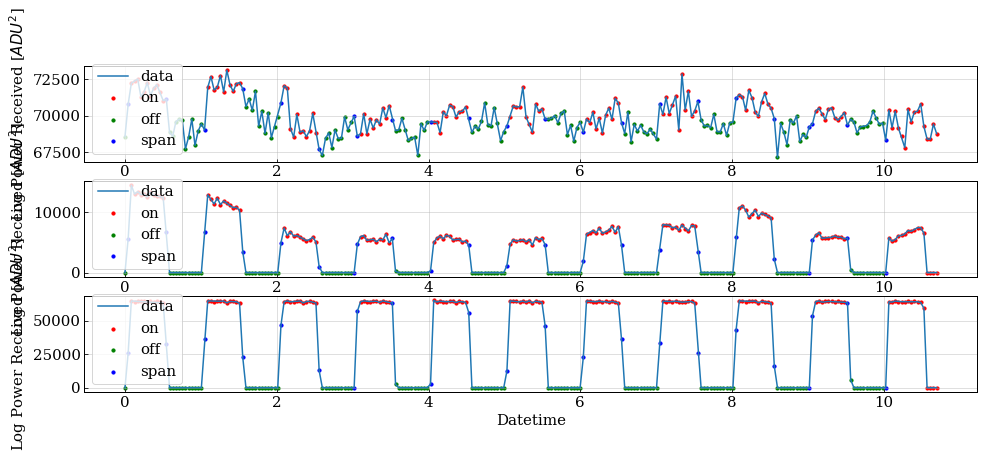

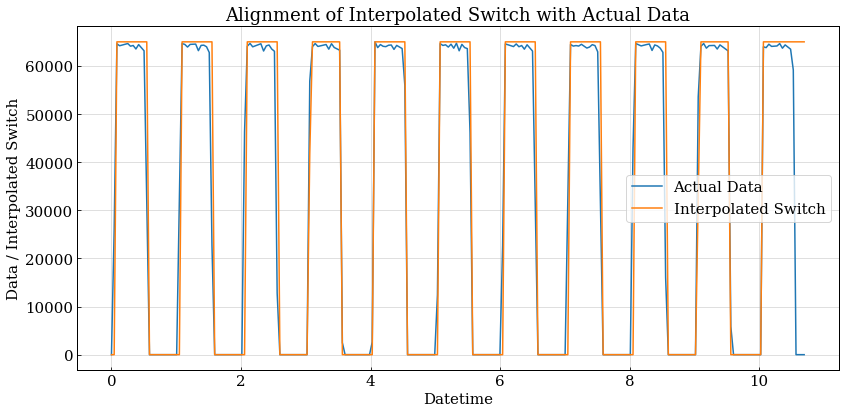

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [332. 985. 962.]
  --> t_deltas = [-0.668 -0.015 -0.038]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.6678000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[0.00554336 0.00259731 0.00525872 0.012503   0.00756444 0.02119883
 0.00106023 0.01233221 0.04112383 0.01357041 0.0164453  0.00450453
 0.01589025 0.0049315  0.0062692  0.01322884 0.02266474 0.00557182
 0.01421085 0.01970446 0.00871725 0.00814796 0.00386409 0.00350816
 0.01240337 0.01570511 0.01637414 0.00682437 0.00162964 0.00097496
 0.00518768 0.00560041 0.01278764 0.01113671 0.00999802 0.00659666
 0.02832914 0.00184312 0.01278764 0.0057285  0.00681014 0.00114575
 0.0044476  0.01167753 0.01788275 0.02173966 0.01563407 0.017285
 0.02030221 0.01505055 0.00779216 0.00848953 0.02925423 0

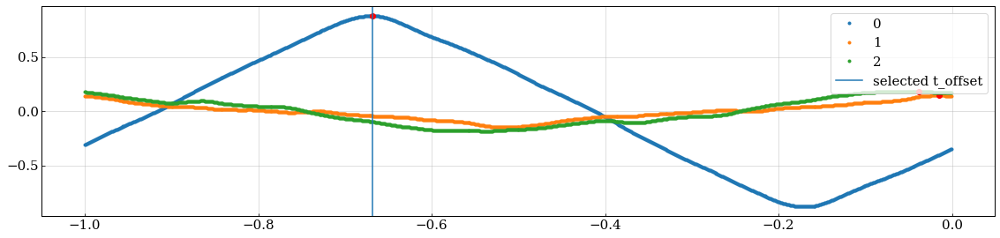

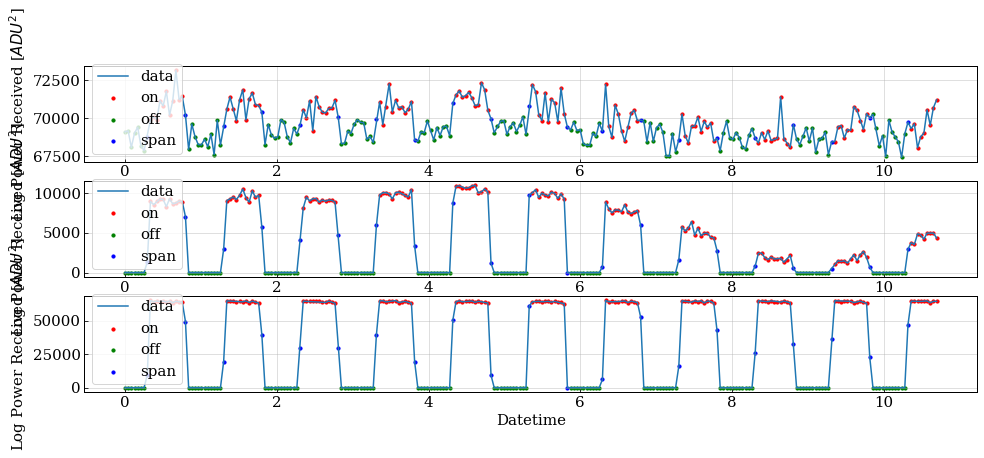

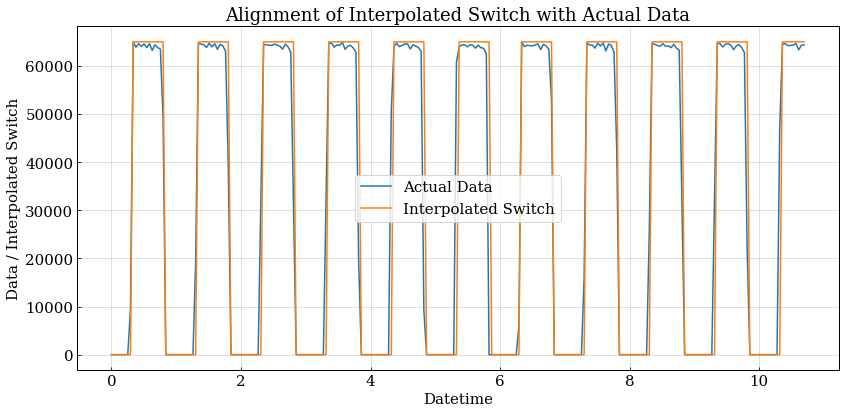

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [594. 279. 160.]
  --> t_deltas = [-0.406 -0.721 -0.84 ]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.4058000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[0.0153547  0.01931286 0.0064152  0.01004351 0.01073189 0.00558341
 0.00966125 0.00149618 0.00353757 0.00807877 0.01962341 0.00305936
 0.00731869 0.00322207 0.00184037 0.00108523 0.01153994 0.0129884
 0.01189847 0.01611478 0.01458027 0.00879583 0.00911629 0.00980466
 0.01181243 0.00547363 0.00315975 0.00167322 0.00383874 0.01871992
 0.01097569 0.01099498 0.010316   0.00967064 0.01146824 0.0043837
 0.00214648 0.00350394 0.00898722 0.01924115 0.01359073 0.014695
 0.01075118 0.00346587 0.00921173 0.00218455 0.01168336 0.01806518
 0.01351903 0.01088025 0.00233291 0.00050664 0.01157802 0.0

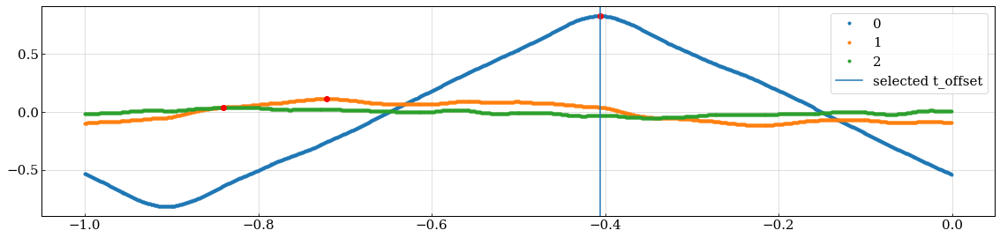

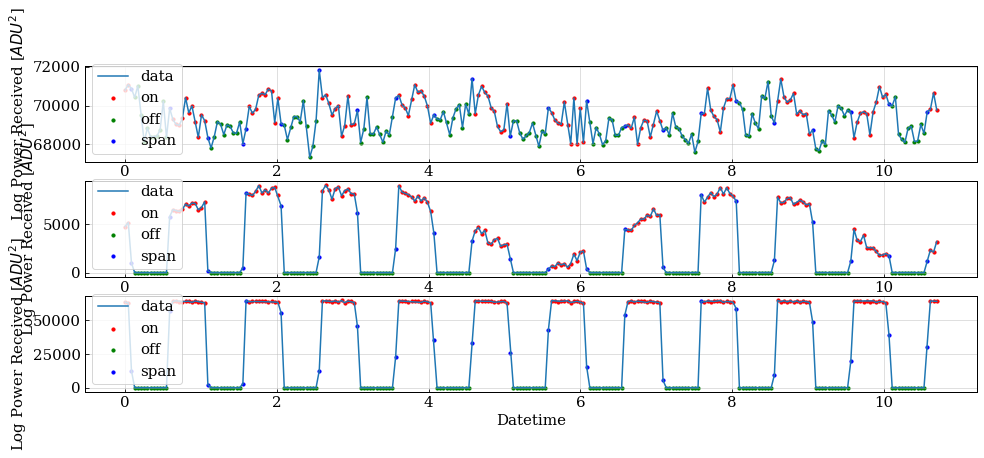

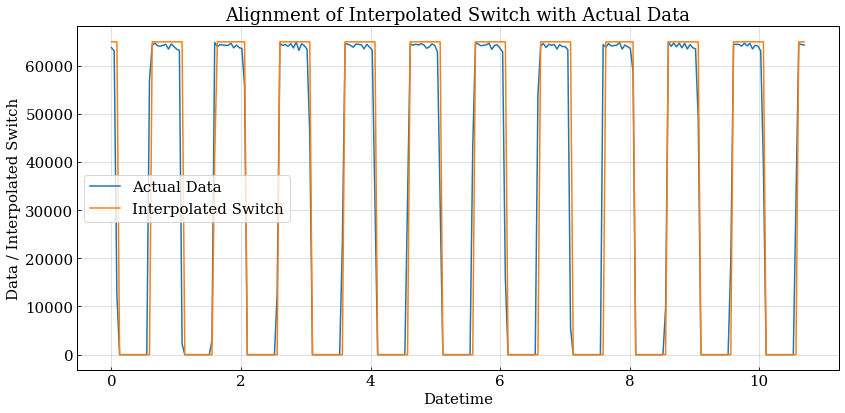

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [853. 472. 925.]
  --> t_deltas = [-0.147 -0.528 -0.075]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.1468000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[6.00984059e-03 1.39880973e-02 1.23493202e-02 2.35188796e-02
 8.72428196e-05 6.29536255e-03 1.47931106e-02 1.86744247e-02
 9.73302706e-03 6.84360436e-03 1.26204670e-02 2.90478933e-03
 1.65216090e-03 1.39737221e-02 1.28812040e-02 9.18478525e-03
 6.44109771e-03 8.77880872e-04 3.59281793e-03 1.32386022e-02
 6.95662346e-03 5.60535116e-03 4.22731117e-03 7.57674146e-03
 1.00527522e-03 5.54983300e-03 3.06291694e-03 9.27301946e-03
 1.13286784e-02 2.10894645e-02 5.30347117e-03 6.25223684e-03
 1.13410708e-02 2.57163082e-02 6.89912252e-03 1.53230116e-02
 5.07545017e-03 8.60977576e-03 1.23205698e

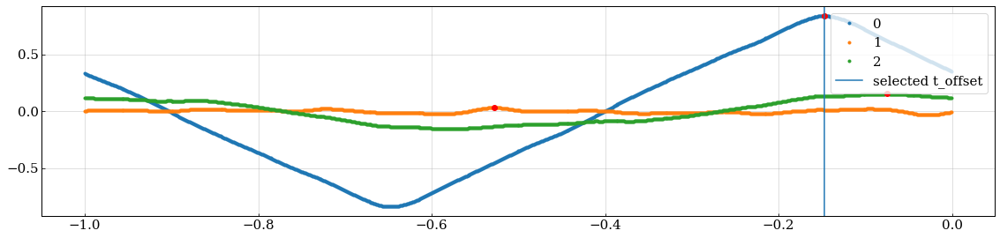

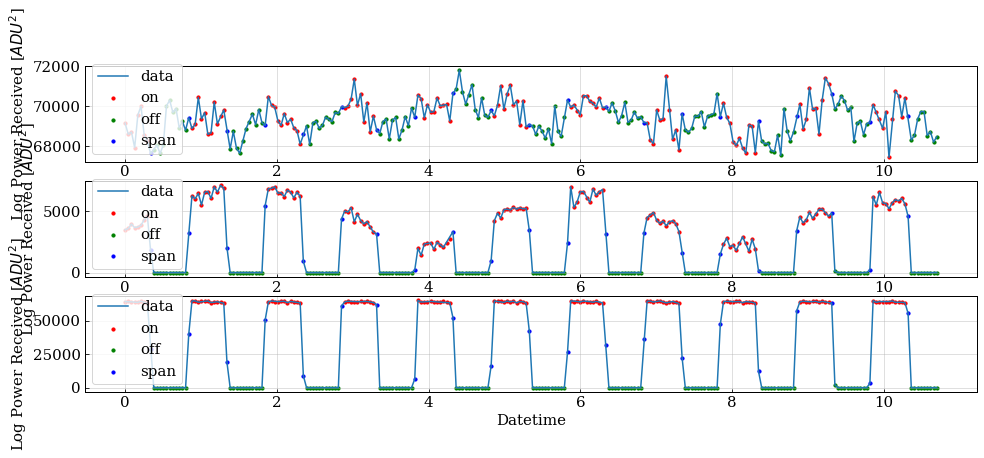

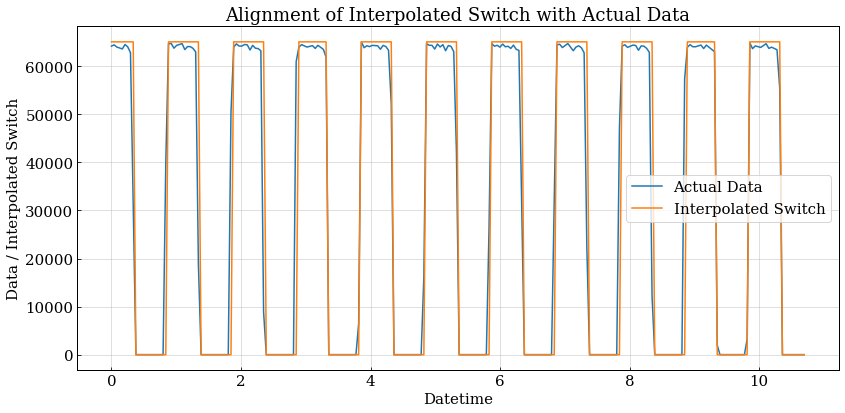

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [124. 385. 775.]
  --> t_deltas = [-0.876 -0.615 -0.225]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.8758000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[1.59908544e-02 2.98120442e-03 4.53202363e-03 2.42331713e-02
 1.74985953e-02 1.20132904e-02 6.52798538e-03 1.26594650e-02
 4.30227264e-03 7.25707422e-03 8.79353399e-03 2.09305008e-02
 7.28903555e-03 2.04784101e-03 9.14140294e-03 1.01178447e-02
 5.47974648e-03 3.52612190e-02 3.42310452e-03 5.14947942e-03
 3.87148952e-03 9.17012181e-03 1.11804430e-02 4.12995939e-03
 1.37364228e-02 2.83686892e-02 9.71578042e-03 6.42746933e-03
 1.00173286e-02 3.28275260e-03 3.22531485e-03 1.17261016e-02
 1.76565491e-02 4.65060479e-04 4.64689913e-03 2.09091932e-03
 5.96472488e-03 1.01576805e-02 6.06524094e

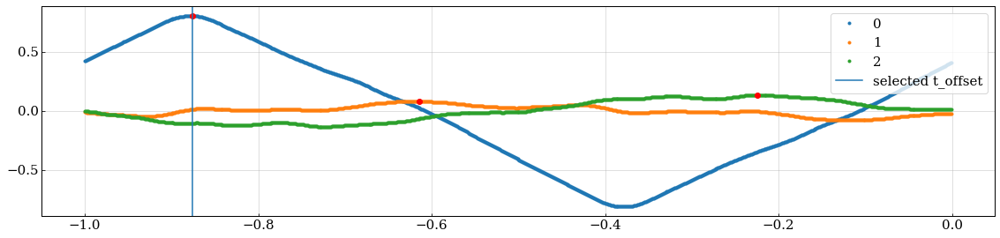

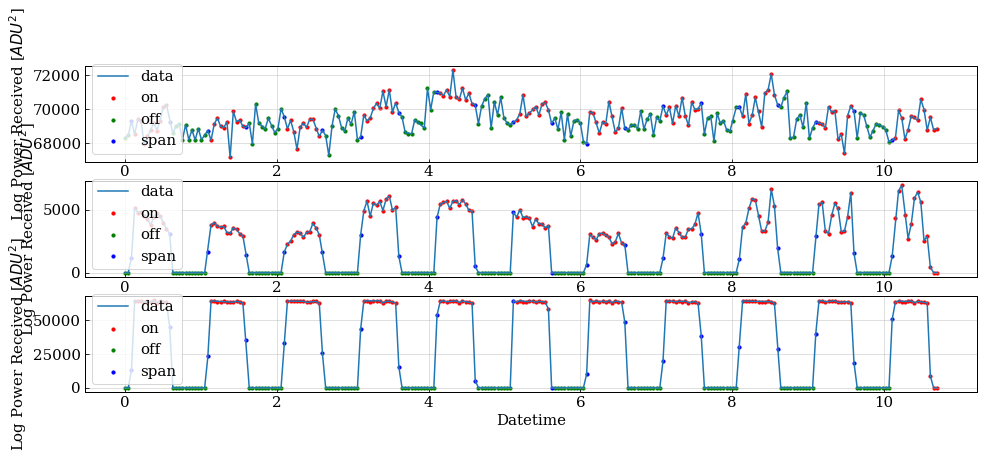

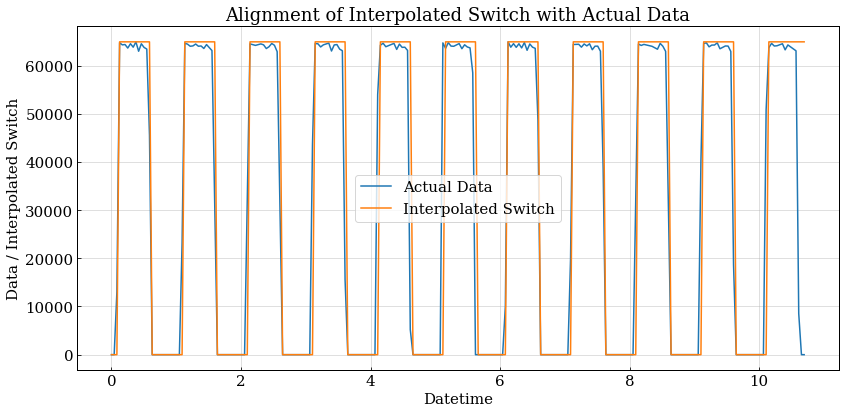

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [381.   0.  13.]
  --> t_deltas = [-0.619 -1.    -0.987]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.6188000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[2.51233562e-03 2.51295463e-02 1.87275146e-02 2.65555780e-03
 1.56601323e-02 1.02033670e-02 6.57984570e-03 2.82661122e-02
 8.40119496e-03 8.21257862e-03 4.46258484e-03 5.26220159e-03
 1.03322670e-02 1.73358319e-02 1.69596916e-03 1.36406995e-02
 1.20103940e-02 1.99916324e-03 2.50555077e-02 5.92102365e-03
 2.99929105e-03 1.12369942e-02 1.23765816e-03 1.07762558e-02
 1.77000774e-03 2.54135632e-02 3.17869504e-02 1.92406869e-02
 1.35466341e-03 8.22690084e-03 1.36836661e-02 9.95988929e-03
 2.80202070e-02 3.70350726e-03 4.08777966e-03 6.12153471e-03
 1.84983591e-02 2.07183030e-02 3.93266275e

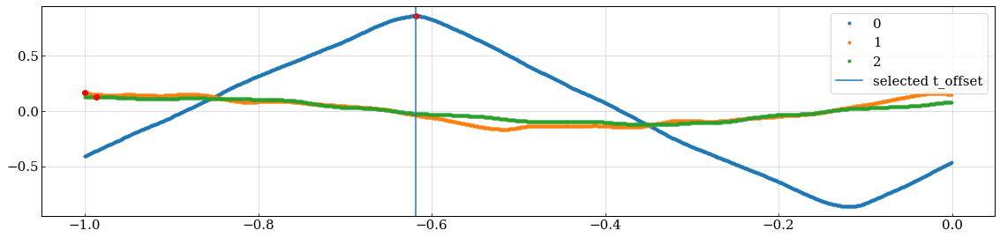

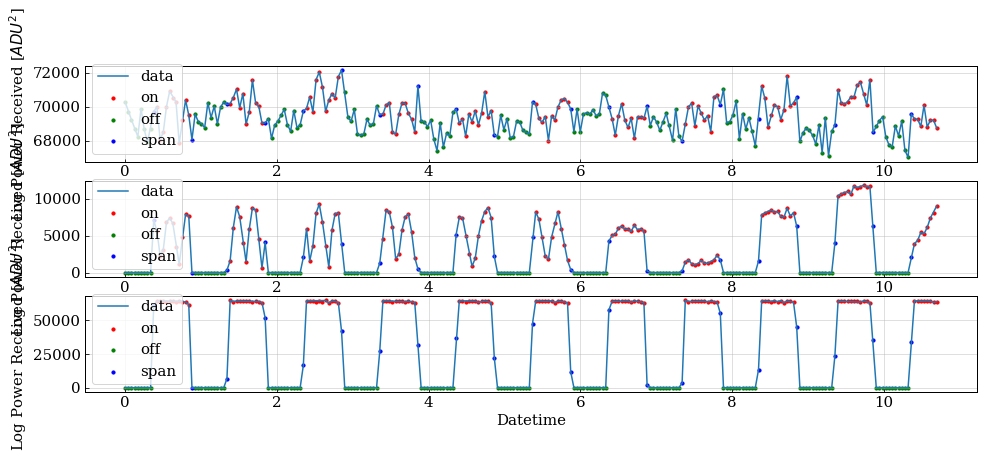

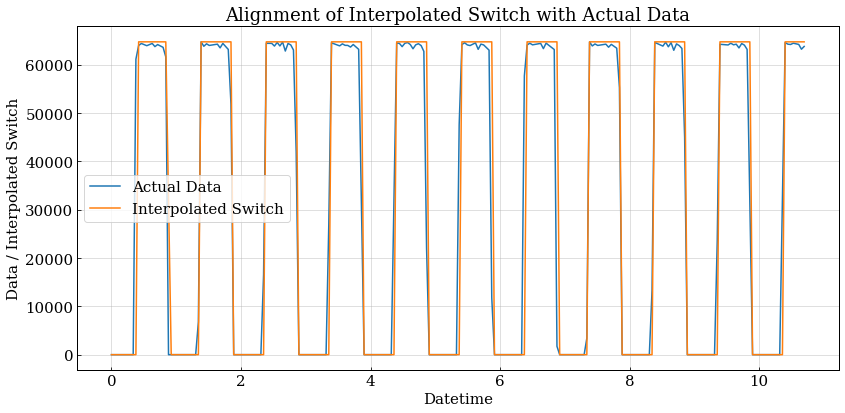

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [642. 925. 556.]
  --> t_deltas = [-0.358 -0.075 -0.444]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.3578000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[0.00359602 0.00015363 0.02099037 0.0109849  0.00951576 0.01543551
 0.00586693 0.00196365 0.00228052 0.00647187 0.00253978 0.0162805
 0.00694718 0.01861383 0.00638545 0.0114554  0.00445541 0.00258299
 0.00330315 0.00653428 0.0145425  0.01455691 0.01097049 0.00127229
 0.01110012 0.01301576 0.00853634 0.0074705  0.0136639  0.00649107
 0.0035096  0.01413921 0.0079026  0.00458984 0.02260834 0.01614127
 0.00140192 0.00788819 0.01998694 0.0052908  0.00885321 0.01256926
 0.00690877 0.01140259 0.00337517 0.01136898 0.00709601 0.01589161
 0.0123196  0.00769615 0.01916115 0.0087908  0.01008709 

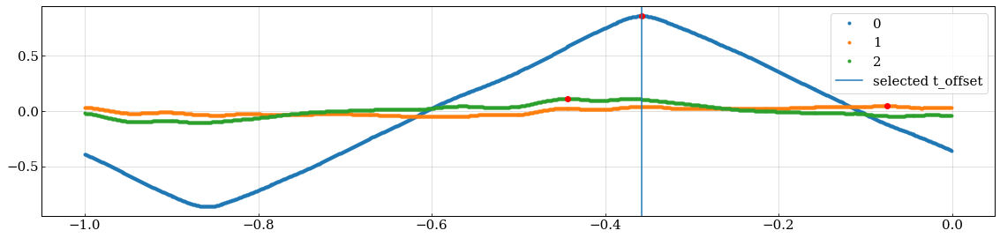

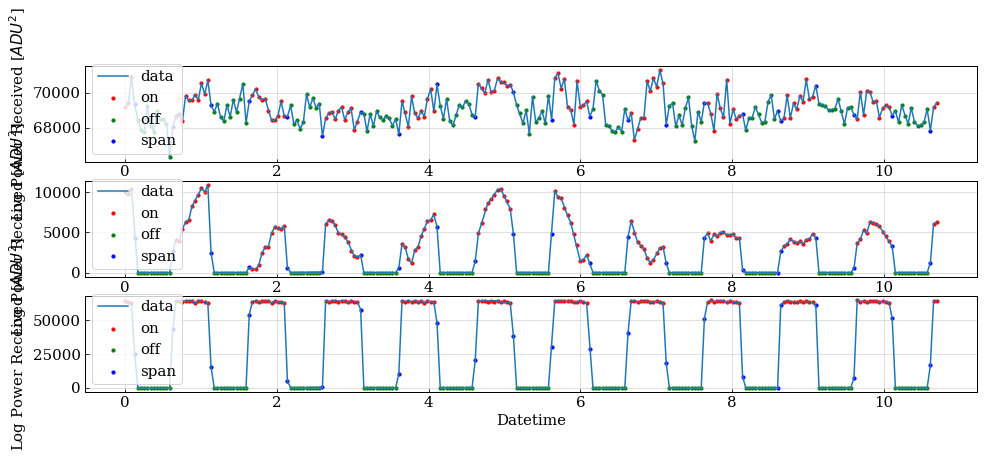

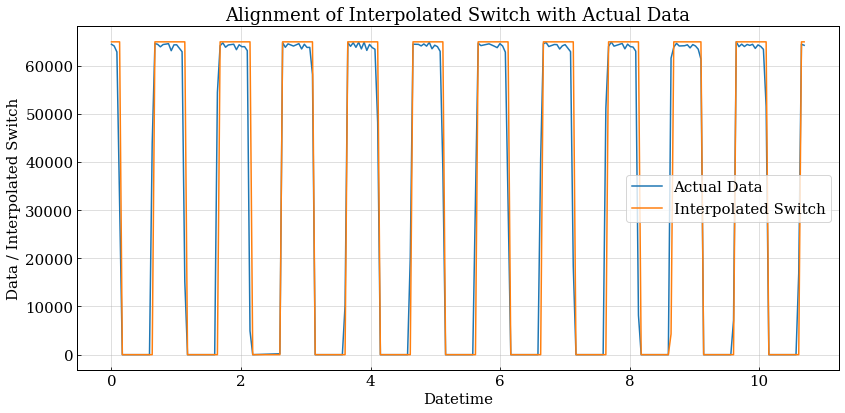

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [903. 534. 611.]
  --> t_deltas = [-0.097 -0.466 -0.389]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.0968000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[2.96816922e-02 2.34047919e-02 1.17274954e-02 3.07843909e-02
 2.55247673e-03 3.39793897e-02 2.06904566e-02 2.27262081e-02
 2.26272479e-02 2.15528236e-02 4.58822818e-03 9.73415545e-03
 7.09050600e-03 1.18674294e-02 1.74389092e-02 2.28110311e-02
 4.00716682e-03 1.73809229e-02 9.44997451e-03 2.04869055e-05
 1.86956790e-02 9.37928870e-03 1.05809475e-02 3.28617152e-03
 1.05809475e-02 3.51230622e-02 3.81060036e-02 3.30873108e-02
 2.24985758e-02 2.63580213e-02 2.37567833e-02 3.45641650e-04
 9.12565841e-04 1.53183348e-02 5.51984325e-03 5.83086083e-03
 1.31963227e-02 4.64333915e-03 2.32054339e

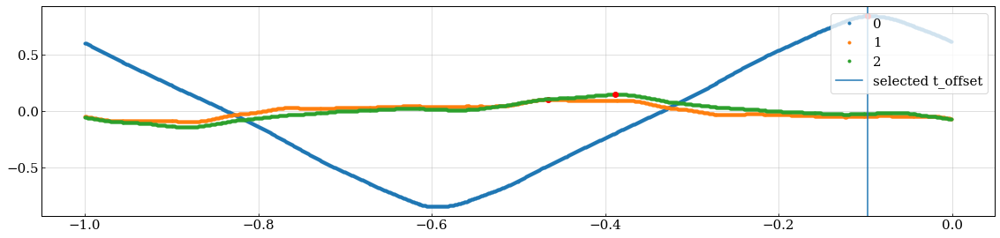

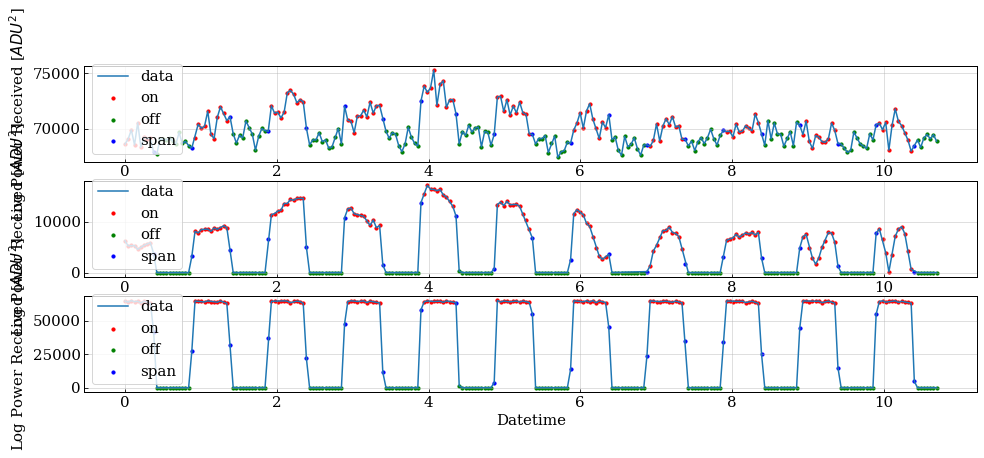

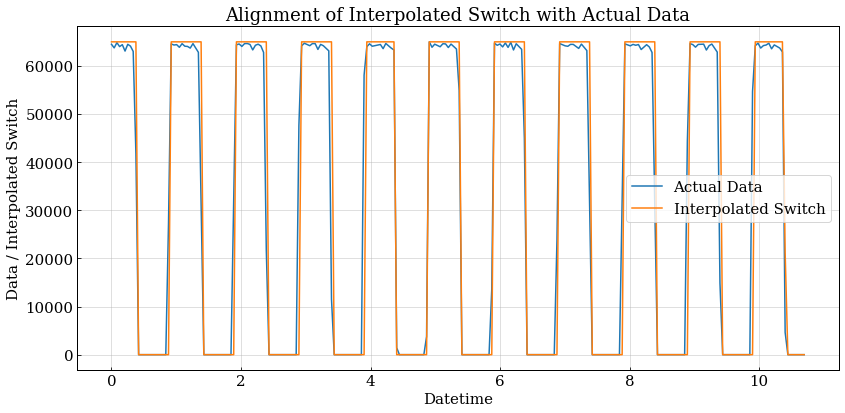

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [172. 395.   0.]
  --> t_deltas = [-0.828 -0.605 -1.   ]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.8278000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[5.07070441e-03 1.00851569e-02 5.82992998e-03 1.25053850e-02
 2.56382753e-03 3.61025210e-03 1.35231595e-02 1.77490377e-02
 2.17743657e-02 1.36664096e-02 2.26911664e-02 9.18268127e-03
 9.49713273e-03 1.02993333e-02 9.18198249e-03 2.02695408e-02
 1.38805860e-02 1.14250695e-04 3.35240190e-03 3.14800846e-04
 8.73860594e-03 1.66882881e-02 1.29494603e-02 2.01262907e-02
 1.20365029e-03 9.41118266e-03 2.50722627e-03 4.82717923e-03
 3.81080225e-03 7.00527964e-03 7.95073035e-03 2.29490166e-02
 1.84652882e-02 2.23505107e-03 1.28069090e-02 1.06868074e-02
 1.57858124e-02 7.40637994e-03 5.76494334e

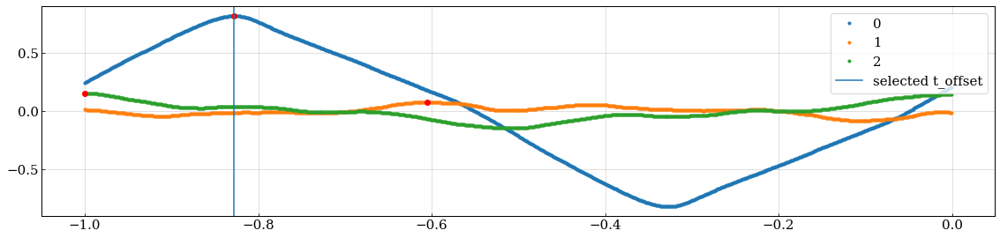

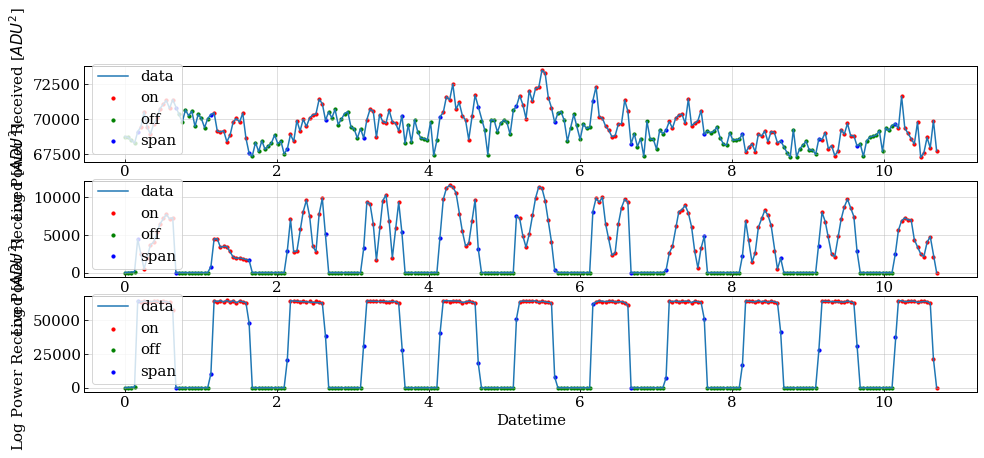

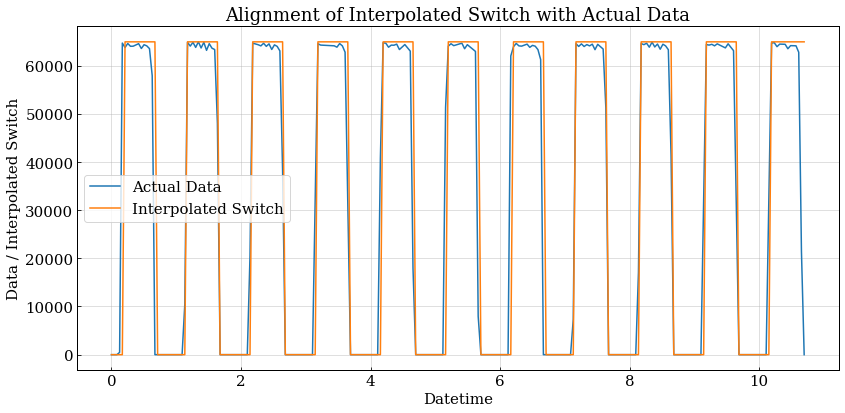

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [429. 181. 996.]
  --> t_deltas = [-0.571 -0.819 -0.004]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.5708000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[0.01603991 0.00119071 0.0011475  0.01910273 0.01072034 0.00925623
 0.00927063 0.00015371 0.01880523 0.00457535 0.00720608 0.01760484
 0.01010103 0.01095079 0.00224211 0.01688471 0.01131582 0.01447002
 0.01794107 0.0271156  0.02174339 0.01638061 0.00687482 0.00955372
 0.00740772 0.00503127 0.00778219 0.00578518 0.01298157 0.01784969
 0.0009841  0.00310627 0.0006002  0.00664437 0.01946279 0.00283262
 0.00366301 0.00461856 0.01193017 0.00037919 0.00284702 0.00500743
 0.0016804  0.0027462  0.01591972 0.01805629 0.00860811 0.0328911
 0.01956858 0.02669793 0.01321698 0.01570865 0.0323726  

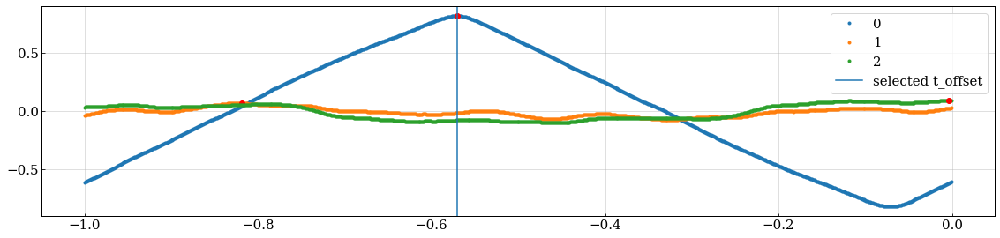

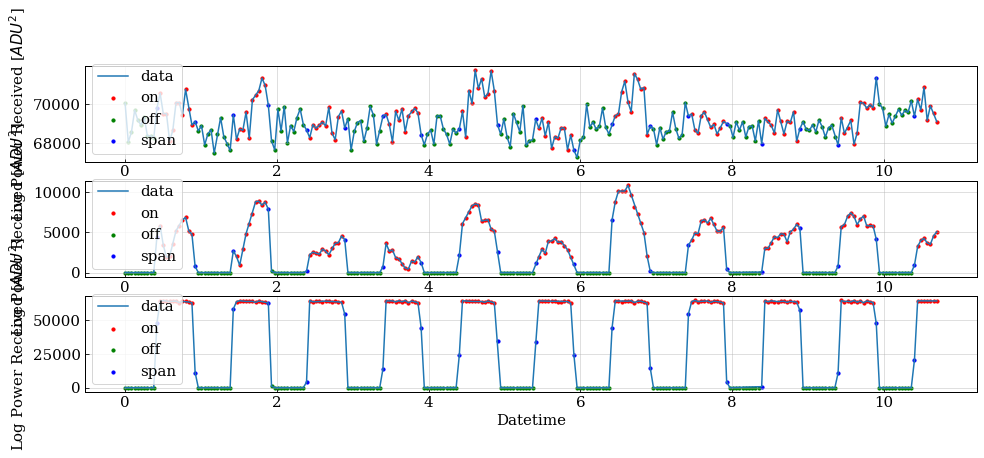

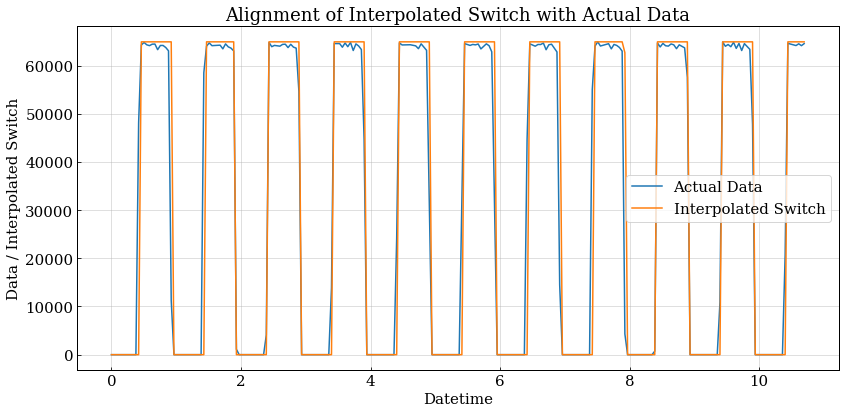

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [691. 342. 188.]
  --> t_deltas = [-0.309 -0.658 -0.812]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.3088000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[0.00309935 0.01336919 0.00672386 0.00600471 0.01216064 0.00760123
 0.00691084 0.00177649 0.00446573 0.00502705 0.00466709 0.00911144
 0.0077882  0.02070414 0.00084121 0.01030523 0.01506639 0.02432866
 0.02524917 0.00049602 0.01497971 0.0016179  0.0043079  0.01482149
 0.02303419 0.01935214 0.00019436 0.01745358 0.01247745 0.0136277
 0.00856489 0.01421741 0.00045287 0.01247706 0.03497208 0.0071122
 0.00951417 0.01115383 0.01554064 0.00994566 0.01522422 0.01398766
 0.01529613 0.01595775 0.02191231 0.02110686 0.02296227 0.01220417
 0.00682493 0.00105734 0.00780297 0.00220798 0.00406339 0

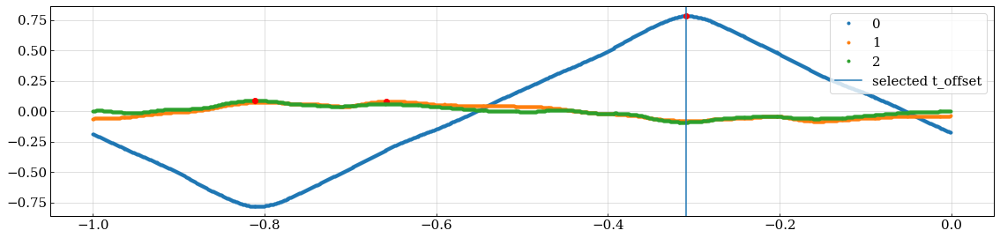

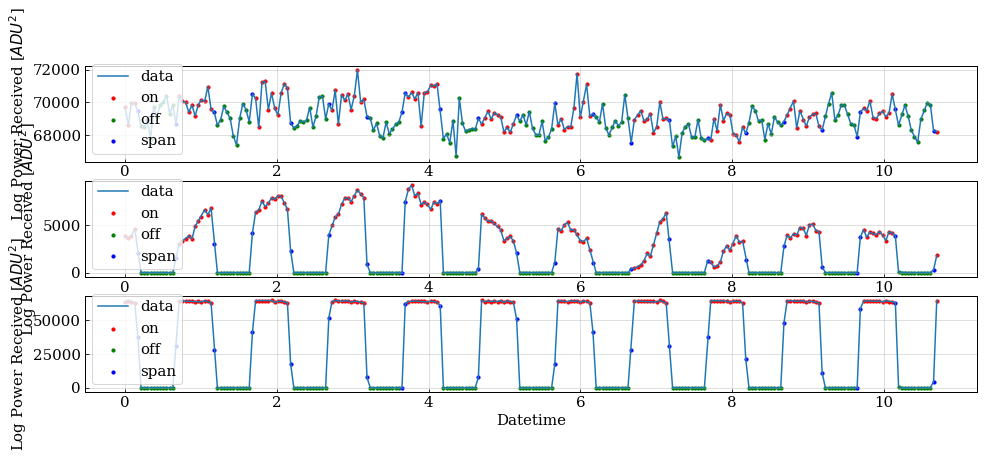

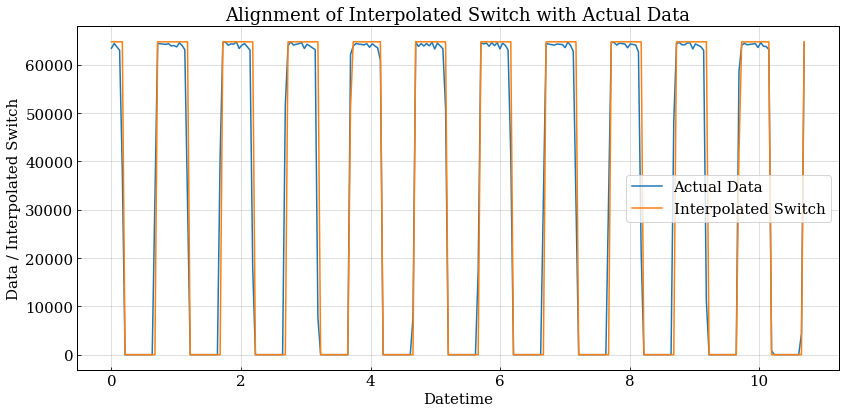

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [956. 934. 716.]
  --> t_deltas = [-0.044 -0.066 -0.284]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.0438000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[2.12696189e-02 1.43745063e-03 7.54855346e-03 7.92952855e-05
 7.93549060e-04 2.65370914e-03 3.82823330e-03 1.69781342e-02
 4.79945149e-04 6.17489678e-03 2.65782296e-02 3.00552980e-02
 2.38183959e-03 6.83191486e-03 1.15252418e-02 1.73775916e-02
 2.12982367e-02 5.37359705e-03 5.04329940e-03 6.88915056e-03
 1.12390634e-02 9.93814372e-03 8.37668242e-04 3.07045654e-04
 3.69826057e-03 3.58498159e-03 6.30367710e-03 9.95066402e-04
 1.45456171e-02 1.06535899e-02 7.59028782e-03 2.09548226e-02
 2.10836029e-02 1.15681686e-02 5.87321697e-03 1.27701182e-02
 8.76361956e-03 7.83353952e-03 5.41652383e

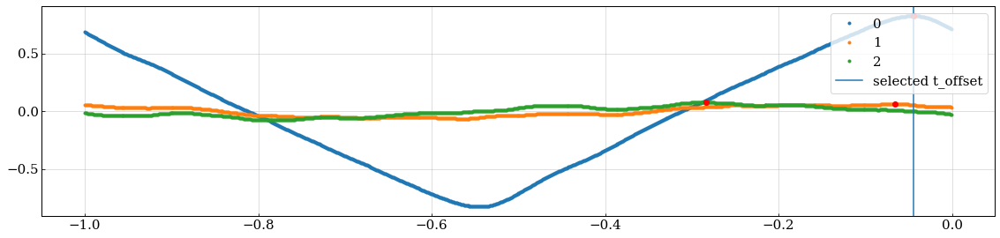

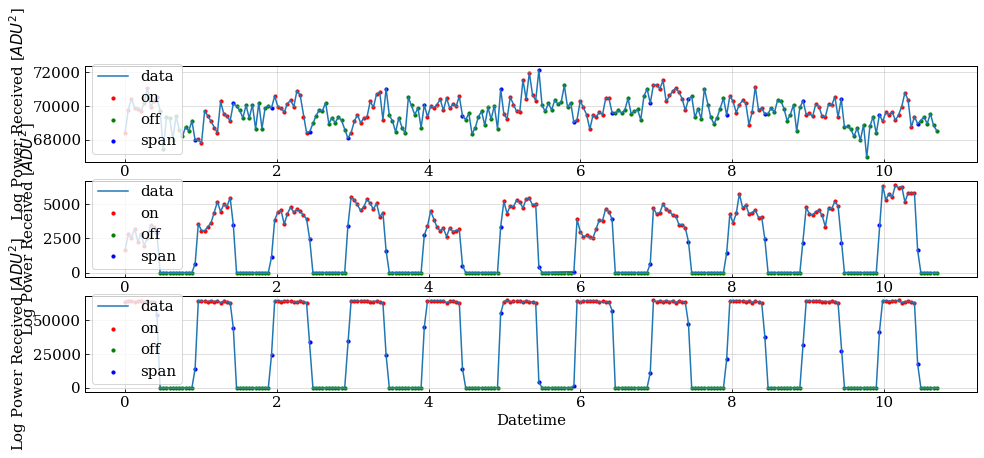

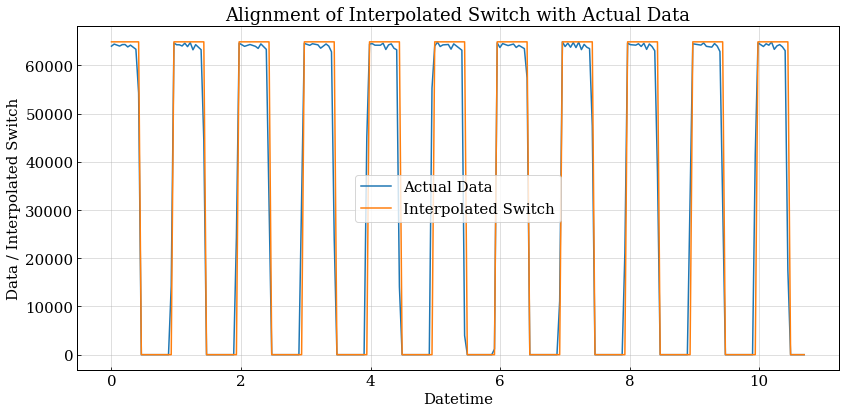

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [219. 126. 471.]
  --> t_deltas = [-0.781 -0.874 -0.529]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.7808000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[0.01497766 0.00091702 0.01546895 0.01356159 0.01253566 0.00087367
 0.00379251 0.01064275 0.00906773 0.01697172 0.00736267 0.0004846
 0.01168205 0.0008603  0.00658131 0.02139226 0.01607477 0.00088919
 0.00266543 0.01386503 0.00617671 0.00029568 0.01259346 0.01872014
 0.00401033 0.00757941 0.01145193 0.0058021  0.02604507 0.00405368
 0.01267908 0.00055685 0.00210297 0.00587327 0.00286773 0.0005713
 0.01253566 0.00052795 0.02435445 0.01480319 0.00736267 0.01194215
 0.0043994  0.00796955 0.01166868 0.00723262 0.01867679 0.01616254
 0.0033312  0.01851677 0.0070148  0.00519413 0.01129191 0

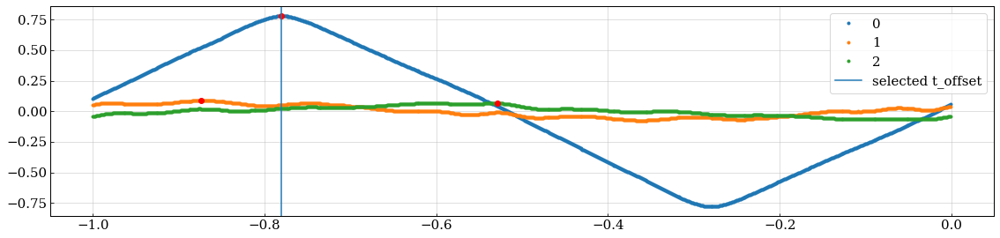

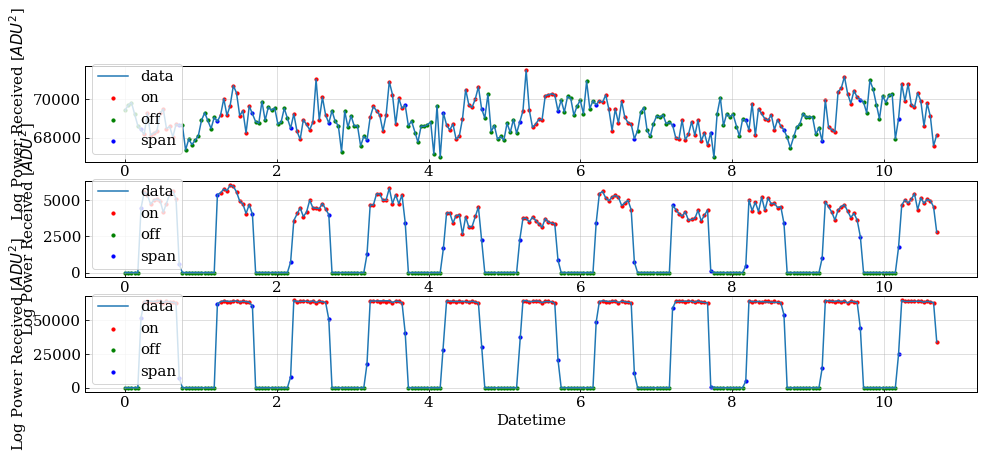

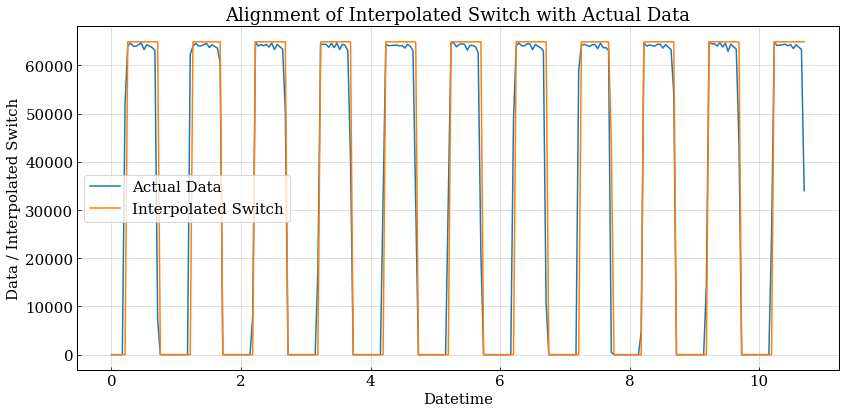

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [482. 135. 143.]
  --> t_deltas = [-0.518 -0.865 -0.857]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.5178000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[5.11520195e-03 1.09608786e-03 1.57405282e-03 1.76738062e-02
 5.69387021e-03 8.08519800e-03 1.05325138e-03 9.46348058e-03
 3.88045916e-03 7.60159667e-04 1.71236956e-02 2.23087887e-03
 3.46073679e-04 9.49203824e-03 6.65731529e-03 1.19404813e-02
 1.44821126e-02 2.45629646e-02 2.86181515e-02 6.02904689e-03
 2.33778219e-02 3.73767089e-03 1.02698586e-02 5.03704416e-03
 6.03092569e-04 3.86618033e-03 6.60207877e-04 1.49390350e-02
 6.23646564e-03 5.50824546e-03 1.09266846e-02 8.09947683e-03
 1.68238402e-02 2.61839872e-02 2.03439469e-02 1.88018336e-02
 1.97299573e-02 8.62102978e-03 1.13892435e

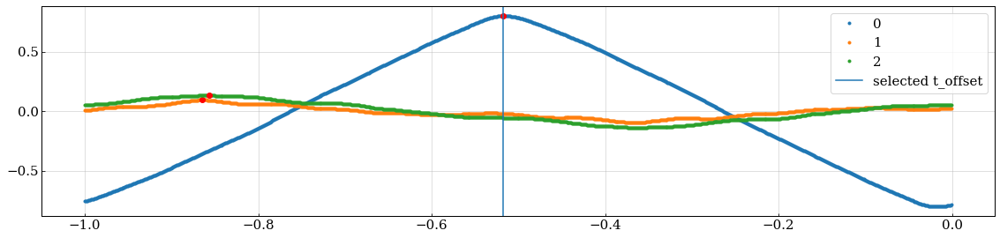

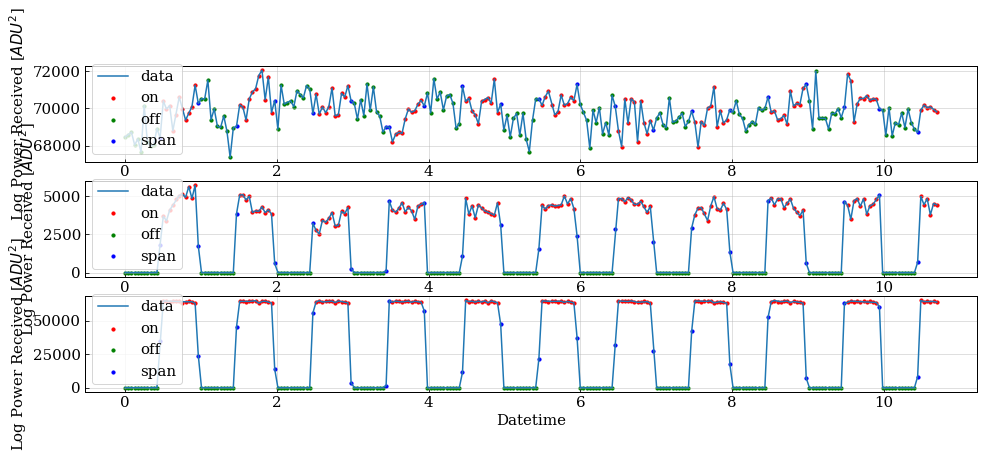

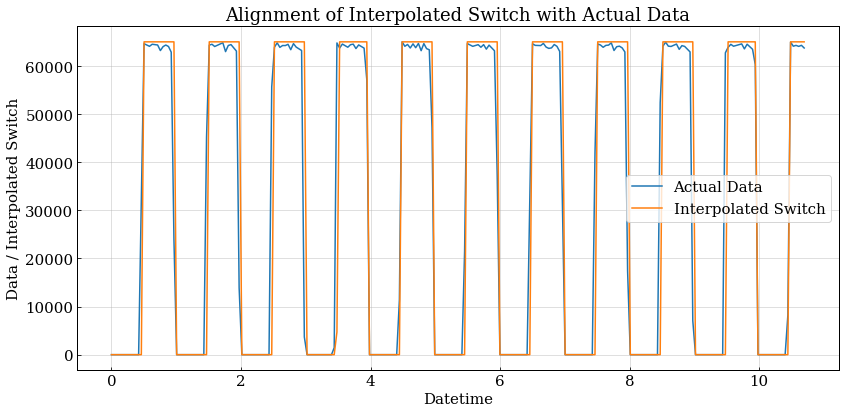

Frequency bin: 292
Maximum Pearson_R Correlations between data and square wave function:
  --> t_indices = [748. 710. 492.]
  --> t_deltas = [-0.252 -0.29  -0.508]
Selecting square wave function time offset:
  --> t_delta_pulse = -0.2518000000
Finding relevant pulsing indices and checking for overlaps:
  --> on/off ind intersection: []
  --> on/span ind intersection: []
  --> off/span ind intersection: []
[8.27378804e-03 4.10462122e-03 1.20939306e-02 4.08549661e-03
 7.81479720e-03 2.24451303e-02 2.37862441e-03 3.32290245e-04
 3.39701034e-03 2.14267443e-02 4.63532939e-03 1.50008726e-02
 1.96911852e-02 1.54885503e-02 7.22671518e-03 1.01384383e-02
 9.99978485e-03 1.48430945e-02 4.44886436e-03 5.62024723e-03
 2.79936602e-03 3.56196018e-04 9.13917702e-03 6.78206780e-03
 1.13911008e-02 6.09836269e-03 2.25431439e-03 9.01008585e-03
 1.75229316e-03 4.60664246e-03 5.99317729e-03 8.12079109e-03
 2.90933257e-03 6.42348121e-03 1.83142127e-02 5.93580344e-03
 3.05922177e-02 1.29784442e-02 9.39735937e

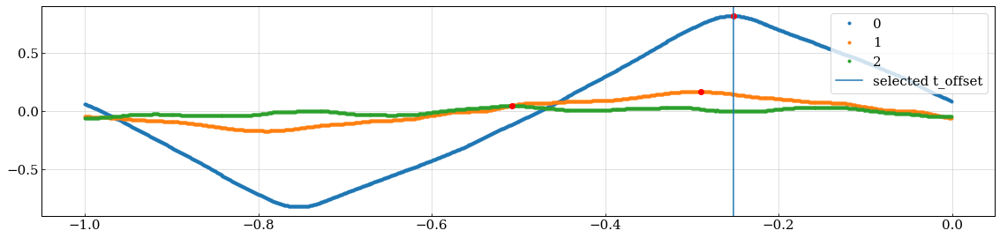

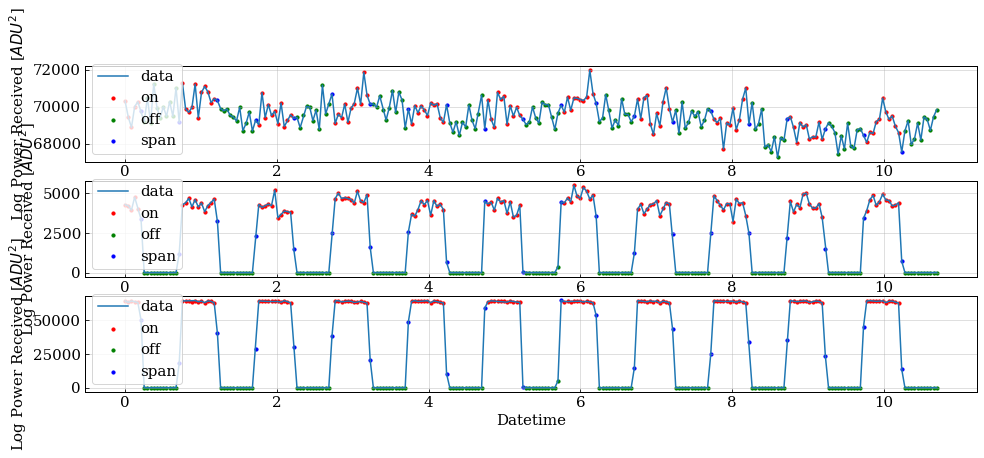

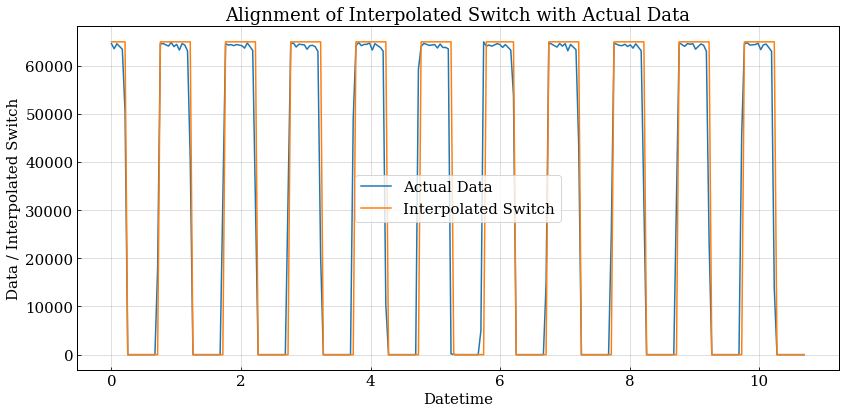

Frequency bin: 292


In [583]:

"""
    Computing statistics for all angles for a given set of frequencies 
    and saving those in .npz files. 
    
    Statistics collected
    --------------------
    avgs: averages of ON data points of individual correlator channels 
    avgs_off: averages of OFF data points of individual correlator channels
    stds: standard deviations of ON data points of individual correlator channels
    var: variances of ON data points of individual correlator channels
    var_off: variances of OFF data points of individual correlator channels 

"""

#freq_arr=[270,280,290,300,305,310]
freq_arr=[292]

for index,f_ind in enumerate(freq_arr):
    avgs0,stds0,avgs_off0,var0,var_off0,on_inds0,off_inds0,span0 = Extract_Source_Pulses(corr_data0,f_ind)
    
    avgs5n,stds5n,avgs_off5n,var5n,var_off5n,on_inds5n,off_inds5n,span5n = Extract_Source_Pulses(corr_data5n,f_ind)
    avgs10n,stds10n,avgs_off10n,var10n,var_off10n,on_inds10n,off_inds10n,span10n = Extract_Source_Pulses(corr_data10n,f_ind)
    avgs15n,stds15n,avgs_off15n,var15n,var_off15n,on_inds15n,off_inds15n,span15n = Extract_Source_Pulses(corr_data15n,f_ind)
    avgs20n,stds20n,avgs_off20n,var20n,var_off20n,on_inds20n,off_inds20n,span20n = Extract_Source_Pulses(corr_data20n,f_ind)
    avgs25n,stds25n,avgs_off25n,var25n,var_off25n,on_inds25n,off_inds25n,span25n = Extract_Source_Pulses(corr_data25n,f_ind)
    avgs30n,stds30n,avgs_off30n,var30n,var_off30n,on_inds30n,off_inds30n,span30n = Extract_Source_Pulses(corr_data30n,f_ind)
    avgs35n,stds35n,avgs_off35n,var35n,var_off35n,on_inds35n,off_inds35n,span35n = Extract_Source_Pulses(corr_data35n,f_ind)
    avgs40n,stds40n,avgs_off40n,var40n,var_off40n,on_inds40n,off_inds40n,span40n = Extract_Source_Pulses(corr_data40n,f_ind)
    avgs45n,stds45n,avgs_off45n,var45n,var_off45n,on_inds45n,off_inds45n,span45n = Extract_Source_Pulses(corr_data45n,f_ind)
    avgs50n,stds50n,avgs_off50n,var50n,var_off50n,on_inds50n,off_inds50n,span50n = Extract_Source_Pulses(corr_data50n,f_ind)
    avgs55n,stds55n,avgs_off55n,var55n,var_off55n,on_inds55n,off_inds55n,span55n = Extract_Source_Pulses(corr_data55n,f_ind)
    avgs60n,stds60n,avgs_off60n,var60n,var_off60n,on_inds60n,off_inds60n,span60n = Extract_Source_Pulses(corr_data60n,f_ind)
    avgs65n,stds65n,avgs_off65n,var65n,var_off65n,on_inds65n,off_inds65n,span65n = Extract_Source_Pulses(corr_data65n,f_ind)
    avgs70n,stds70n,avgs_off70n,var70n,var_off70n,on_inds70n,off_inds70n,span70n = Extract_Source_Pulses(corr_data70n,f_ind)
    avgs75n,stds75n,avgs_off75n,var75n,var_off75n,on_inds75n,off_inds75n,span75n = Extract_Source_Pulses(corr_data75n,f_ind)
    avgs80n,stds80n,avgs_off80n,var80n,var_off80n,on_inds80n,off_inds80n,span80n = Extract_Source_Pulses(corr_data80n,f_ind)
    avgs85n,stds85n,avgs_off85n,var85n,var_off85n,on_inds85n,off_inds85n,span85n = Extract_Source_Pulses(corr_data85n,f_ind)
    avgs90n,stds90n,avgs_off90n,var90n,var_off90n,on_inds90n,off_inds90n,span90n = Extract_Source_Pulses(corr_data90n,f_ind)
    avgs95n,stds95n,avgs_off95n,var95n,var_off95n,on_inds95n,off_inds95n,span95n = Extract_Source_Pulses(corr_data95n,f_ind)
    avgs100n,stds100n,avgs_off100n,var100n,var_off100n,on_inds100n,off_inds100n,span100n = Extract_Source_Pulses(corr_data100n,f_ind)
    avgs105n,stds105n,avgs_off105n,var105n,var_off105n,on_inds105n,off_inds105n,span105n = Extract_Source_Pulses(corr_data105n,f_ind)
    avgs110n,stds110n,avgs_off110n,var110n,var_off110n,on_inds110n,off_inds110n,span110n = Extract_Source_Pulses(corr_data110n,f_ind)
    avgs115n,stds115n,avgs_off115n,var115n,var_off115n,on_inds115n,off_inds115n,span115n = Extract_Source_Pulses(corr_data115n,f_ind)
    avgs120n,stds120n,avgs_off120n,var120n,var_off120n,on_inds120n,off_inds120n,span120n = Extract_Source_Pulses(corr_data120n,f_ind)
    avgs125n,stds125n,avgs_off125n,var125n,var_off125n,on_inds125n,off_inds125n,span125n = Extract_Source_Pulses(corr_data125n,f_ind)
    avgs130n,stds130n,avgs_off130n,var130n,var_off130n,on_inds130n,off_inds130n,span130n = Extract_Source_Pulses(corr_data130n,f_ind)
    #avgs135n,stds135n,avgs_off135n,var135n, var_off135n,on_inds135n,off_inds135n,span135n = Extract_Source_Pulses(corr_data140n,f_ind)

    avgs5p,stds5p,avgs_off5p,var5p,var_off5p,on_inds5p,off_inds5p,span5p = Extract_Source_Pulses(corr_data5p,f_ind)
    avgs10p,stds10p,avgs_off10p,var10p,var_off10p,on_inds10p,off_inds10p,span10p = Extract_Source_Pulses(corr_data10p,f_ind)
    avgs15p,stds15p,avgs_off15p,var15p,var_off15p,on_inds15p,off_inds15p,span15p = Extract_Source_Pulses(corr_data15p,f_ind)
    avgs20p,stds20p,avgs_off20p,var20p,var_off20p,on_inds20p,off_inds20p,span20p = Extract_Source_Pulses(corr_data20p,f_ind)
    avgs25p,stds25p,avgs_off25p,var25p,var_off25p,on_inds25p,off_inds25p,span25p = Extract_Source_Pulses(corr_data25p,f_ind)
    avgs30p,stds30p,avgs_off30p,var30p,var_off30p,on_inds30p,off_inds30p,span30p = Extract_Source_Pulses(corr_data30p,f_ind)
    avgs35p,stds35p,avgs_off35p,var35p,var_off35p,on_inds35p,off_inds35p,span35p = Extract_Source_Pulses(corr_data35p,f_ind)
    avgs40p,stds40p,avgs_off40p,var40p,var_off40p,on_inds40p,off_inds40p,span40p = Extract_Source_Pulses(corr_data40p,f_ind)
    avgs45p,stds45p,avgs_off45p,var45p,var_off45p,on_inds45p,off_inds45p,span45p = Extract_Source_Pulses(corr_data45p,f_ind)
    avgs50p,stds50p,avgs_off50p,var50p,var_off50p,on_inds50p,off_inds50p,span50p = Extract_Source_Pulses(corr_data50p,f_ind)
    avgs55p,stds55p,avgs_off55p,var55p,var_off55p,on_inds55p,off_inds55p,span55p = Extract_Source_Pulses(corr_data55p,f_ind)
    avgs60p,stds60p,avgs_off60p,var60p,var_off60p,on_inds60p,off_inds60p,span60p = Extract_Source_Pulses(corr_data60p,f_ind)
    avgs65p,stds65p,avgs_off65p,var65p,var_off65p,on_inds65p,off_inds65p,span65p = Extract_Source_Pulses(corr_data65p,f_ind)
    avgs70p,stds70p,avgs_off70p,var70p,var_off70p,on_inds70p,off_inds70p,span70p = Extract_Source_Pulses(corr_data70p,f_ind)
    avgs75p,stds75p,avgs_off75p,var75p,var_off75p,on_inds75p,off_inds75p,span75p = Extract_Source_Pulses(corr_data75p,f_ind)
    avgs80p,stds80p,avgs_off80p,var80p,var_off80p,on_inds80p,off_inds80p,span80p = Extract_Source_Pulses(corr_data80p,f_ind)
    avgs85p,stds85p,avgs_off85p,var85p,var_off85p,on_inds85p,off_inds85p,span85p = Extract_Source_Pulses(corr_data85p,f_ind)
    avgs90p,stds90p,avgs_off90p,var90p,var_off90p,on_inds90p,off_inds90p,span90p = Extract_Source_Pulses(corr_data90p,f_ind)
    avgs95p,stds95p,avgs_off95p,var95p,var_off95p,on_inds95p,off_inds95p,span95p = Extract_Source_Pulses(corr_data95p,f_ind)
    avgs100p,stds100p,avgs_off100p,var100p,var_off100p,on_inds100p,off_inds100p,span100p = Extract_Source_Pulses(corr_data100p,f_ind)
    avgs105p,stds105p,avgs_off105p,var105p,var_off105p,on_inds105p,off_inds105p,span105p = Extract_Source_Pulses(corr_data105p,f_ind)
    avgs110p,stds110p,avgs_off110p,var110p,var_off110p,on_inds110p,off_inds110p,span110p = Extract_Source_Pulses(corr_data110p,f_ind)
    avgs115p,stds115p,avgs_off115p,var115p,var_off115p,on_inds115p,off_inds115p,span115p = Extract_Source_Pulses(corr_data115p,f_ind)
    avgs120p,stds120p,avgs_off120p,var120p,var_off120p,on_inds120p,off_inds120p,span120p = Extract_Source_Pulses(corr_data120p,f_ind)
    avgs125p,stds125p,avgs_off125p,var125p,var_off125p,on_inds125p,off_inds125p,span125p = Extract_Source_Pulses(corr_data125p,f_ind)
    avgs130p,stds130p,avgs_off130p,var130p,var_off130p,on_inds130p,off_inds130p,span130p = Extract_Source_Pulses(corr_data130p,f_ind)
    #avgs135p,stds135p,avgs_off135p,var135p,var_off135p,on_inds135p,off_inds135p,span135p = Extract_Source_Pulses(corr_data135p,f_ind)
    #avgs140p,stds140p,avgs_off140p,var140p,var_off140p,on_inds140p,off_inds140p,span140p = Extract_Source_Pulses(corr_data140p)

    #Saving avgs, std dev and varinces into .npz file (steps of 5 degrees) (range -130 to +130 degrees)

    np.savez("/Users/kalyanibhopi94/Documents/kalyanib_dns/corr_dns_plots/drone_testing_4x2_Apr2025/Apr11...307Z/stats_clean_indices/means_fbin{}.npz".format(f_ind),avgs0=avgs0,\
            avgs5n=avgs5n, avgs10n=avgs10n, avgs15n=avgs15n, avgs20n=avgs20n, avgs25n=avgs25n, avgs30n=avgs30n, avgs35n=avgs35n, \
            avgs40n=avgs40n, avgs45n=avgs45n, avgs50n=avgs50n, avgs55n=avgs55n, avgs60n=avgs60n, avgs65n=avgs65n, avgs70n=avgs70n, \
            avgs75n=avgs75n, avgs80n=avgs80n, avgs85n=avgs85n, avgs90n=avgs90n, avgs95n=avgs95n, avgs100n=avgs100n, avgs105n=avgs105n, \
            avgs110n=avgs110n, avgs115n=avgs115n, avgs120n=avgs120n, avgs125n=avgs125n, avgs130n=avgs130n, avgs5p=avgs5p, avgs10p=avgs10p, avgs15p=avgs15p, \
            avgs20p=avgs20p, avgs25p=avgs25p, avgs30p=avgs30p, avgs35p=avgs35p, avgs40p=avgs40p, avgs45p=avgs45p, avgs50p=avgs50p, \
            avgs55p=avgs55p, avgs60p=avgs60p, avgs65p=avgs65p, avgs70p=avgs70p, avgs75p=avgs75p, avgs80p=avgs80p, avgs85p=avgs85p, \
            avgs90p=avgs90p, avgs95p=avgs95p, avgs100p=avgs100p, avgs105p=avgs105p, avgs110p=avgs110p, avgs115p=avgs115p, avgs120p=avgs120p, \
            avgs125p=avgs125p, avgs130p=avgs130p)

    np.savez("/Users/kalyanibhopi94/Documents/kalyanib_dns/corr_dns_plots/drone_testing_4x2_Apr2025/Apr11...307Z/stats_clean_indices/stds_fbin{}.npz".format(f_ind), stds0=stds0, \
            stds5n=stds5n, stds10n=stds10n, stds15n=stds15n, stds20n=stds20n, stds25n=stds25n, stds30n=stds30n, stds35n=stds35n, \
            stds40n=stds40n, stds45n=stds45n, stds50n=stds50n, stds55n=stds55n, stds60n=stds60n, stds65n=stds65n, stds70n=stds70n, \
            stds75n=stds75n, stds80n=stds80n, stds85n=stds85n, stds90n=stds90n, stds95n=stds95n, stds100n=stds100n, stds105n=stds105n, \
            stds110n=stds110n, stds115n=stds115n, stds120n=stds120n, stds125n=stds125n, stds130n=stds130n, stds5p=stds5p, stds10p=stds10p, \
            stds15p=stds15p, stds20p=stds20p, stds25p=stds25p, stds30p=stds30p, stds35p=stds35p, stds40p=stds40p, stds45p=stds45p, \
            stds50p=stds50p, stds55p=stds55p, stds60p=stds60p, stds65p=stds65p, stds70p=stds70p, stds75p=stds75p, stds80p=stds80p, \
            stds85p=stds85p, stds90p=stds90p, stds95p=stds95p, stds100p=stds100p, stds105p=stds105p, stds110p=stds110p, stds115p=stds115p, \
            stds120p=stds120p, stds125p=stds125p, stds130p=stds130p)

    np.savez("/Users/kalyanibhopi94/Documents/kalyanib_dns/corr_dns_plots/drone_testing_4x2_Apr2025/Apr11...307Z/stats_clean_indices/means_off_fbin{}.npz".format(f_ind), \
            avgs_off0=avgs_off0, avgs_off5n=avgs_off5n, avgs_off10n=avgs_off10n, avgs_off15n=avgs_off15n, avgs_off20n=avgs_off20n, \
            avgs_off25n=avgs_off25n, avgs_off30n=avgs_off30n, avgs_off35n=avgs_off35n, avgs_off40n=avgs_off40n, avgs_off45n=avgs_off45n, \
            avgs_off50n=avgs_off50n, avgs_off55n=avgs_off55n, avgs_off60n=avgs_off60n, avgs_off65n=avgs_off65n, avgs_off70n=avgs_off70n, \
            avgs_off75n=avgs_off75n, avgs_off80n=avgs_off80n, avgs_off85n=avgs_off85n, avgs_off90n=avgs_off90n, avgs_off95n=avgs_off95n, \
            avgs_off100n=avgs_off100n, avgs_off105n=avgs_off105n, avgs_off110n=avgs_off110n, avgs_off115n=avgs_off115n, avgs_off120n=avgs_off120n, \
            avgs_off125n=avgs_off125n, avgs_off130n=avgs_off130n, avgs_off5p=avgs_off5p, avgs_off10p=avgs_off10p, avgs_off15p=avgs_off15p, \
            avgs_off20p=avgs_off20p, avgs_off25p=avgs_off25p, avgs_off30p=avgs_off30p, avgs_off35p=avgs_off35p, avgs_off40p=avgs_off40p, \
            avgs_off45p=avgs_off45p, avgs_off50p=avgs_off50p, avgs_off55p=avgs_off55p, avgs_off60p=avgs_off60p, avgs_off65p=avgs_off65p, \
            avgs_off70p=avgs_off70p, avgs_off75p=avgs_off75p, avgs_off80p=avgs_off80p, avgs_off85p=avgs_off85p, avgs_off90p=avgs_off90p, \
            avgs_off95p=avgs_off95p, avgs_off100p=avgs_off100p, avgs_off105p=avgs_off105p, avgs_off110p=avgs_off110p, avgs_off115p=avgs_off115p, \
            avgs_off120p=avgs_off120p, avgs_off125p=avgs_off125p, avgs_off130p=avgs_off130p)

    np.savez("/Users/kalyanibhopi94/Documents/kalyanib_dns/corr_dns_plots/drone_testing_4x2_Apr2025/Apr11...307Z/stats_clean_indices/var_fbin{}.npz".format(f_ind), var0=var0, \
            var5n=var5n, var10n=var10n,var15n=var15n, var20n=var20n, var25n=var25n, var30n=var30n, var35n=var35n, var40n=var40n, \
            var45n=var45n, var50n=var50n, var55n=var55n, var60n=var60n, var65n=var65n, var70n=var70n, var75n=var75n, var80n=var80n, \
            var85n=var85n, var90n=var90n, var95n=var95n, var100n=var100n, var105n=var105n, var110n=var110n, var115n=var115n, \
            var120n=var120n, var125n=var125n, var130n=var130n, var5p=var5p, var10p=var10p, var15p=var15p, var20p=var20p, \
            var25p=var25p, var30p=var30p, var35p=var35p, var40p=var40p, var45p=var45p, var50p=var50p, var55p=var55p, var60p=var60p, \
            var65p=var65p, var70p=var70p, var75p=var75p, var80p=var80p, var85p=var85p, var90p=var90p, var95p=var95p, var100p=var100p, \
            var105p=var105p, var110p=var110p, var115p=var115p, var120p=var120p, var125p=var125p, var130p=var130p)

    np.savez("/Users/kalyanibhopi94/Documents/kalyanib_dns/corr_dns_plots/drone_testing_4x2_Apr2025/Apr11...307Z/stats_clean_indices/var_off_fbin{}.npz".format(f_ind), \
            var_off0=var_off0, var_off5n=var_off5n, var_off10n=var_off10n, var_off15n=var_off15n, var_off20n=var_off20n, var_off25n=var_off25n, \
            var_off30n=var_off30n, var_off35n=var_off35n, var_off40n=var_off40n, var_off45n=var_off45n, var_off50n=var_off50n, \
            var_off55n=var_off55n, var_off60n=var_off60n, var_off65n=var_off65n, var_off70n=var_off70n, var_off75n=var_off75n, var_off80n=var_off80n, \
            var_off85n=var_off85n, var_off90n=var_off90n, var_off95n=var_off95n, var_off100n=var100n, var_off105n=var_off105n, \
            var_off110n=var_off110n, var_off115n=var_off115n, var_off120n=var_off120n, var_off125n=var_off125n, var_off130n=var_off130n, \
            var_off5p=var_off5p, var_off10p=var_off10p, var_off15p=var_off15p, var_off20p=var_off20p, var_off25p=var_off25p, \
            var_off30p=var_off30p, var_off35p=var_off35p, var_off40p=var_off40p, var_off45p=var_off45p, var_off50p=var_off50p, \
            var_off55p=var_off55p, var_off60p=var_off60p, var_off65p=var_off65p, var_off70p=var_off70p, var_off75p=var_off75p, var_off80p=var_off80p, \
            var_off85p=var_off85p, var_off90p=var_off90p, var_off95p=var_off95p, var_off100p=var_off100p, var_off105p=var_off105p, var_off110p=var_off110p, \
            var_off115p=var_off115p, var_off120p=var_off120p, var_off125p=var_off125p, var_off130p=var_off130p)


    #Saving on indices, off indices and span of indices into .npz file (steps of 5 degrees) (range -130 to +130p degrees):

    np.savez("/Users/kalyanibhopi94/Documents/kalyanib_dns/corr_dns_plots/drone_testing_4x2_Apr2025/Apr11...307Z/stats_clean_indices/inds_on_fbin{}.npz".format(f_ind), \
            on_inds0=on_inds0, on_inds5n=on_inds5n, on_inds10n=on_inds10n, on_inds15n=on_inds15n, on_inds20n=on_inds20n, \
            on_inds25n=on_inds25n, on_inds30n=on_inds30n, on_inds35n=on_inds35n, on_inds40n=on_inds40n, on_inds45n=on_inds45n, \
            on_inds50n=on_inds50n, on_inds55n=on_inds55n, on_inds60n=on_inds60n, on_inds65n=on_inds65n, on_inds70n=on_inds70n, \
            on_inds75n=on_inds75n, on_inds80n=on_inds80n, on_inds85n=on_inds85n, on_inds90n=on_inds90n, on_inds95n=on_inds95n, \
            on_inds100n=on_inds100n, on_inds105n=on_inds105n, on_inds110n=on_inds110n, on_inds115n=on_inds115n, on_inds120n=on_inds120n, \
            on_inds125n=on_inds125n, on_inds130n=on_inds130n, on_inds5p=on_inds5p, on_inds10p=on_inds10p, on_inds15p=on_inds15p, \
            on_inds20p=on_inds20p, on_inds25p=on_inds25p, on_inds30p=on_inds30p, on_inds35p=on_inds35p, on_inds40p=on_inds40p, \
            on_inds45p=on_inds45p, on_inds50p=on_inds50p, on_inds55p=on_inds55p, on_inds60p=on_inds60p, on_inds65p=on_inds65p, \
            on_inds70p=on_inds70p, on_inds75p=on_inds75p, on_inds80p=on_inds80p, on_inds85p=on_inds85p, on_inds90p=on_inds90p, \
            on_inds95p=on_inds95p, on_inds100p=on_inds100p, on_inds105p=on_inds105p, on_inds110p=on_inds110p, on_inds115p=on_inds115p, \
            on_inds120p=on_inds120p, on_inds125p=on_inds125p, on_inds130p=on_inds130p)

    np.savez("/Users/kalyanibhopi94/Documents/kalyanib_dns/corr_dns_plots/drone_testing_4x2_Apr2025/Apr11...307Z/stats_clean_indices/inds_off_fbin{}.npz".format(f_ind), \
            off_inds0=off_inds0, off_inds5n=off_inds5n, off_inds10n=off_inds10n, off_inds15n=off_inds15n, off_inds20n=off_inds20n, \
            off_inds25n=off_inds25n, off_inds30n=off_inds30n, off_inds35n=off_inds35n, off_inds40n=off_inds40n, off_inds45n=off_inds45n, \
            off_inds50n=off_inds50n, off_inds55n=off_inds55n, off_inds60n=off_inds60n, off_inds65n=off_inds65n, off_inds70n=off_inds70n, \
            off_inds75n=off_inds75n, off_inds80n=off_inds80n, off_inds85n=off_inds85n, off_inds90n=off_inds90n, off_inds95n=off_inds95n, \
            off_inds100n=off_inds100n, off_inds105n=off_inds105n, off_inds110n=off_inds110n, off_inds115n=off_inds115n, \
            off_inds120n=off_inds120n, off_inds125n=off_inds125n, off_inds130n=off_inds130n, \
            off_inds5p=off_inds5p, off_inds10p=off_inds10p, off_inds15p=off_inds15p, off_inds20p=off_inds20p, off_inds25p=off_inds25p, \
            off_inds30p=off_inds30p, off_inds35p=off_inds35p, off_inds40p=off_inds40p, off_inds45p=off_inds45p, off_inds50p=off_inds50p, \
            off_inds55p=off_inds55p, off_inds60p=off_inds60p, off_inds65p=off_inds65p, off_inds70p=off_inds70p, off_inds75p=off_inds75p, \
            off_inds80p=off_inds80p, off_inds85p=off_inds85p, off_inds90p=off_inds90p, off_inds95p=off_inds95p, off_inds100p=off_inds100p, \
            off_inds105p=off_inds105p, off_inds110p=off_inds110p, off_inds115p=off_inds115p, off_inds120p=off_inds120p, \
            off_inds125p=off_inds125p, off_inds130p=off_inds130p)

    np.savez("/Users/kalyanibhopi94/Documents/kalyanib_dns/corr_dns_plots/drone_testing_4x2_Apr2025/Apr11...307Z/stats_clean_indices/inds_span_fbin{}.npz".format(f_ind), \
            span0=span0, span5n=span5n, span10n=span10n, span15n=span15n, span20n=span20n, span25n=span25n, span30n=span30n, \
            span35n=span35n, span40n=span40n, span45n=span45n, span50n=span50n, span55n=span55n, span60n=span60n, span65n=span65n, \
            span70n=span70n, span75n=span75n, span80n=span80n, span85n=span85n, span90n=span90n, span95n=span95n, span100n=span100n, \
            span105n=span105n, span110n=span110n, span115n=span115n, span120n=span120n, span125n=span125n, span130n=span130n, \
            span5p=span5p, span10p=span10p, span15p=span15p, span20p=span20p, span25p=span25p, span30p=span30p, span35p=span35p, \
            span40p=span40p, span45p=span45p, span50p=span50p, span55p=span55p, span60p=span60p, span65p=span65p, span70p=span70p, \
            span75p=span75p, span80p=span80p, span85p=span85p, span90p=span90p, span95p=span95p, span100p=span100p, span105p=span105p, \
            span110p=span110p, span115p=span115p, span120p=span120p, span125p=span125p, span130p=span130p)

    

In [ ]:

"""
    Computing statistics for all angles manually and single frequency at a time
    and saving those in .npz files. 
    
    Statistics collected
    --------------------
    avgs: averages of ON data points of individual correlator channels 
    avgs_off: averages of OFF data points of individual correlator channels
    stds: standard deviations of ON data points of individual correlator channels
    var: variances of ON data points of individual correlator channels
    var_off: variances of OFF data points of individual correlator channels 

"""
f_ind = 850
avgs0,stds0,avgs_off0,var0,var_off0,on_inds0,off_inds0,span0 = Extract_Source_Pulses(corr_data0,f_ind)
avgs5n,stds5n,avgs_off5n,var5n,var_off5n,on_inds5n,off_inds5n,span5n = Extract_Source_Pulses(corr_data5n,f_ind)
avgs10n,stds10n,avgs_off10n,var10n,var_off10n,on_inds10n,off_inds10n,span10n = Extract_Source_Pulses(corr_data10n,f_ind)
avgs15n,stds15n,avgs_off15n,var15n,var_off15n,on_inds15n,off_inds15n,span15n = Extract_Source_Pulses(corr_data15n,f_ind)
avgs20n,stds20n,avgs_off20n,var20n,var_off20n,on_inds20n,off_inds20n,span20n = Extract_Source_Pulses(corr_data20n,f_ind)
avgs25n,stds25n,avgs_off25n,var25n,var_off25n,on_inds25n,off_inds25n,span25n = Extract_Source_Pulses(corr_data25n,f_ind)
avgs30n,stds30n,avgs_off30n,var30n,var_off30n,on_inds30n,off_inds30n,span30n = Extract_Source_Pulses(corr_data30n,f_ind)
avgs35n,stds35n,avgs_off35n,var35n,var_off35n,on_inds35n,off_inds35n,span35n = Extract_Source_Pulses(corr_data35n,f_ind)
avgs40n,stds40n,avgs_off40n,var40n,var_off40n,on_inds40n,off_inds40n,span40n = Extract_Source_Pulses(corr_data40n,f_ind)
avgs45n,stds45n,avgs_off45n,var45n,var_off45n,on_inds45n,off_inds45n,span45n = Extract_Source_Pulses(corr_data45n,f_ind)
avgs50n,stds50n,avgs_off50n,var50n,var_off50n,on_inds50n,off_inds50n,span50n = Extract_Source_Pulses(corr_data50n,f_ind)
#avgs55n,stds55n,avgs_off55n,var55n,var_off55n,on_inds55n,off_inds55n,span55n = Extract_Source_Pulses(corr_data55n)
#avgs60n,stds60n,avgs_off60n,var60n,var_off60n,on_inds60n,off_inds60n,span60n = Extract_Source_Pulses(corr_data60n)
#avgs65n,stds65n,avgs_off65n,var65n,var_off65n,on_inds65n,off_inds65n,span65n = Extract_Source_Pulses(corr_data65n)
#avgs70n,stds70n,avgs_off70n,var70n,var_off70n,on_inds70n,off_inds70n,span70n = Extract_Source_Pulses(corr_data70n)
#avgs75n,stds75n,avgs_off75n,var75n,var_off75n,on_inds75n,off_inds75n,span75n = Extract_Source_Pulses(corr_data75n)
#avgs80n,stds80n,avgs_off80n,var80n,var_off80n,on_inds80n,off_inds80n,span80n = Extract_Source_Pulses(corr_data80n)
#avgs85n,stds85n,avgs_off85n,var85n,var_off85n,on_inds85n,off_inds85n,span85n = Extract_Source_Pulses(corr_data85n)
#avgs90n,stds90n,avgs_off90n,var90n,var_off90n,on_inds90n,off_inds90n,span90n = Extract_Source_Pulses(corr_data90n)
#avgs95n,stds95n,avgs_off95n,var95n,var_off95n,on_inds95n,off_inds95n,span95n = Extract_Source_Pulses(corr_data95n)
#avgs100n,stds100n,avgs_off100n,var100n,var_off100n,on_inds100n,off_inds100n,span100n = Extract_Source_Pulses(corr_data100n)
#avgs105n,stds105n,avgs_off105n,var105n,var_off105n,on_inds105n,off_inds105n,span105n = Extract_Source_Pulses(corr_data105n)
#avgs110n,stds110n,avgs_off110n,var110n,var_off110n,on_inds110n,off_inds110n,span110n = Extract_Source_Pulses(corr_data110n)
#avgs115n,stds115n,avgs_off115n,var115n,var_off115n,on_inds115n,off_inds115n,span115n = Extract_Source_Pulses(corr_data115n)
#avgs120n,stds120n,avgs_off120n,var120n,var_off120n,on_inds120n,off_inds120n,span120n = Extract_Source_Pulses(corr_data120n)
#avgs125n,stds125n,avgs_off125n,var125n,var_off125n,on_inds125n,off_inds125n,span125n = Extract_Source_Pulses(corr_data125n)
#avgs130n,stds130n,avgs_off130n,var130n,var_off130n,on_inds130n,off_inds130n,span130n = Extract_Source_Pulses(corr_data130n)
#avgs140n,stds140n,avgs_off140n,var140n, var_off140n,on_inds140n,off_inds140n,span140n = Extract_Source_Pulses(corr_data140n)

avgs5p,stds5p,avgs_off5p,var5p,var_off5p,on_inds5p,off_inds5p,span5p = Extract_Source_Pulses(corr_data5p,f_ind)
avgs10p,stds10p,avgs_off10p,var10p,var_off10p,on_inds10p,off_inds10p,span10p = Extract_Source_Pulses(corr_data10p,f_ind)
avgs15p,stds15p,avgs_off15p,var15p,var_off15p,on_inds15p,off_inds15p,span15p = Extract_Source_Pulses(corr_data15p,f_ind)
avgs20p,stds20p,avgs_off20p,var20p,var_off20p,on_inds20p,off_inds20p,span20p = Extract_Source_Pulses(corr_data20p,f_ind)
avgs25p,stds25p,avgs_off25p,var25p,var_off25p,on_inds25p,off_inds25p,span25p = Extract_Source_Pulses(corr_data25p,f_ind)
avgs30p,stds30p,avgs_off30p,var30p,var_off30p,on_inds30p,off_inds30p,span30p = Extract_Source_Pulses(corr_data30p,f_ind)
avgs35p,stds35p,avgs_off35p,var35p,var_off35p,on_inds35p,off_inds35p,span35p = Extract_Source_Pulses(corr_data35p,f_ind)
avgs40p,stds40p,avgs_off40p,var40p,var_off40p,on_inds40p,off_inds40p,span40p = Extract_Source_Pulses(corr_data40p,f_ind)
avgs45p,stds45p,avgs_off45p,var45p,var_off45p,on_inds45p,off_inds45p,span45p = Extract_Source_Pulses(corr_data45p,f_ind)
avgs50p,stds50p,avgs_off50p,var50p,var_off50p,on_inds50p,off_inds50p,span50p = Extract_Source_Pulses(corr_data50p,f_ind)
avgs55p,stds55p,avgs_off55p,var55p,var_off55p,on_inds55p,off_inds55p,span55p = Extract_Source_Pulses(corr_data55p,f_ind)
avgs60p,stds60p,avgs_off60p,var60p,var_off60p,on_inds60p,off_inds60p,span60p = Extract_Source_Pulses(corr_data60p,f_ind)
avgs65p,stds65p,avgs_off65p,var65p,var_off65p,on_inds65p,off_inds65p,span65p = Extract_Source_Pulses(corr_data65p,f_ind)
avgs70p,stds70p,avgs_off70p,var70p,var_off70p,on_inds70p,off_inds70p,span70p = Extract_Source_Pulses(corr_data70p,f_ind)
avgs75p,stds75p,avgs_off75p,var75p,var_off75p,on_inds75p,off_inds75p,span75p = Extract_Source_Pulses(corr_data75p,f_ind)
avgs80p,stds80p,avgs_off80p,var80p,var_off80p,on_inds80p,off_inds80p,span80p = Extract_Source_Pulses(corr_data80p,f_ind)
avgs85p,stds85p,avgs_off85p,var85p,var_off85p,on_inds85p,off_inds85p,span85p = Extract_Source_Pulses(corr_data85p,f_ind)
avgs90p,stds90p,avgs_off90p,var90p,var_off90p,on_inds90p,off_inds90p,span90p = Extract_Source_Pulses(corr_data90p,f_ind)
avgs95p,stds95p,avgs_off95p,var95p,var_off95p,on_inds95p,off_inds95p,span95p = Extract_Source_Pulses(corr_data95p,f_ind)
avgs100p,stds100p,avgs_off100p,var100p,var_off100p,on_inds100p,off_inds100p,span100p = Extract_Source_Pulses(corr_data100p,f_ind)
avgs105p,stds105p,avgs_off105p,var105p,var_off105p,on_inds105p,off_inds105p,span105p = Extract_Source_Pulses(corr_data105p,f_ind)
avgs110p,stds110p,avgs_off110p,var110p,var_off110p,on_inds110p,off_inds110p,span110p = Extract_Source_Pulses(corr_data110p,f_ind)
avgs115p,stds115p,avgs_off115p,var115p,var_off115p,on_inds115p,off_inds115p,span115p = Extract_Source_Pulses(corr_data115p,f_ind)
avgs120p,stds120p,avgs_off120p,var120p,var_off120p,on_inds120p,off_inds120p,span120p = Extract_Source_Pulses(corr_data120p,f_ind)
avgs125p,stds125p,avgs_off125p,var125p,var_off125p,on_inds125p,off_inds125p,span125p = Extract_Source_Pulses(corr_data125p,f_ind)
avgs130p,stds130p,avgs_off130p,var130p,var_off130p,on_inds130p,off_inds130p,span130p = Extract_Source_Pulses(corr_data130p,f_ind)
avgs135p,stds135p,avgs_off135p,var135p,var_off135p,on_inds135p,off_inds135p,span135p = Extract_Source_Pulses(corr_data135p,f_ind)
#avgs140p,stds140p,avgs_off140p,var140p,var_off140p,on_inds140p,off_inds140p,span140p = Extract_Source_Pulses(corr_data140p)


In [ ]:
#Saving avgs, std dev and varinces into .npz file (steps of 5 degrees)(range -50 to +135 degrees):

np.savez("/Users/kalyanibhopi94/Documents/kalyanib_dns/corr_dns_plots/034Z...Mar192025/stats/means_fbin850.npz",avgs0=avgs0,\
        avgs5n=avgs5n, avgs10n=avgs10n, avgs15n=avgs15n, avgs20n=avgs20n, avgs25n=avgs25n, avgs30n=avgs30n, avgs35n=avgs35n, \
        avgs40n=avgs40n, avgs45n=avgs45n, avgs50n=avgs50n, avgs5p=avgs5p, avgs10p=avgs10p, avgs15p=avgs15p, \
        avgs20p=avgs20p, avgs25p=avgs25p, avgs30p=avgs30p, avgs35p=avgs35p, avgs40p=avgs40p, avgs45p=avgs45p, avgs50p=avgs50p, \
        avgs55p=avgs55p, avgs60p=avgs60p, avgs65p=avgs65p, avgs70p=avgs70p, avgs75p=avgs75p, avgs80p=avgs80p, avgs85p=avgs85p, \
        avgs90p=avgs90p, avgs95p=avgs95p, avgs100p=avgs100p, avgs105p=avgs105p, avgs110p=avgs110p, avgs115p=avgs115p, avgs120p=avgs120p, \
        avgs125p=avgs125p, avgs130p=avgs130p, avgs135p=avgs135p)

np.savez("/Users/kalyanibhopi94/Documents/kalyanib_dns/corr_dns_plots/034Z...Mar192025/stats/stds_fbin850.npz", stds0=stds0, \
        stds5n=stds5n, stds10n=stds10n, stds15n=stds15n, stds20n=stds20n, stds25n=stds25n, stds30n=stds30n, stds35n=stds35n, \
        stds40n=stds40n, stds45n=stds45n, stds50n=stds50n, stds5p=stds5p, stds10p=stds10p, \
        stds15p=stds15p, stds20p=stds20p, stds25p=stds25p, stds30p=stds30p, stds35p=stds35p, stds40p=stds40p, stds45p=stds45p, \
        stds50p=stds50p, stds55p=stds55p, stds60p=stds60p, stds65p=stds65p, stds70p=stds70p, stds75p=stds75p, stds80p=stds80p, \
        stds85p=stds85p, stds90p=stds90p, stds95p=stds95p, stds100p=stds100p, stds105p=stds105p, stds110p=stds110p, stds115p=stds115p, \
        stds120p=stds120p, stds125p=stds125p, stds130p=stds130p, stds135p=stds135p)

np.savez("/Users/kalyanibhopi94/Documents/kalyanib_dns/corr_dns_plots/034Z...Mar192025/stats/means_off_fbin850.npz", \
        avgs_off0=avgs_off0, avgs_off5n=avgs_off5n, avgs_off10n=avgs_off10n, avgs_off15n=avgs_off15n, avgs_off20n=avgs_off20n, \
        avgs_off25n=avgs_off25n, avgs_off30n=avgs_off30n, avgs_off35n=avgs_off35n, avgs_off40n=avgs_off40n, avgs_off45n=avgs_off45n, \
        avgs_off50n=avgs_off50n, avgs_off5p=avgs_off5p, avgs_off10p=avgs_off10p, avgs_off15p=avgs_off15p, \
        avgs_off20p=avgs_off20p, avgs_off25p=avgs_off25p, avgs_off30p=avgs_off30p, avgs_off35p=avgs_off35p, avgs_off40p=avgs_off40p, \
        avgs_off45p=avgs_off45p, avgs_off50p=avgs_off50p, avgs_off55p=avgs_off55p, avgs_off60p=avgs_off60p, avgs_off65p=avgs_off65p, \
        avgs_off70p=avgs_off70p, avgs_off75p=avgs_off75p, avgs_off80p=avgs_off80p, avgs_off85p=avgs_off85p, avgs_off90p=avgs_off90p, \
        avgs_off95p=avgs_off95p, avgs_off100p=avgs_off100p, avgs_off105p=avgs_off105p, avgs_off110p=avgs_off110p, avgs_off115p=avgs_off115p, \
        avgs_off120p=avgs_off120p, avgs_off125p=avgs_off125p, avgs_off130p=avgs_off130p, avgs_off135p=avgs_off135p)

np.savez("/Users/kalyanibhopi94/Documents/kalyanib_dns/corr_dns_plots/034Z...Mar192025/stats/var_fbin850.npz", var0=var0, \
        var5n=var5n, var10n=var10n,var15n=var15n, var20n=var20n, var25n=var25n, var30n=var30n, var35n=var35n, var40n=var40n, \
        var45n=var45n, var50n=var50n, var5p=var5p, var10p=var10p, var15p=var15p, var20p=var20p, \
        var25p=var25p, var30p=var30p, var35p=var35p, var40p=var40p, var45p=var45p, var50p=var50p, var55p=var55p, var60p=var60p, \
        var65p=var65p, var70p=var70p, var75p=var75p, var80p=var80p, var85p=var85p, var90p=var90p, var95p=var95p, var100p=var100p, \
        var105p=var105p, var110p=var110p, var115p=var115p, var120p=var120p, var125p=var125p, var130p=var130p, var135p=var135p)

np.savez("/Users/kalyanibhopi94/Documents/kalyanib_dns/corr_dns_plots/034Z...Mar192025/stats/var_off_fbin850.npz", \
        var_off0=var_off0, var_off5n=var_off5n, var_off10n=var_off10n, var_off15n=var_off15n, var_off20n=var_off20n, var_off25n=var_off25n, \
        var_off30n=var_off30n, var_off35n=var_off35n, var_off40n=var_off40n, var_off45n=var_off45n, var_off50n=var_off50n, \
        var_off5p=var_off5p, var_off10p=var_off10p, var_off15p=var_off15p, var_off20p=var_off20p, var_off25p=var_off25p, \
        var_off30p=var_off30p, var_off35p=var_off35p, var_off40p=var_off40p, var_off45p=var_off45p, var_off50p=var_off50p, \
        var_off55p=var_off55p, var_off60p=var_off60p, var_off65p=var_off65p, var_off70p=var_off70p, var_off75p=var_off75p, var_off80p=var_off80p, \
        var_off85p=var_off85p, var_off90p=var_off90p, var_off95p=var_off95p, var_off100p=var_off100p, var_off105p=var_off105p, var_off110p=var_off110p, \
        var_off115p=var_off115p, var_off120p=var_off120p, var_off125p=var_off125p, var_off130p=var_off130p, var_off135p=var_off135p)

#Saving on indices, off indices and span of indices into .npz file (steps of 5 degrees) (range -50 to +135 degrees):

np.savez("/Users/kalyanibhopi94/Documents/kalyanib_dns/corr_dns_plots/034Z...Mar192025/stats/inds_on_fbin850.npz",\
        on_inds0=on_inds0, on_inds5n=on_inds5n, on_inds10n=on_inds10n, on_inds15n=on_inds15n, on_inds20n=on_inds20n, \
        on_inds25n=on_inds25n, on_inds30n=on_inds30n, on_inds35n=on_inds35n, on_inds40n=on_inds40n, on_inds45n=on_inds45n, \
        on_inds50n=on_inds50n, on_inds5p=on_inds5p, on_inds10p=on_inds10p, on_inds15p=on_inds15p, \
        on_inds20p=on_inds20p, on_inds25p=on_inds25p, on_inds30p=on_inds30p, on_inds35p=on_inds35p, on_inds40p=on_inds40p, \
        on_inds45p=on_inds45p, on_inds50p=on_inds50p, on_inds55p=on_inds55p, on_inds60p=on_inds60p, on_inds65p=on_inds65p, \
        on_inds70p=on_inds70p, on_inds75p=on_inds75p, on_inds80p=on_inds80p, on_inds85p=on_inds85p, on_inds90p=on_inds90p, \
        on_inds95p=on_inds95p, on_inds100p=on_inds100p, on_inds105p=on_inds105p, on_inds110p=on_inds110p, on_inds115p=on_inds115p, \
        on_inds120p=on_inds120p, on_inds125p=on_inds125p, on_inds130p=on_inds130p, on_inds135p=on_inds135p)

np.savez("/Users/kalyanibhopi94/Documents/kalyanib_dns/corr_dns_plots/034Z...Mar192025/stats/inds_off_fbin850.npz", \
        off_inds0=off_inds0, off_inds5n=off_inds5n, off_inds10n=off_inds10n, off_inds15n=off_inds15n, off_inds20n=off_inds20n, \
        off_inds25n=off_inds25n, off_inds30n=off_inds30n, off_inds35n=off_inds35n, off_inds40n=off_inds40n, off_inds45n=off_inds45n, \
        off_inds50n=off_inds50n, \
        off_inds5p=off_inds5p, off_inds10p=off_inds10p, off_inds15p=off_inds15p, off_inds20p=off_inds20p, off_inds25p=off_inds25p, \
        off_inds30p=off_inds30p, off_inds35p=off_inds35p, off_inds40p=off_inds40p, off_inds45p=off_inds45p, off_inds50p=off_inds50p, \
        off_inds55p=off_inds55p, off_inds60p=off_inds60p, off_inds65p=off_inds65p, off_inds70p=off_inds70p, off_inds75p=off_inds75p, \
        off_inds80p=off_inds80p, off_inds85p=off_inds85p, off_inds90p=off_inds90p, off_inds95p=off_inds95p, off_inds100p=off_inds100p, \
        off_inds105p=off_inds105p, off_inds110p=off_inds110p, off_inds115p=off_inds115p, off_inds120p=off_inds120p, \
        off_inds125p=off_inds125p, off_inds130p=off_inds130p, off_inds135p=off_inds135p)

np.savez("/Users/kalyanibhopi94/Documents/kalyanib_dns/corr_dns_plots/034Z...Mar192025/stats/inds_span_fbin850.npz", \
        span0=span0, span5n=span5n, span10n=span10n, span15n=span15n, span20n=span20n, span25n=span25n, span30n=span30n, \
        span35n=span35n, span40n=span40n, span45n=span45n, span50n=span50n, \
        span5p=span5p, span10p=span10p, span15p=span15p, span20p=span20p, span25p=span25p, span30p=span30p, span35p=span35p, \
        span40p=span40p, span45p=span45p, span50p=span50p, span55p=span55p, span60p=span60p, span65p=span65p, span70p=span70p, \
        span75p=span75p, span80p=span80p, span85p=span85p, span90p=span90p, span95p=span95p, span100p=span100p, span105p=span105p, \
        span110p=span110p, span115p=span115p, span120p=span120p, span125p=span125p, span130p=span130p, span135p=span135p)


In [ ]:
#Saving avgs, std dev and varinces into .npz file (steps of 5 degrees) (range -130 to +130 degrees)

np.savez("/Users/kalyanibhopi94/Documents/kalyanib_dns/corr_dns_plots/443Z...Mar172025/stats/means_fbin670.npz",avgs0=avgs0,\
        avgs5n=avgs5n, avgs10n=avgs10n, avgs15n=avgs15n, avgs20n=avgs20n, avgs25n=avgs25n, avgs30n=avgs30n, avgs35n=avgs35n, \
        avgs40n=avgs40n, avgs45n=avgs45n, avgs50n=avgs50n, avgs55n=avgs55n, avgs60n=avgs60n, avgs65n=avgs65n, avgs70n=avgs70n, \
        avgs75n=avgs75n, avgs80n=avgs80n, avgs85n=avgs85n, avgs90n=avgs90n, avgs95n=avgs95n, avgs100n=avgs100n, avgs105n=avgs105n, \
        avgs110n=avgs110n, avgs115n=avgs115n, avgs120n=avgs120n, avgs125n=avgs125n, avgs130n=avgs130n, avgs5p=avgs5p, avgs10p=avgs10p, avgs15p=avgs15p, \
        avgs20p=avgs20p, avgs25p=avgs25p, avgs30p=avgs30p, avgs35p=avgs35p, avgs40p=avgs40p, avgs45p=avgs45p, avgs50p=avgs50p, \
        avgs55p=avgs55p, avgs60p=avgs60p, avgs65p=avgs65p, avgs70p=avgs70p, avgs75p=avgs75p, avgs80p=avgs80p, avgs85p=avgs85p, \
        avgs90p=avgs90p, avgs95p=avgs95p, avgs100p=avgs100p, avgs105p=avgs105p, avgs110p=avgs110p, avgs115p=avgs115p, avgs120p=avgs120p, \
        avgs125p=avgs125p, avgs130p=avgs130p)

np.savez("/Users/kalyanibhopi94/Documents/kalyanib_dns/corr_dns_plots/443Z...Mar172025/stats/stds_fbin670.npz", stds0=stds0, \
        stds5n=stds5n, stds10n=stds10n, stds15n=stds15n, stds20n=stds20n, stds25n=stds25n, stds30n=stds30n, stds35n=stds35n, \
        stds40n=stds40n, stds45n=stds45n, stds50n=stds50n, stds55n=stds55n, stds60n=stds60n, stds65n=stds65n, stds70n=stds70n, \
        stds75n=stds75n, stds80n=stds80n, stds85n=stds85n, stds90n=stds90n, stds95n=stds95n, stds100n=stds100n, stds105n=stds105n, \
        stds110n=stds110n, stds115n=stds115n, stds120n=stds120n, stds125n=stds125n, stds130n=stds130n, stds5p=stds5p, stds10p=stds10p, \
        stds15p=stds15p, stds20p=stds20p, stds25p=stds25p, stds30p=stds30p, stds35p=stds35p, stds40p=stds40p, stds45p=stds45p, \
        stds50p=stds50p, stds55p=stds55p, stds60p=stds60p, stds65p=stds65p, stds70p=stds70p, stds75p=stds75p, stds80p=stds80p, \
        stds85p=stds85p, stds90p=stds90p, stds95p=stds95p, stds100p=stds100p, stds105p=stds105p, stds110p=stds110p, stds115p=stds115p, \
        stds120p=stds120p, stds125p=stds125p, stds130p=stds130p)

np.savez("/Users/kalyanibhopi94/Documents/kalyanib_dns/corr_dns_plots/443Z...Mar172025/stats/means_off_fbin635.npz", \
        avgs_off0=avgs_off0, avgs_off5n=avgs_off5n, avgs_off10n=avgs_off10n, avgs_off15n=avgs_off15n, avgs_off20n=avgs_off20n, \
        avgs_off25n=avgs_off25n, avgs_off30n=avgs_off30n, avgs_off35n=avgs_off35n, avgs_off40n=avgs_off40n, avgs_off45n=avgs_off45n, \
        avgs_off50n=avgs_off50n, avgs_off55n=avgs_off55n, avgs_off60n=avgs_off60n, avgs_off65n=avgs_off65n, avgs_off70n=avgs_off70n, \
        avgs_off75n=avgs_off75n, avgs_off80n=avgs_off80n, avgs_off85n=avgs_off85n, avgs_off90n=avgs_off90n, avgs_off95n=avgs_off95n, \
        avgs_off100n=avgs_off100n, avgs_off105n=avgs_off105n, avgs_off110n=avgs_off110n, avgs_off115n=avgs_off115n, avgs_off120n=avgs_off120n, \
        avgs_off125n=avgs_off125n, avgs_off130n=avgs_off130n, avgs_off5p=avgs_off5p, avgs_off10p=avgs_off10p, avgs_off15p=avgs_off15p, \
        avgs_off20p=avgs_off20p, avgs_off25p=avgs_off25p, avgs_off30p=avgs_off30p, avgs_off35p=avgs_off35p, avgs_off40p=avgs_off40p, \
        avgs_off45p=avgs_off45p, avgs_off50p=avgs_off50p, avgs_off55p=avgs_off55p, avgs_off60p=avgs_off60p, avgs_off65p=avgs_off65p, \
        avgs_off70p=avgs_off70p, avgs_off75p=avgs_off75p, avgs_off80p=avgs_off80p, avgs_off85p=avgs_off85p, avgs_off90p=avgs_off90p, \
        avgs_off95p=avgs_off95p, avgs_off100p=avgs_off100p, avgs_off105p=avgs_off105p, avgs_off110p=avgs_off110p, avgs_off115p=avgs_off115p, \
        avgs_off120p=avgs_off120p, avgs_off125p=avgs_off125p, avgs_off130p=avgs_off130p)

np.savez("/Users/kalyanibhopi94/Documents/kalyanib_dns/corr_dns_plots/443Z...Mar172025/stats/var_fbin635.npz", var0=var0, \
        var5n=var5n, var10n=var10n,var15n=var15n, var20n=var20n, var25n=var25n, var30n=var30n, var35n=var35n, var40n=var40n, \
        var45n=var45n, var50n=var50n, var55n=var55n, var60n=var60n, var65n=var65n, var70n=var70n, var75n=var75n, var80n=var80n, \
        var85n=var85n, var90n=var90n, var95n=var95n, var100n=var100n, var105n=var105n, var110n=var110n, var115n=var115n, \
        var120n=var120n, var125n=var125n, var130n=var130n, var5p=var5p, var10p=var10p, var15p=var15p, var20p=var20p, \
        var25p=var25p, var30p=var30p, var35p=var35p, var40p=var40p, var45p=var45p, var50p=var50p, var55p=var55p, var60p=var60p, \
        var65p=var65p, var70p=var70p, var75p=var75p, var80p=var80p, var85p=var85p, var90p=var90p, var95p=var95p, var100p=var100p, \
        var105p=var105p, var110p=var110p, var115p=var115p, var120p=var120p, var125p=var125p, var130p=var130p)

np.savez("/Users/kalyanibhopi94/Documents/kalyanib_dns/corr_dns_plots/443Z...Mar172025/stats/var_off_fbin635.npz", \
        var_off0=var_off0, var_off5n=var_off5n, var_off10n=var_off10n, var_off15n=var_off15n, var_off20n=var_off20n, var_off25n=var_off25n, \
        var_off30n=var_off30n, var_off35n=var_off35n, var_off40n=var_off40n, var_off45n=var_off45n, var_off50n=var_off50n, \
        var_off55n=var_off55n, var_off60n=var_off60n, var_off65n=var_off65n, var_off70n=var_off70n, var_off75n=var_off75n, var_off80n=var_off80n, \
        var_off85n=var_off85n, var_off90n=var_off90n, var_off95n=var_off95n, var_off100n=var100n, var_off105n=var_off105n, \
        var_off110n=var_off110n, var_off115n=var_off115n, var_off120n=var_off120n, var_off125n=var_off125n, var_off130n=var_off130n, \
        var_off5p=var_off5p, var_off10p=var_off10p, var_off15p=var_off15p, var_off20p=var_off20p, var_off25p=var_off25p, \
        var_off30p=var_off30p, var_off35p=var_off35p, var_off40p=var_off40p, var_off45p=var_off45p, var_off50p=var_off50p, \
        var_off55p=var_off55p, var_off60p=var_off60p, var_off65p=var_off65p, var_off70p=var_off70p, var_off75p=var_off75p, var_off80p=var_off80p, \
        var_off85p=var_off85p, var_off90p=var_off90p, var_off95p=var_off95p, var_off100p=var_off100p, var_off105p=var_off105p, var_off110p=var_off110p, \
        var_off115p=var_off115p, var_off120p=var_off120p, var_off125p=var_off125p, var_off130p=var_off130p)


#Saving on indices, off indices and span of indices into .npz file (steps of 5 degrees) (range -130 to +130p degrees):

np.savez("/Users/kalyanibhopi94/Documents/kalyanib_dns/corr_dns_plots/443Z...Mar172025/stats/inds_on_fbin635.npz",\
        on_inds0=on_inds0, on_inds5n=on_inds5n, on_inds10n=on_inds10n, on_inds15n=on_inds15n, on_inds20n=on_inds20n, \
        on_inds25n=on_inds25n, on_inds30n=on_inds30n, on_inds35n=on_inds35n, on_inds40n=on_inds40n, on_inds45n=on_inds45n, \
        on_inds50n=on_inds50n, on_inds55n=on_inds55n, on_inds60n=on_inds60n, on_inds65n=on_inds65n, on_inds70n=on_inds70n, \
        on_inds75n=on_inds75n, on_inds80n=on_inds80n, on_inds85n=on_inds85n, on_inds90n=on_inds90n, on_inds95n=on_inds95n, \
        on_inds100n=on_inds100n, on_inds105n=on_inds105n, on_inds110n=on_inds110n, on_inds115n=on_inds115n, on_inds120n=on_inds120n, \
        on_inds125n=on_inds125n, on_inds130n=on_inds130n, on_inds5p=on_inds5p, on_inds10p=on_inds10p, on_inds15p=on_inds15p, \
        on_inds20p=on_inds20p, on_inds25p=on_inds25p, on_inds30p=on_inds30p, on_inds35p=on_inds35p, on_inds40p=on_inds40p, \
        on_inds45p=on_inds45p, on_inds50p=on_inds50p, on_inds55p=on_inds55p, on_inds60p=on_inds60p, on_inds65p=on_inds65p, \
        on_inds70p=on_inds70p, on_inds75p=on_inds75p, on_inds80p=on_inds80p, on_inds85p=on_inds85p, on_inds90p=on_inds90p, \
        on_inds95p=on_inds95p, on_inds100p=on_inds100p, on_inds105p=on_inds105p, on_inds110p=on_inds110p, on_inds115p=on_inds115p, \
        on_inds120p=on_inds120p, on_inds125p=on_inds125p, on_inds130p=on_inds130p)

np.savez("/Users/kalyanibhopi94/Documents/kalyanib_dns/corr_dns_plots/443Z...Mar172025/stats/inds_off_fbin635.npz", \
        off_inds0=off_inds0, off_inds5n=off_inds5n, off_inds10n=off_inds10n, off_inds15n=off_inds15n, off_inds20n=off_inds20n, \
        off_inds25n=off_inds25n, off_inds30n=off_inds30n, off_inds35n=off_inds35n, off_inds40n=off_inds40n, off_inds45n=off_inds45n, \
        off_inds50n=off_inds50n, off_inds55n=off_inds55n, off_inds60n=off_inds60n, off_inds65n=off_inds65n, off_inds70n=off_inds70n, \
        off_inds75n=off_inds75n, off_inds80n=off_inds80n, off_inds85n=off_inds85n, off_inds90n=off_inds90n, off_inds95n=off_inds95n, \
        off_inds100n=off_inds100n, off_inds105n=off_inds105n, off_inds110n=off_inds110n, off_inds115n=off_inds115n, \
        off_inds120n=off_inds120n, off_inds125n=off_inds125n, off_inds130n=off_inds130n, \
        off_inds5p=off_inds5p, off_inds10p=off_inds10p, off_inds15p=off_inds15p, off_inds20p=off_inds20p, off_inds25p=off_inds25p, \
        off_inds30p=off_inds30p, off_inds35p=off_inds35p, off_inds40p=off_inds40p, off_inds45p=off_inds45p, off_inds50p=off_inds50p, \
        off_inds55p=off_inds55p, off_inds60p=off_inds60p, off_inds65p=off_inds65p, off_inds70p=off_inds70p, off_inds75p=off_inds75p, \
        off_inds80p=off_inds80p, off_inds85p=off_inds85p, off_inds90p=off_inds90p, off_inds95p=off_inds95p, off_inds100p=off_inds100p, \
        off_inds105p=off_inds105p, off_inds110p=off_inds110p, off_inds115p=off_inds115p, off_inds120p=off_inds120p, \
        off_inds125p=off_inds125p, off_inds130p=off_inds130p)

np.savez("/Users/kalyanibhopi94/Documents/kalyanib_dns/corr_dns_plots/443Z...Mar172025/stats/inds_span_fbin635.npz", \
        span0=span0, span5n=span5n, span10n=span10n, span15n=span15n, span20n=span20n, span25n=span25n, span30n=span30n, \
        span35n=span35n, span40n=span40n, span45n=span45n, span50n=span50n, span55n=span55n, span60n=span60n, span65n=span65n, \
        span70n=span70n, span75n=span75n, span80n=span80n, span85n=span85n, span90n=span90n, span95n=span95n, span100n=span100n, \
        span105n=span105n, span110n=span110n, span115n=span115n, span120n=span120n, span125n=span125n, span130n=span130n, \
        span5p=span5p, span10p=span10p, span15p=span15p, span20p=span20p, span25p=span25p, span30p=span30p, span35p=span35p, \
        span40p=span40p, span45p=span45p, span50p=span50p, span55p=span55p, span60p=span60p, span65p=span65p, span70p=span70p, \
        span75p=span75p, span80p=span80p, span85p=span85p, span90p=span90p, span95p=span95p, span100p=span100p, span105p=span105p, \
        span110p=span110p, span115p=span115p, span120p=span120p, span125p=span125p, span130p=span130p)


### Plotting beam maps for set of few frequencies chosen from broadband range ###

In [519]:
#Loading stats from saved files:
avgs=np.load("/Users/kalyanibhopi94/Documents/kalyanib_dns/corr_dns_plots/drone_testing_4x2_Apr2025/Apr11...307Z/stats/means_fbin310.npz")
avgs_off=np.load("/Users/kalyanibhopi94/Documents/kalyanib_dns/corr_dns_plots/drone_testing_4x2_Apr2025/Apr11...307Z/stats/means_off_fbin310.npz")
stds=np.load("/Users/kalyanibhopi94/Documents/kalyanib_dns/corr_dns_plots/drone_testing_4x2_Apr2025/Apr11...307Z/stats/stds_fbin310.npz")
var=np.load("/Users/kalyanibhopi94/Documents/kalyanib_dns/corr_dns_plots/drone_testing_4x2_Apr2025/Apr11...307Z/stats/var_fbin310.npz")
var_off=np.load("/Users/kalyanibhopi94/Documents/kalyanib_dns/corr_dns_plots/drone_testing_4x2_Apr2025/Apr11...307Z/stats/var_off_fbin310.npz")


In [520]:
#What's the frequency corresponding to the given frequency index?
f_ind=310
print(f"Frequency corresponding to frequncy index {f_ind} is {400+((1024-f_ind)*0.390625)}MHz")

Frequency corresponding to frequncy index 310 is 678.90625MHz


In [521]:
"""
    Stats from saved files --- N 65536 (steps of 5 degrees) (range 50n to 135p)
    autos and crosses means, std dev and variances lists-- correlator data 

    When
    autos_0x0 -- <VV*>t,ON
    autos_0x0_off -- <VV*>t,OFF
    crosses_0x1 -- <VtVref*>ON
    autos_1x1 -- <VV*>ref,ON 
    autos_1x1_off -- <VV*>ref,OFF (which is 0 in this case) 
"""

autos_0x0 = [avgs['avgs130n'][0], avgs['avgs125n'][0], avgs['avgs120n'][0], avgs['avgs115n'][0], avgs['avgs110n'][0], avgs['avgs105n'][0], avgs['avgs100n'][0], avgs['avgs95n'][0], avgs['avgs90n'][0], avgs['avgs85n'][0], avgs['avgs80n'][0], avgs['avgs75n'][0], avgs['avgs70n'][0], avgs['avgs65n'][0], avgs['avgs60n'][0], avgs['avgs55n'][0], avgs['avgs50n'][0], avgs['avgs45n'][0], avgs['avgs40n'][0], avgs['avgs35n'][0], avgs['avgs30n'][0], avgs['avgs25n'][0], avgs['avgs20n'][0], avgs['avgs15n'][0], avgs['avgs10n'][0], avgs['avgs5n'][0], avgs['avgs0'][0], avgs['avgs5p'][0], avgs['avgs10p'][0], avgs['avgs15p'][0], avgs['avgs20p'][0], avgs['avgs25p'][0], avgs['avgs30p'][0], avgs['avgs35p'][0], avgs['avgs40p'][0], avgs['avgs45p'][0], avgs['avgs50p'][0], avgs['avgs55p'][0], avgs['avgs60p'][0], avgs['avgs65p'][0], avgs['avgs70p'][0], avgs['avgs75p'][0], avgs['avgs80p'][0], avgs['avgs85p'][0], avgs['avgs90p'][0], avgs['avgs95p'][0], avgs['avgs100p'][0], avgs['avgs105p'][0], avgs['avgs110p'][0], avgs['avgs115p'][0], avgs['avgs120p'][0], avgs['avgs125p'][0], avgs['avgs130p'][0]]
autos_0x0_off = [avgs_off['avgs_off130n'][0], avgs_off['avgs_off125n'][0], avgs_off['avgs_off120n'][0], avgs_off['avgs_off115n'][0], avgs_off['avgs_off110n'][0], avgs_off['avgs_off105n'][0], avgs_off['avgs_off100n'][0], avgs_off['avgs_off95n'][0], avgs_off['avgs_off90n'][0], avgs_off['avgs_off85n'][0], avgs_off['avgs_off80n'][0], avgs_off['avgs_off75n'][0], avgs_off['avgs_off70n'][0], avgs_off['avgs_off65n'][0], avgs_off['avgs_off60n'][0], avgs_off['avgs_off55n'][0], avgs_off['avgs_off50n'][0], avgs_off['avgs_off45n'][0], avgs_off['avgs_off40n'][0], avgs_off['avgs_off35n'][0], avgs_off['avgs_off30n'][0], avgs_off['avgs_off25n'][0], avgs_off['avgs_off20n'][0], avgs_off['avgs_off15n'][0], avgs_off['avgs_off10n'][0], avgs_off['avgs_off5n'][0], avgs_off['avgs_off0'][0], avgs_off['avgs_off5p'][0], avgs_off['avgs_off10p'][0], avgs_off['avgs_off15p'][0], avgs_off['avgs_off20p'][0], avgs_off['avgs_off25p'][0], avgs_off['avgs_off30p'][0], avgs_off['avgs_off35p'][0], avgs_off['avgs_off40p'][0], avgs_off['avgs_off45p'][0], avgs_off['avgs_off50p'][0], avgs_off['avgs_off55p'][0], avgs_off['avgs_off60p'][0], avgs_off['avgs_off65p'][0], avgs_off['avgs_off70p'][0], avgs_off['avgs_off75p'][0], avgs_off['avgs_off80p'][0], avgs_off['avgs_off85p'][0], avgs_off['avgs_off90p'][0], avgs_off['avgs_off95p'][0], avgs_off['avgs_off100p'][0], avgs_off['avgs_off105p'][0], avgs_off['avgs_off110p'][0], avgs_off['avgs_off115p'][0], avgs_off['avgs_off120p'][0], avgs_off['avgs_off125p'][0], avgs_off['avgs_off130p'][0]]
crosses_0x1 = [avgs['avgs130n'][1], avgs['avgs125n'][1], avgs['avgs120n'][1], avgs['avgs115n'][1], avgs['avgs110n'][1], avgs['avgs105n'][1], avgs['avgs100n'][1], avgs['avgs95n'][1], avgs['avgs90n'][1], avgs['avgs85n'][1], avgs['avgs80n'][1], avgs['avgs75n'][1], avgs['avgs70n'][1], avgs['avgs65n'][1], avgs['avgs60n'][1], avgs['avgs55n'][1], avgs['avgs50n'][1], avgs['avgs45n'][1], avgs['avgs40n'][1], avgs['avgs35n'][1], avgs['avgs30n'][1], avgs['avgs25n'][1], avgs['avgs20n'][1], avgs['avgs15n'][1], avgs['avgs10n'][1], avgs['avgs5n'][1], avgs['avgs0'][1], avgs['avgs5p'][1], avgs['avgs10p'][1], avgs['avgs15p'][1], avgs['avgs20p'][1], avgs['avgs25p'][1], avgs['avgs30p'][1], avgs['avgs35p'][1], avgs['avgs40p'][1], avgs['avgs45p'][1], avgs['avgs50p'][1], avgs['avgs55p'][1], avgs['avgs60p'][1], avgs['avgs65p'][1], avgs['avgs70p'][1], avgs['avgs75p'][1], avgs['avgs80p'][1], avgs['avgs85p'][1], avgs['avgs90p'][1], avgs['avgs95p'][1], avgs['avgs100p'][1], avgs['avgs105p'][1], avgs['avgs110p'][1], avgs['avgs115p'][1], avgs['avgs120p'][1], avgs['avgs125p'][1], avgs['avgs130p'][1]]
autos_1x1 = [avgs['avgs130n'][2], avgs['avgs125n'][2], avgs['avgs120n'][2], avgs['avgs115n'][2], avgs['avgs110n'][2], avgs['avgs105n'][2], avgs['avgs100n'][2], avgs['avgs95n'][2], avgs['avgs90n'][2], avgs['avgs85n'][2], avgs['avgs80n'][2], avgs['avgs75n'][2], avgs['avgs70n'][2], avgs['avgs65n'][2], avgs['avgs60n'][2], avgs['avgs55n'][2], avgs['avgs50n'][2], avgs['avgs45n'][2], avgs['avgs40n'][2], avgs['avgs35n'][2], avgs['avgs30n'][2], avgs['avgs25n'][2], avgs['avgs20n'][2], avgs['avgs15n'][2], avgs['avgs10n'][2], avgs['avgs5n'][2], avgs['avgs0'][2], avgs['avgs5p'][2], avgs['avgs10p'][2], avgs['avgs15p'][2], avgs['avgs20p'][2], avgs['avgs25p'][2], avgs['avgs30p'][2], avgs['avgs35p'][2], avgs['avgs40p'][2], avgs['avgs45p'][2], avgs['avgs50p'][2], avgs['avgs55p'][2], avgs['avgs60p'][2], avgs['avgs65p'][2], avgs['avgs70p'][2], avgs['avgs75p'][2], avgs['avgs80p'][2], avgs['avgs85p'][2], avgs['avgs90p'][2], avgs['avgs95p'][2], avgs['avgs100p'][2], avgs['avgs105p'][2], avgs['avgs110p'][2], avgs['avgs115p'][2], avgs['avgs120p'][2], avgs['avgs125p'][2], avgs['avgs130p'][2]]

var_auto0x0 = [var['var130n'][0], var['var125n'][0], var['var120n'][0], var['var115n'][0], var['var110n'][0], var['var105n'][0], var['var100n'][0], var['var95n'][0], var['var90n'][0], var['var85n'][0], var['var80n'][0], var['var75n'][0], var['var70n'][0], var['var65n'][0], var['var60n'][0], var['var55n'][0], var['var50n'][0], var['var45n'][0], var['var40n'][0], var['var35n'][0], var['var30n'][0], var['var25n'][0], var['var20n'][0], var['var15n'][0], var['var10n'][0], var['var5n'][0], var['var0'][0], var['var5p'][0], var['var10p'][0], var['var15p'][0], var['var20p'][0], var['var25p'][0], var['var30p'][0], var['var35p'][0], var['var40p'][0], var['var45p'][0], var['var50p'][0], var['var55p'][0], var['var60p'][0], var['var65p'][0], var['var70p'][0], var['var75p'][0], var['var80p'][0], var['var85p'][0], var['var90p'][0], var['var95p'][0], var['var100p'][0], var['var105p'][0], var['var110p'][0], var['var115p'][0], var['var120p'][0], var['var125p'][0], var['var130p'][0]]
var_auto0x0_off = [var_off['var_off130n'][0], var_off['var_off125n'][0], var_off['var_off120n'][0], var_off['var_off115n'][0], var_off['var_off110n'][0], var_off['var_off105n'][0], var_off['var_off100n'][0], var_off['var_off95n'][0], var_off['var_off90n'][0], var_off['var_off85n'][0], var_off['var_off80n'][0], var_off['var_off75n'][0], var_off['var_off70n'][0], var_off['var_off65n'][0], var_off['var_off60n'][0], var_off['var_off55n'][0], var_off['var_off50n'][0], var_off['var_off45n'][0], var_off['var_off40n'][0], var_off['var_off35n'][0], var_off['var_off30n'][0], var_off['var_off25n'][0], var_off['var_off20n'][0], var_off['var_off15n'][0], var_off['var_off10n'][0], var_off['var_off5n'][0], var_off['var_off0'][0], var_off['var_off5p'][0], var_off['var_off10p'][0], var_off['var_off15p'][0], var_off['var_off20p'][0], var_off['var_off25p'][0], var_off['var_off30p'][0], var_off['var_off35p'][0], var_off['var_off40p'][0], var_off['var_off45p'][0], var_off['var_off50p'][0], var_off['var_off55p'][0], var_off['var_off60p'][0], var_off['var_off65p'][0], var_off['var_off70p'][0], var_off['var_off75p'][0], var_off['var_off80p'][0], var_off['var_off85p'][0], var_off['var_off90p'][0], var_off['var_off95p'][0], var_off['var_off100p'][0], var_off['var_off105p'][0], var_off['var_off110p'][0], var_off['var_off115p'][0], var_off['var_off120p'][0], var_off['var_off125p'][0], var_off['var_off130p'][0]]
var_auto1x1 = [var['var130n'][2], var['var125n'][2], var['var120n'][2], var['var115n'][2], var['var110n'][2], var['var105n'][2], var['var100n'][2], var['var95n'][2], var['var90n'][2], var['var85n'][2], var['var80n'][2], var['var75n'][2], var['var70n'][2], var['var65n'][2], var['var60n'][2], var['var55n'][2], var['var50n'][2], var['var45n'][2], var['var40n'][2], var['var35n'][2], var['var30n'][2], var['var25n'][2], var['var20n'][2], var['var15n'][2], var['var10n'][2], var['var5n'][2], var['var0'][2], var['var5p'][2], var['var10p'][2], var['var15p'][2], var['var20p'][2], var['var25p'][2], var['var30p'][2], var['var35p'][2], var['var40p'][2], var['var45p'][2], var['var50p'][2], var['var55p'][2], var['var60p'][2], var['var65p'][2], var['var70p'][2], var['var75p'][2], var['var80p'][2], var['var85p'][2], var['var90p'][2], var['var95p'][2], var['var100p'][2], var['var105p'][2], var['var110p'][2], var['var115p'][2], var['var120p'][2], var['var125p'][2], var['var130p'][2]]

stddev_cross = [stds['stds130n'][1], stds['stds125n'][1], stds['stds120n'][1], stds['stds115n'][1], stds['stds110n'][1], stds['stds105n'][1], stds['stds100n'][1], stds['stds95n'][1], stds['stds90n'][1], stds['stds85n'][1], stds['stds80n'][1], stds['stds75n'][1], stds['stds70n'][1], stds['stds65n'][1], stds['stds60n'][1], stds['stds55n'][1], stds['stds50n'][1], stds['stds45n'][1], stds['stds40n'][1], stds['stds35n'][1], stds['stds30n'][1], stds['stds25n'][1], stds['stds20n'][1], stds['stds15n'][1], stds['stds10n'][1], stds['stds5n'][1], stds['stds0'][1], stds['stds5p'][1], stds['stds10p'][1], stds['stds15p'][1], stds['stds20p'][1], stds['stds25p'][1], stds['stds30p'][1], stds['stds35p'][1], stds['stds40p'][1], stds['stds45p'][1], stds['stds50p'][1], stds['stds55p'][1], stds['stds60p'][1], stds['stds65p'][1], stds['stds70p'][1], stds['stds75p'][1], stds['stds80p'][1], stds['stds85p'][1], stds['stds90p'][1], stds['stds95p'][1], stds['stds100p'][1], stds['stds105p'][1], stds['stds110p'][1], stds['stds115p'][1], stds['stds120p'][1], stds['stds125p'][1], stds['stds130p'][1]]


In [522]:
#Computing std dev for single point and compensated for sims where 4*41.9xxms is int time 
stddev_cross0x1 =[]
for i in np.arange(0,np.size(stddev_cross)):
    temp=stddev_cross[i]/2
    stddev_cross0x1.append(temp)

In [523]:
"""autos0x0 --  <VV*>t,ON - <VV*>t,OFF / <VV*>ref,ON - <VV*>ref,OFF
"""
g_autos_0x0 = []
[g_autos_0x0.append((autos_0x0[i] - autos_0x0_off[i]) / autos_1x1[i]) for i in np.arange(0, np.size(autos_0x0))]
#np.asarray(g_autos_0x0)

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

In [524]:
"""std dev using error propagation equation -- 
"""
#Computing std dev for single point and compensated for sims where 4*41.9xxms is int time
t11 = []
t21 = []
t31 = []

for i in np.arange(0,np.size(autos_0x0)):
    temp1=np.square(1/autos_1x1[i])
    temp2=np.square((autos_0x0[i]-autos_0x0_off[i])/np.square(autos_1x1[i]))
    t11.append(temp1)
    t21.append(temp1)
    t31.append(temp2)
    
t12=var_auto0x0
t22=var_auto0x0_off 
t32=var_auto1x1

t1 = []
t2 = []
t3 = []
for i in np.arange(0,np.size(var_auto0x0)):
    temp_t1=t11[i]*t12[i]
    t1.append(temp_t1)
    temp_t2=t21[i]*t22[i]
    t2.append(temp_t2)
    temp_t3=t31[i]*t32[i]
    t3.append(temp_t3)

var_gauto0x0=np.add(np.array(t1),np.array(t2),np.array(t3))
#std dev for single point and compensated for sims where 4*41.9xxms is int time
stddev_gauto0x0=np.sqrt(var_gauto0x0)/2

In [525]:
#Calculating 1-sigma error bars on crosses0x1
yerr_cross_low = []
yerr_cross_high = []
[yerr_cross_low.append(crosses_0x1[i] - (1*stddev_cross0x1[i])) for i in np.arange(0,np.size(stddev_cross0x1))]
[yerr_cross_high.append(crosses_0x1[i] + (1*stddev_cross0x1[i])) for i in np.arange(0,np.size(stddev_cross0x1))]
    
#Calculating 2-sigma error bars on crosses0x1
yerr_cross_low2 = []
yerr_cross_high2 = []
[yerr_cross_low2.append(crosses_0x1[i] - (2*stddev_cross0x1[i])) for i in np.arange(0,np.size(stddev_cross0x1))]
[yerr_cross_high2.append(crosses_0x1[i] + (2*stddev_cross0x1[i])) for i in np.arange(0,np.size(stddev_cross0x1))]

#Calculating 1-sigma error bars on autos0x0 
yerr_gauto_low = []
yerr_gauto_high = []
[yerr_gauto_low.append(g_autos_0x0[i] - (1*stddev_gauto0x0[i])) for i in np.arange(0,np.size(stddev_gauto0x0))]
[yerr_gauto_high.append(g_autos_0x0[i] + (1*stddev_gauto0x0[i])) for i in np.arange(0,np.size(stddev_gauto0x0))]

#Calculating 2-sigma error bars on autos0x0 
yerr_gauto_low2 = []
yerr_gauto_high2 = []
[yerr_gauto_low2.append(g_autos_0x0[i] - (2*stddev_gauto0x0[i])) for i in np.arange(0,np.size(stddev_gauto0x0))]
[yerr_gauto_high2.append(g_autos_0x0[i] + (2*stddev_gauto0x0[i])) for i in np.arange(0,np.size(stddev_gauto0x0))]

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

In [553]:
#Conversion to log scale -- 
autolog_1x1=10*np.log10(autos_1x1)- 48.0 # giving offset to match the range of VNA plots ## ref ch
crosslog_0x1=20*np.log10(crosses_0x1/np.sqrt(autos_1x1)) - 45.6 # giving offset to match the range of VNA plots 
autolog_0x0=10*np.log10(autos_0x0) - 50.4 # giving offset to match the range of VNA plots ## test ch
g_autolog_0x0=10*np.log10(g_autos_0x0) + 2.2
autolog_0x0_off=10*np.log10(autos_0x0_off) - 50.4 # offset is same as that of autolog0x0 - giving offset to match the range of VNA plots

#Error bars on crosses in log scale:
yerr_cross_lo=20*np.log10(yerr_cross_low/np.sqrt(autos_1x1)) - 45.2 
yerr_cross_hi=20*np.log10(yerr_cross_high/np.sqrt(autos_1x1)) - 45.2 
yerr_cross_lo2=20*np.log10(yerr_cross_low2/np.sqrt(autos_1x1)) - 45.2 
yerr_cross_hi2=20*np.log10(yerr_cross_high2/np.sqrt(autos_1x1)) - 45.2 

#Error bars on autos0x0 in log scale:
yerr_gauto_lo=10*np.log10(yerr_gauto_low) + 2.5
yerr_gauto_hi=10*np.log10(yerr_gauto_high) + 2.5
yerr_gauto_lo2=10*np.log10(yerr_gauto_low2) + 2.5
yerr_gauto_hi2=10*np.log10(yerr_gauto_high2) + 2.5

/var/folders/g1/8y2gy6ys10d17y5j2rzwkwzc0000gn/T/ipykernel_48572/3497413367.py:5: RuntimeWarning: invalid value encountered in log10
  g_autolog_0x0=10*np.log10(g_autos_0x0) + 2.2
/var/folders/g1/8y2gy6ys10d17y5j2rzwkwzc0000gn/T/ipykernel_48572/3497413367.py:15: RuntimeWarning: invalid value encountered in log10
  yerr_gauto_lo=10*np.log10(yerr_gauto_low) + 2.5
/var/folders/g1/8y2gy6ys10d17y5j2rzwkwzc0000gn/T/ipykernel_48572/3497413367.py:17: RuntimeWarning: invalid value encountered in log10
  yerr_gauto_lo2=10*np.log10(yerr_gauto_low2) + 2.5


In [575]:
yerr_gauto_lo

In [ ]:
"""Reading all s2p files and saving them in dictionary "dataframes" first with keys and \
   extracting every file in list "s12f" using key
"""

directory = os.getcwd()
data_folder = os.path.join(directory, "/Volumes/EXTRSSD/7_1_AnechoicChamber/7_1_Anechoic_Chamber_SecondTest/s2p_files/")
s2p_files = os.listdir(data_folder)

prefix_ext=len('.s2p')
sorteds2p_files=sorted(s2p_files, key = lambda x: float(x[:-prefix_ext])) # sorting files from -135 to +135 deg
dataframes = {}

s2pf = []
for file in sorteds2p_files:
    # Get the name of the file without the extension
    dataframe_name = file.split(".")[0]  
    dataframes[dataframe_name] = Network(os.path.join(data_folder, file))
    s2pf.append(dataframes[dataframe_name]) 
    
#Extracting s12 parameter for frequency bin of a choice using plotting functions of Network class from skrf
s12mag_arr = [] 
s12mags = []
for i in np.arange(1, len(s2pf), 2, dtype=int):
    s12=s2pf[i]["658.59375MHz"].s12.s_db
    s12mag_arr.append(s12)

for j in np.arange(0, np.floor(len(s2pf)/2), dtype=int):
    s12mags.append(s12mag_arr[j][0][0][0] + 17.7)

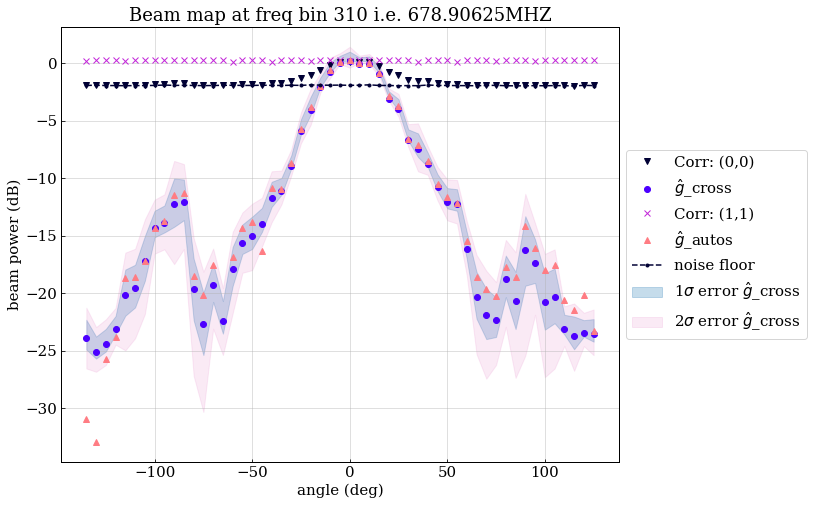

In [577]:
#Plotting beam pattern with correlator as well as vna data: 
colorsarr=cm.gnuplot2(np.linspace(0,1,2048))
fig = plt.figure(figsize=[10,8])
ax = plt.subplot(111)

#Logarithmic scale -- 
#angles1=np.arange(-130,140,10) ## x-range for VNA data 
angles = np.arange(-135,130,5) 
#ax.plot(angles1, list(reversed(s12mags)), ".", c=colorsarr[f_ind-100], label='S12 from VNA')
ax.plot(angles, autolog_0x0, "v", c=colorsarr[f_ind-200], label='Corr: (0,0)')
ax.plot(angles, crosslog_0x1, "o",  c=colorsarr[f_ind+400],label='$\hat{g}$_cross')
ax.plot(angles, autolog_1x1, "x", c=colorsarr[f_ind+700],label='Corr: (1,1)')
ax.plot(angles, g_autolog_0x0, "^", c=colorsarr[f_ind-1000],label='$\hat{g}$_autos')
ax.plot(angles, autolog_0x0_off, ".--", c=colorsarr[f_ind-200], label='noise floor')

ax.fill_between(angles, yerr_cross_lo, yerr_cross_hi, alpha=0.25, color='tab:blue', label='1$\sigma$ error $\hat{g}$_cross')
ax.fill_between(angles, yerr_cross_lo2, yerr_cross_hi2, alpha=0.15, color='tab:pink', label='2$\sigma$ error $\hat{g}$_cross')
#ax.fill_between(angles, yerr_gauto_lo, yerr_gauto_hi, alpha=0.25, color='tab:cyan', label='1$\sigma$ error $\hat{g}$_auto')
#ax.fill_between(angles, yerr_gauto_lo2, yerr_gauto_hi2, alpha=0.15, color='tab:red', label='2$\sigma$ error $\hat{g}$_auto')
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5)) 
freq=400+((1024-f_ind)*0.390625)
plt.title("Beam map at freq bin {} i.e. {}MHZ".format(f_ind, freq))
plt.xlabel("angle (deg)")
plt.ylabel("beam power (dB)")
plt.show()

